In [1]:
""" 
!git clone -b EMT https://github.com/pop756/Quantum_KAN.git
%cd Quantum_KAN
!pip install -r requirements.txt """

Cloning into 'Quantum_KAN'...
remote: Enumerating objects: 926, done.
remote: Counting objects: 100% (89/89), done.
remote: Compressing objects: 100% (80/80), done.
remote: Total 926 (delta 35), reused 40 (delta 9), pack-reused 837
Receiving objects: 100% (926/926), 24.66 MiB | 10.40 MiB/s, done.
Resolving deltas: 100% (153/153), done.
/content/Quantum_KAN
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.8/1.8 MB 12.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 69.2/69.2 kB 4.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.9/2.9 MB 18.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.3/4.3 MB 42.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 12.4/12.4 MB 22.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 162.6/162.6 kB 12.3 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 249.9/249.9 kB 8.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━

In [1]:
""" !pip install qiskit_experiments """

  Using cached PyYAML-6.0.1-cp311-cp311-win_amd64.whl.metadata (2.1 kB)
   ---------------------------------------- 0.0/727.5 kB ? eta -:--:--
   --------- ------------------------------ 174.1/727.5 kB 5.1 MB/s eta 0:00:01
   ----------------------------- ---------- 542.7/727.5 kB 6.7 MB/s eta 0:00:01
   ---------------------------------------- 727.5/727.5 kB 6.5 MB/s eta 0:00:00
   ---------------------------------------- 0.0/57.2 kB ? eta -:--:--
   ---------------------------------------- 57.2/57.2 kB 3.1 MB/s eta 0:00:00
   ---------------------------------------- 0.0/105.9 kB ? eta -:--:--
   ---------------------------------------- 105.9/105.9 kB ? eta 0:00:00
   ---------------------------------------- 0.0/58.3 kB ? eta -:--:--
   ---------------------------------------- 58.3/58.3 kB 1.5 MB/s eta 0:00:00
Using cached PyYAML-6.0.1-cp311-cp311-win_amd64.whl (144 kB)


In [1]:
from typing import List, Tuple, Sequence, Optional, Type

import numpy as np
from qiskit import pulse, circuit, QuantumCircuit
from qiskit.circuit.parameterexpression import ParameterValueType
from qiskit.exceptions import QiskitError
from qiskit.providers import Backend
from qiskit_experiments.framework import (
    BaseExperiment,
    BackendTiming,
    Options,
)
from qiskit_experiments.library.characterization import CrossResonanceHamiltonian

class EchoedCrossResonanceHamiltonian(CrossResonanceHamiltonian):
    r"""Echoed cross resonance Hamiltonian tomography experiment.

    # section: overview

        This is a variant of :class:`CrossResonanceHamiltonian`
        for which the experiment framework is identical but the
        cross resonance operation is realized as an echoed sequence
        to remove unwanted single qubit rotations. The cross resonance
        circuit looks like:

        .. parsed-literal::

                 ┌────────────────────┐  ┌───┐  ┌────────────────────┐
            q_0: ┤0                   ├──┤ X ├──┤0                   ├──────────
                 │  cr_tone(duration) │┌─┴───┴─┐│  cr_tone(duration) │┌────────┐
            q_1: ┤1                   ├┤ Rz(π) ├┤1                   ├┤ Rz(-π) ├
                 └────────────────────┘└───────┘└────────────────────┘└────────┘

        Here two ``cr_tone`` are applied, where the latter one is with the
        control qubit state flipped and with a phase flip of the target qubit frame.
        This operation is equivalent to applying the ``cr_tone`` with a negative amplitude.
        The Hamiltonian for this decomposition has no IX and ZI interactions,
        and also a reduced IY interaction to some extent (not completely eliminated) [1].
        Note that the CR Hamiltonian tomography experiment cannot detect the ZI term.
        However, it is sensitive to the IX and IY terms.

    # section: reference
        .. ref_arxiv:: 1 2007.02925

    """
    num_pulses = 2


    def __init__(self,c_angle,x_angle ,*args, **kwargs):
        super(EchoedCrossResonanceHamiltonian, self).__init__(*args, **kwargs)
        self.c_angle = c_angle
        self.x_angle = x_angle
            
    

    def _build_cr_circuit(self, pulse_gate: circuit.Gate) -> QuantumCircuit:
        """Single tone cross resonance.

        Args:
            pulse_gate: A pulse gate to represent a single cross resonance pulse.

        Returns:
            A circuit definition for the cross resonance pulse to measure.
        """
        cr_circuit = QuantumCircuit(2)
        cr_circuit.append(pulse_gate, [0, 1])
        cr_circuit.x(0)
        cr_circuit.rz(np.pi, 1)
        cr_circuit.append(pulse_gate, [0, 1])
        cr_circuit.rz(-np.pi, 1)
        return cr_circuit
    
    def _build_default_schedule(self) -> pulse.ScheduleBlock:
        """GaussianSquared cross resonance pulse.

        Returns:
            A schedule definition for the cross resonance pulse to measure.
        """
        opt = self.experiment_options
        duration = circuit.Parameter("duration")

        cr_drive = self._backend_data.control_channel(self.physical_qubits)[0]
        c_drive = self._backend_data.drive_channel(self.physical_qubits[0])
        t_drive = self._backend_data.drive_channel(self.physical_qubits[1])

        with pulse.build(default_alignment="left", name="cr") as cross_resonance:
            # add cross resonance tone
            pulse.play(
                pulse.GaussianSquare(
                    duration=duration,
                    amp=opt.amp,
                    sigma=opt.sigma,
                    risefall_sigma_ratio=opt.risefall,
                    angle = self.c_angle
                ),
                cr_drive,
            )
            # add cancellation tone
            if not np.isclose(opt.amp_t, 0.0):
                pulse.play(
                    pulse.GaussianSquare(
                        duration=duration,
                        amp=opt.amp_t,
                        sigma=opt.sigma,
                        risefall_sigma_ratio=opt.risefall,
                        angle = self.x_angle
                    ),
                    t_drive,
                )
            else:
                pulse.delay(duration, t_drive)

            # place holder for empty drive channels. this is necessary due to known pulse gate bug.
            pulse.delay(duration, c_drive)

        return cross_resonance

In [3]:
from qiskit import circuit
from qiskit import QuantumCircuit
class EchoedCrossResonanceHamiltonian_double(EchoedCrossResonanceHamiltonian):
    r"""Echoed cross resonance Hamiltonian tomography experiment.

    # section: overview

        This is a variant of :class:`CrossResonanceHamiltonian`
        for which the experiment framework is identical but the
        cross resonance operation is realized as an echoed sequence
        to remove unwanted single qubit rotations. The cross resonance
        circuit looks like:

        .. parsed-literal::

                 ┌────────────────────┐  ┌───┐  ┌────────────────────┐
            q_0: ┤0                   ├──┤ X ├──┤0                   ├──────────
                 │  cr_tone(duration) │┌─┴───┴─┐│  cr_tone(duration) │┌────────┐
            q_1: ┤1                   ├┤ Rz(π) ├┤1                   ├┤ Rz(-π) ├
                 └────────────────────┘└───────┘└────────────────────┘└────────┘

        Here two ``cr_tone`` are applied, where the latter one is with the
        control qubit state flipped and with a phase flip of the target qubit frame.
        This operation is equivalent to applying the ``cr_tone`` with a negative amplitude.
        The Hamiltonian for this decomposition has no IX and ZI interactions,
        and also a reduced IY interaction to some extent (not completely eliminated) [1].
        Note that the CR Hamiltonian tomography experiment cannot detect the ZI term.
        However, it is sensitive to the IX and IY terms.

    # section: reference
        .. ref_arxiv:: 1 2007.02925

    """
    num_pulses = 4

    def _build_cr_circuit(self, pulse_gate: circuit.Gate) -> QuantumCircuit:
        """Single tone cross resonance.

        Args:
            pulse_gate: A pulse gate to represent a single cross resonance pulse.

        Returns:
            A circuit definition for the cross resonance pulse to measure.
        """
        cr_circuit = QuantumCircuit(2)
        cr_circuit.append(pulse_gate, [0, 1])
        cr_circuit.x(0)
        
        cr_circuit.rz(np.pi, 1)
        cr_circuit.append(pulse_gate, [0, 1])
        cr_circuit.rz(-np.pi, 1)
        cr_circuit.x(0)


        cr_circuit.rz(np.pi, 1)
        cr_circuit.append(pulse_gate, [0, 1])
        cr_circuit.rz(-np.pi, 1)
        cr_circuit.x(0)
        cr_circuit.append(pulse_gate, [0, 1])
        cr_circuit.x(0)
        return cr_circuit
    
    
    

In [2]:
from qiskit import circuit
from qiskit import QuantumCircuit
class EchoedCrossResonanceHamiltonian_double(EchoedCrossResonanceHamiltonian):
    r"""Echoed cross resonance Hamiltonian tomography experiment.

    # section: overview

        This is a variant of :class:`CrossResonanceHamiltonian`
        for which the experiment framework is identical but the
        cross resonance operation is realized as an echoed sequence
        to remove unwanted single qubit rotations. The cross resonance
        circuit looks like:

        .. parsed-literal::

                 ┌────────────────────┐  ┌───┐  ┌────────────────────┐
            q_0: ┤0                   ├──┤ X ├──┤0                   ├──────────
                 │  cr_tone(duration) │┌─┴───┴─┐│  cr_tone(duration) │┌────────┐
            q_1: ┤1                   ├┤ Rz(π) ├┤1                   ├┤ Rz(-π) ├
                 └────────────────────┘└───────┘└────────────────────┘└────────┘

        Here two ``cr_tone`` are applied, where the latter one is with the
        control qubit state flipped and with a phase flip of the target qubit frame.
        This operation is equivalent to applying the ``cr_tone`` with a negative amplitude.
        The Hamiltonian for this decomposition has no IX and ZI interactions,
        and also a reduced IY interaction to some extent (not completely eliminated) [1].
        Note that the CR Hamiltonian tomography experiment cannot detect the ZI term.
        However, it is sensitive to the IX and IY terms.

    # section: reference
        .. ref_arxiv:: 1 2007.02925

    """
    num_pulses = 4

    def _build_cr_circuit(self, pulse_gate: circuit.Gate) -> QuantumCircuit:
        """Single tone cross resonance.

        Args:
            pulse_gate: A pulse gate to represent a single cross resonance pulse.

        Returns:
            A circuit definition for the cross resonance pulse to measure.
        """
        cr_circuit = QuantumCircuit(2)
        cr_circuit.append(pulse_gate, [0, 1])
        cr_circuit.x(0)
        
        cr_circuit.rz(np.pi, 1)
        cr_circuit.append(pulse_gate, [0, 1])
        cr_circuit.rz(-np.pi, 1)
        cr_circuit.x(0)


        cr_circuit.rz(np.pi, 1)
        cr_circuit.append(pulse_gate, [0, 1])
        cr_circuit.rz(-np.pi, 1)
        cr_circuit.x(0)
        cr_circuit.append(pulse_gate, [0, 1])
        cr_circuit.x(0)
        
        return cr_circuit

In [42]:
from qiskit import circuit
from qiskit import QuantumCircuit
class EchoedCrossResonanceHamiltonian_double_X(EchoedCrossResonanceHamiltonian):
    r"""Echoed cross resonance Hamiltonian tomography experiment.

    # section: overview

        This is a variant of :class:`CrossResonanceHamiltonian`
        for which the experiment framework is identical but the
        cross resonance operation is realized as an echoed sequence
        to remove unwanted single qubit rotations. The cross resonance
        circuit looks like:

        .. parsed-literal::

                 ┌────────────────────┐  ┌───┐  ┌────────────────────┐
            q_0: ┤0                   ├──┤ X ├──┤0                   ├──────────
                 │  cr_tone(duration) │┌─┴───┴─┐│  cr_tone(duration) │┌────────┐
            q_1: ┤1                   ├┤ Rz(π) ├┤1                   ├┤ Rz(-π) ├
                 └────────────────────┘└───────┘└────────────────────┘└────────┘

        Here two ``cr_tone`` are applied, where the latter one is with the
        control qubit state flipped and with a phase flip of the target qubit frame.
        This operation is equivalent to applying the ``cr_tone`` with a negative amplitude.
        The Hamiltonian for this decomposition has no IX and ZI interactions,
        and also a reduced IY interaction to some extent (not completely eliminated) [1].
        Note that the CR Hamiltonian tomography experiment cannot detect the ZI term.
        However, it is sensitive to the IX and IY terms.

    # section: reference
        .. ref_arxiv:: 1 2007.02925

    """
    num_pulses = 4

    def _build_cr_circuit(self, pulse_gate: circuit.Gate) -> QuantumCircuit:
        """Single tone cross resonance.

        Args:
            pulse_gate: A pulse gate to represent a single cross resonance pulse.

        Returns:
            A circuit definition for the cross resonance pulse to measure.
        """
        cr_circuit = QuantumCircuit(2)
        cr_circuit.append(pulse_gate, [0, 1])
        
        cr_circuit.rz(np.pi, 1)
        cr_circuit.append(pulse_gate, [0, 1])
        cr_circuit.rz(-np.pi, 1)
        cr_circuit.x(0)
        cr_circuit.x(1)
        
        cr_circuit.append(pulse_gate, [0, 1])
        cr_circuit.rz(np.pi, 1)
        cr_circuit.append(pulse_gate, [0, 1])
        cr_circuit.rz(-np.pi, 1)
        cr_circuit.x(0)
        cr_circuit.x(1)
        return cr_circuit

In [4]:
from qiskit import circuit
from qiskit import QuantumCircuit

class EchoedCrossResonanceHamiltonian_only(EchoedCrossResonanceHamiltonian):
    r"""Echoed cross resonance Hamiltonian tomography experiment.

    # section: overview

        This is a variant of :class:`CrossResonanceHamiltonian`
        for which the experiment framework is identical but the
        cross resonance operation is realized as an echoed sequence
        to remove unwanted single qubit rotations. The cross resonance
        circuit looks like:

        .. parsed-literal::

                 ┌────────────────────┐  ┌───┐  ┌────────────────────┐
            q_0: ┤0                   ├──┤ X ├──┤0                   ├──────────
                 │  cr_tone(duration) │┌─┴───┴─┐│  cr_tone(duration) │┌────────┐
            q_1: ┤1                   ├┤ Rz(π) ├┤1                   ├┤ Rz(-π) ├
                 └────────────────────┘└───────┘└────────────────────┘└────────┘

        Here two ``cr_tone`` are applied, where the latter one is with the
        control qubit state flipped and with a phase flip of the target qubit frame.
        This operation is equivalent to applying the ``cr_tone`` with a negative amplitude.
        The Hamiltonian for this decomposition has no IX and ZI interactions,
        and also a reduced IY interaction to some extent (not completely eliminated) [1].
        Note that the CR Hamiltonian tomography experiment cannot detect the ZI term.
        However, it is sensitive to the IX and IY terms.

    # section: reference
        .. ref_arxiv:: 1 2007.02925

    """
    num_pulses = 4

    def _build_cr_circuit(self, pulse_gate: circuit.Gate) -> QuantumCircuit:
        """Single tone cross resonance.

        Args:
            pulse_gate: A pulse gate to represent a single cross resonance pulse.

        Returns:
            A circuit definition for the cross resonance pulse to measure.
        """
        cr_circuit = QuantumCircuit(2)
        cr_circuit.append(pulse_gate, [0, 1])
        return cr_circuit
    

In [1]:
from functions.Train_ZNE import check_connect
from qiskit_ibm_runtime import QiskitRuntimeService
import qiskit_ibm_provider
from qiskit_aer import AerSimulator
from qiskit.circuit.library import RealAmplitudes,EfficientSU2

service = QiskitRuntimeService(channel='ibm_quantum',
    instance='ibm-q-skku/skku/skku-students',
    token = '06f802eeac992c43c4106753d7c5fc31414a13eb7d91c99d67fb49cc50569e5b4b011f20c71b9607a07cb43ecc7044557c699022db91d1685ba4c886d5886854')
backend = service.backend('ibm_kyoto')


C:\Users\pop75\AppData\Local\Temp\ipykernel_5436\970959653.py:3: DeprecationWarning: The package qiskit_ibm_provider is being deprecated. Please see https://docs.quantum.ibm.com/api/migration-guides/qiskit-runtime to get instructions on how to migrate to qiskit-ibm-runtime (https://github.com/Qiskit/qiskit-ibm-runtime).
  import qiskit_ibm_provider


In [2]:
import numpy as np
init_list = check_connect(backend,[78,79,80,81,82,83,84,85])
init_list




([(80, 79), (79, 78), (84, 83), (82, 81), (81, 80), (84, 85), (82, 83)],
 [(2, 1), (1, 0), (6, 5), (4, 3), (3, 2), (6, 7), (4, 5)])

In [3]:
from qiskit_experiments.library import CrossResonanceHamiltonian
from qiskit.circuit import Gate

""" init_list = check_connect(backend,[78,79,80,81,82,83,84,85])

for init in init_list[0]:
    c_params = backend.target['ecr'][init].calibration.instructions[1][1].pulse._params
    amp_c = c_params['amp'] 
    angle_c = c_params['angle']
    x_params = backend.target['ecr'][init].calibration.instructions[0][1].pulse._params
    amp_x = x_params['amp']
    angle_x = x_params['angle']
    print(amp_c,amp_x,backend.target['ecr'][init].calibration.instructions[1][1].pulse.duration)
    cr_ham_experiment = EchoedCrossResonanceHamiltonian_only(
        physical_qubits=init,
        durations=np.linspace(1.e-7, 5e-7, 20),
        amp = amp_c,
        amp_t = amp_x,
        backend=backend,
        c_angle= angle_c,
        x_angle= angle_x
    )
    cr_ham_experiment.experiment_options.sigma = 32
    data_cr = cr_ham_experiment.run().block_for_results()
    Fig = data_cr.figure(0)
    Fig.figure.savefig(f'./ecr_data_{init}') """

" init_list = check_connect(backend,[78,79,80,81,82,83,84,85])\n\nfor init in init_list[0]:\n    c_params = backend.target['ecr'][init].calibration.instructions[1][1].pulse._params\n    amp_c = c_params['amp'] \n    angle_c = c_params['angle']\n    x_params = backend.target['ecr'][init].calibration.instructions[0][1].pulse._params\n    amp_x = x_params['amp']\n    angle_x = x_params['angle']\n    print(amp_c,amp_x,backend.target['ecr'][init].calibration.instructions[1][1].pulse.duration)\n    cr_ham_experiment = EchoedCrossResonanceHamiltonian_only(\n        physical_qubits=init,\n        durations=np.linspace(1.e-7, 5e-7, 20),\n        amp = amp_c,\n        amp_t = amp_x,\n        backend=backend,\n        c_angle= angle_c,\n        x_angle= angle_x\n    )\n    cr_ham_experiment.experiment_options.sigma = 32\n    data_cr = cr_ham_experiment.run().block_for_results()\n    Fig = data_cr.figure(0)\n    Fig.figure.savefig(f'./ecr_data_{init}') "

In [4]:
from qiskit_experiments.library import CrossResonanceHamiltonian
from qiskit.circuit import Gate

""" init_list = check_connect(backend,[78,79,80,81,82,83,84,85])

for init in init_list[0]:
    c_params = backend.target['ecr'][init].calibration.instructions[1][1].pulse._params
    amp_c = c_params['amp'] 
    angle_c = c_params['angle']
    x_params = backend.target['ecr'][init].calibration.instructions[0][1].pulse._params
    amp_x = x_params['amp']
    angle_x = x_params['angle']
    print(amp_c,amp_x,backend.target['ecr'][init].calibration.instructions[1][1].pulse.duration)
    cr_ham_experiment = EchoedCrossResonanceHamiltonian_only(
        physical_qubits=init,
        durations=np.linspace(1.e-7, 20e-7, 20),
        amp = amp_c,
        #amp_t = amp_x,
        backend=backend,
        c_angle= angle_c,
        x_angle= angle_x
    )
    cr_ham_experiment.experiment_options.sigma = 32
    data_cr = cr_ham_experiment.run().block_for_results()
    Fig = data_cr.figure(0)
    Fig.figure.savefig(f'./ecr_only_data_{init}') """

" init_list = check_connect(backend,[78,79,80,81,82,83,84,85])\n\nfor init in init_list[0]:\n    c_params = backend.target['ecr'][init].calibration.instructions[1][1].pulse._params\n    amp_c = c_params['amp'] \n    angle_c = c_params['angle']\n    x_params = backend.target['ecr'][init].calibration.instructions[0][1].pulse._params\n    amp_x = x_params['amp']\n    angle_x = x_params['angle']\n    print(amp_c,amp_x,backend.target['ecr'][init].calibration.instructions[1][1].pulse.duration)\n    cr_ham_experiment = EchoedCrossResonanceHamiltonian_only(\n        physical_qubits=init,\n        durations=np.linspace(1.e-7, 20e-7, 20),\n        amp = amp_c,\n        #amp_t = amp_x,\n        backend=backend,\n        c_angle= angle_c,\n        x_angle= angle_x\n    )\n    cr_ham_experiment.experiment_options.sigma = 32\n    data_cr = cr_ham_experiment.run().block_for_results()\n    Fig = data_cr.figure(0)\n    Fig.figure.savefig(f'./ecr_only_data_{init}') "

In [5]:
from qiskit_experiments.library import CrossResonanceHamiltonian
from qiskit.circuit import Gate

""" init_list = check_connect(backend,[78,79,80,81,82,83,84,85])

for init in init_list[0]:
    c_params = backend.target['ecr'][init].calibration.instructions[1][1].pulse._params
    amp_c = c_params['amp'] 
    angle_c = c_params['angle']
    x_params = backend.target['ecr'][init].calibration.instructions[0][1].pulse._params
    amp_x = x_params['amp']
    angle_x = x_params['angle']
    print(amp_c,amp_x,backend.target['ecr'][init].calibration.instructions[1][1].pulse.duration)
    cr_ham_experiment = EchoedCrossResonanceHamiltonian_only(
        physical_qubits=init,
        durations=np.linspace(1.e-7, 20e-7, 20),
        amp = amp_c,
        amp_t = amp_x*0.14,
        backend=backend,
        c_angle= angle_c,
        x_angle= angle_x
    )
    cr_ham_experiment.experiment_options.sigma = 32
    data_cr = cr_ham_experiment.run().block_for_results()
    Fig = data_cr.figure(0)
    Fig.figure.savefig(f'./ecr_only_data_0.25_{init}.svg') """

" init_list = check_connect(backend,[78,79,80,81,82,83,84,85])\n\nfor init in init_list[0]:\n    c_params = backend.target['ecr'][init].calibration.instructions[1][1].pulse._params\n    amp_c = c_params['amp'] \n    angle_c = c_params['angle']\n    x_params = backend.target['ecr'][init].calibration.instructions[0][1].pulse._params\n    amp_x = x_params['amp']\n    angle_x = x_params['angle']\n    print(amp_c,amp_x,backend.target['ecr'][init].calibration.instructions[1][1].pulse.duration)\n    cr_ham_experiment = EchoedCrossResonanceHamiltonian_only(\n        physical_qubits=init,\n        durations=np.linspace(1.e-7, 20e-7, 20),\n        amp = amp_c,\n        amp_t = amp_x*0.14,\n        backend=backend,\n        c_angle= angle_c,\n        x_angle= angle_x\n    )\n    cr_ham_experiment.experiment_options.sigma = 32\n    data_cr = cr_ham_experiment.run().block_for_results()\n    Fig = data_cr.figure(0)\n    Fig.figure.savefig(f'./ecr_only_data_0.25_{init}.svg') "

In [6]:
from functions.ECR_sweep import CrossResonanceHamiltonian_x_amp_sweep
import numpy as np
cr_ham_experiment = CrossResonanceHamiltonian_x_amp_sweep(
        physical_qubits=(0,1),
        duration=300,
        amp = 0.3,
        amps = np.linspace(1.e-7, 3e-7, 20),
        backend=backend,
        
        #c_angle= 0,
        #x_angle= 0
    )
cr_ham_experiment.experiment_options.sigma = 32

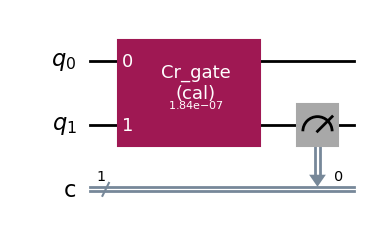

In [10]:
from qiskit import schedule
cr_ham_experiment.circuits()[50].draw('mpl')

In [45]:
from qiskit_experiments.library import CrossResonanceHamiltonian
from qiskit.circuit import Gate
import math
import json
from matplotlib import pyplot as plt
init_list = check_connect(backend,[78,79,80,81,82,83,84,85])
def angle_to_amp(real,imag):
    amp = math.sqrt(real**2 + imag**2)
    angle = math.atan2(imag,real)
    return amp,angle

def amp_to_angle(amp,angle):
    real = amp*math.cos(angle)
    imag = amp*math.sin(angle)
    return real,imag
with open('IX.json','r') as file:
    X_data = json.load(file)
def amp_x_rate(x_rate):
    for init in init_list[0]:
        c_params = backend.target['ecr'][init].calibration.instructions[1][1].pulse._params
        amp_c = c_params['amp'] 
        angle_c = c_params['angle']
        x_params = backend.target['ecr'][init].calibration.instructions[0][1].pulse._params
        amp_x = x_params['amp']
        angle_x = x_params['angle']
        print(angle_x)
        value = X_data['value'][str(init)]
        offset = X_data['offset'][str(init)]
        rate = (x_rate-offset)/(value-offset)
        
        real_x,imag_x = amp_to_angle(amp_x,angle_x)
        real_x = real_x*rate
        
        amp_x,angle_x = angle_to_amp(real_x,imag_x)
        
        print(amp_c,amp_x,angle_x,backend.target['ecr'][init].calibration.instructions[1][1].pulse.duration)
        cr_ham_experiment = EchoedCrossResonanceHamiltonian_double(
            physical_qubits=init,
            durations=np.linspace(1.e-7, 3e-7, 20),
            amp = amp_c,
            amp_t = amp_x,
            backend=backend,
            c_angle= angle_c,
            x_angle= angle_x
        )
        cr_ham_experiment.experiment_options.sigma = 32
        data_cr = cr_ham_experiment.run().block_for_results()
        Fig = data_cr.figure(0)
        Fig.figure.savefig(f'./ecr_double_{x_rate}_{init}.svg')
        # 첫 번째 플롯
        x_list =[]
        data_list_0 = []
        data_list_1 = []
        
        for data in data_cr.data():
            if data['metadata']['meas_basis'] == 'z':
                if data['metadata']['control_state'] == 0:
                    x_list.append(data['metadata']['xval'])
                    data_list_0.append((data['counts']['0']-data['counts']['1'])/(data['counts']['0']+data['counts']['1']))
                else:
                    data_list_1.append((data['counts']['0']-data['counts']['1'])/(data['counts']['0']+data['counts']['1']))
        
        
        plt.figure()
        plt.plot(x_list,data_list_0,'bo')
        plt.plot(x_list,data_list_1,'ro')
        plt.ylim(0.8,1)
        plt.title('Z_measure_data')
        plt.grid(True)
        plt.savefig(f"ecr_double_z_{x_rate}_{init}.png")
        plt.show()

        x_list =[]
        data_list_0 = []
        data_list_1 = []
        
        for data in data_cr.data():
            if data['metadata']['meas_basis'] == 'x':
                if data['metadata']['control_state'] == 0:
                    x_list.append(data['metadata']['xval'])
                    data_list_0.append((data['counts']['0']-data['counts']['1'])/(data['counts']['0']+data['counts']['1']))
                else:
                    data_list_1.append((data['counts']['0']-data['counts']['1'])/(data['counts']['0']+data['counts']['1']))
        # 첫 번째 플롯
        plt.figure()
        plt.plot(x_list,data_list_0,'bo-')
        plt.plot(x_list,data_list_1,'ro-')
        plt.ylim(-0.2,0.2)
        plt.title('X_measure_data')
        plt.grid(True)
        plt.savefig(f"ecr_double_x_{x_rate}_{init}.png")
        plt.show()
        
        x_list =[]
        data_list_0 = []
        data_list_1 = []
        
        for data in data_cr.data():
            if data['metadata']['meas_basis'] == 'y':
                if data['metadata']['control_state'] == 0:
                    x_list.append(data['metadata']['xval'])
                    data_list_0.append((data['counts']['0']-data['counts']['1'])/(data['counts']['0']+data['counts']['1']))
                else:
                    data_list_1.append((data['counts']['0']-data['counts']['1'])/(data['counts']['0']+data['counts']['1']))
        # 첫 번째 플롯
        plt.figure()
        plt.plot(x_list,data_list_0,'bo-')
        plt.plot(x_list,data_list_1,'ro-')
        plt.ylim(-0.2,0.2)
        plt.title('Y_measure_data')
        plt.grid(True)
        plt.savefig(f"ecr_double_y_{x_rate}_{init}.png")
        plt.show()

-0.014547470622827918
0.10722142868729484 0.036781360021903825 -0.013318767874559267 600


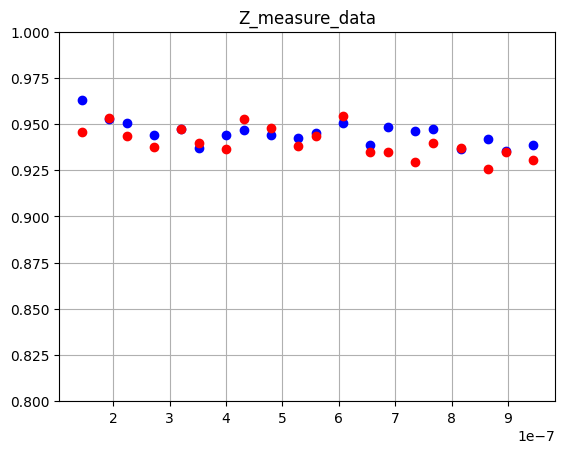

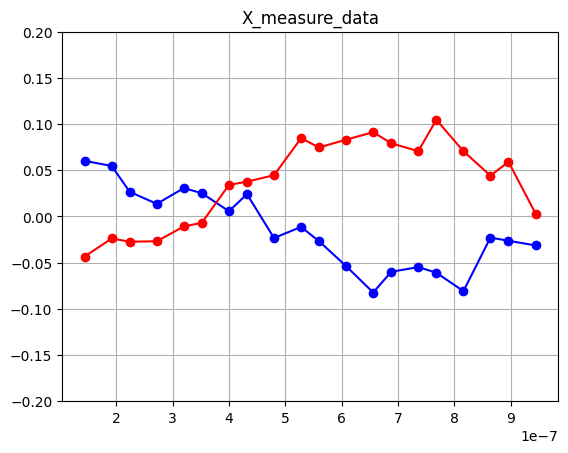

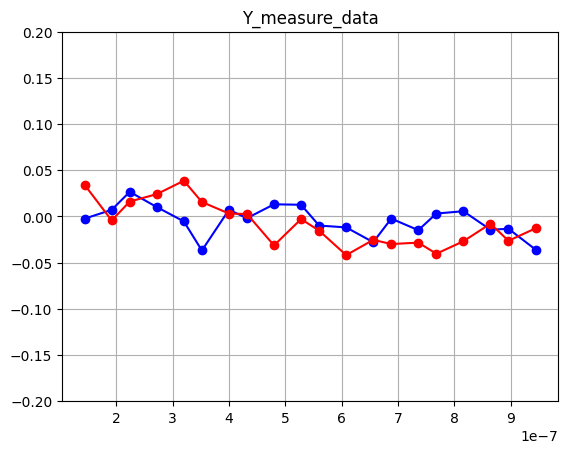

0.03969377799067167
0.12961987420785068 0.03729754824464515 0.03887691847733381 600


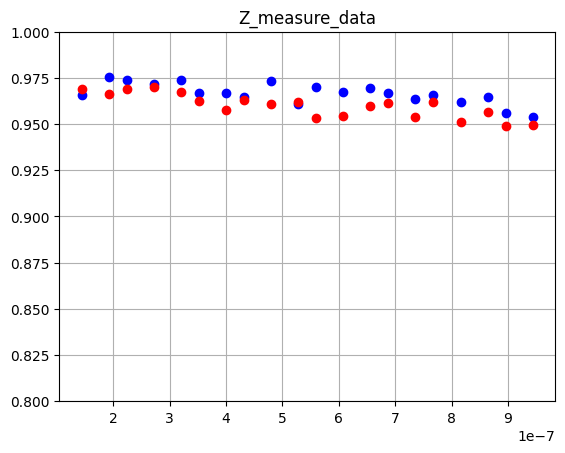

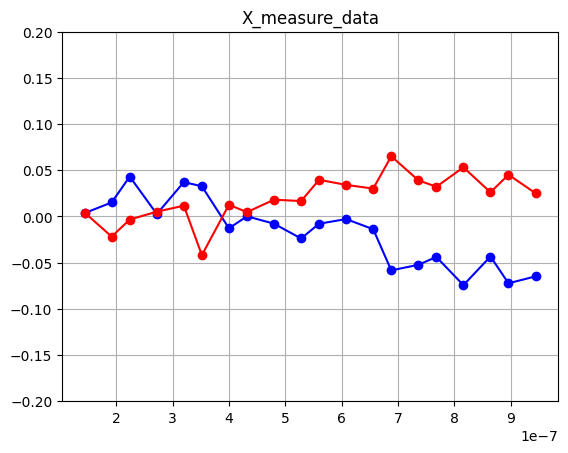

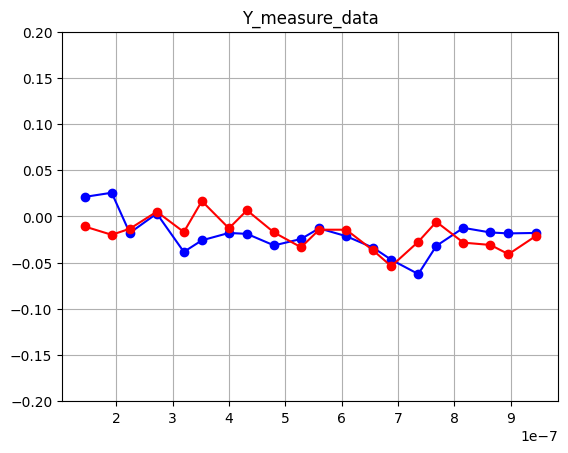

0.04509137694848309
0.10952263074299179 0.03818260096262094 0.046025637552042815 600


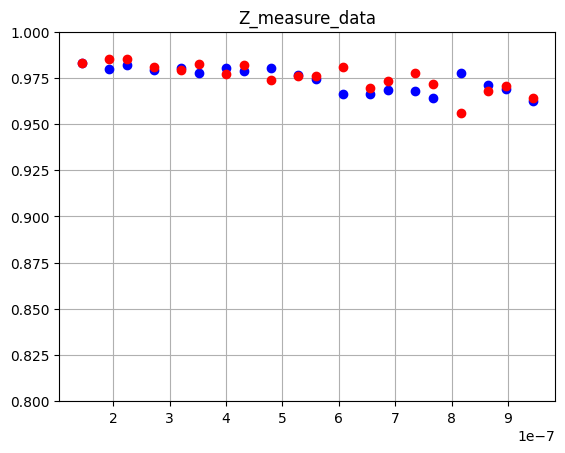

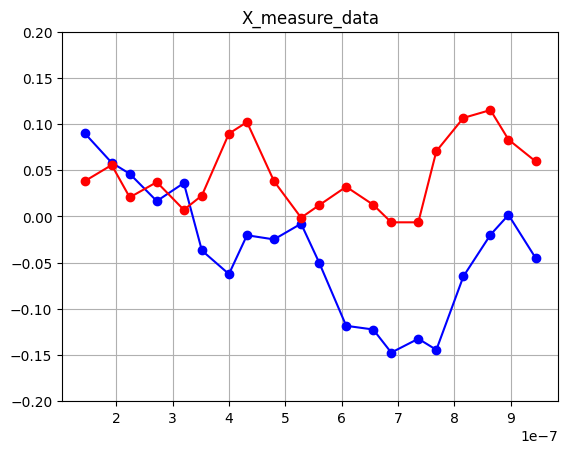

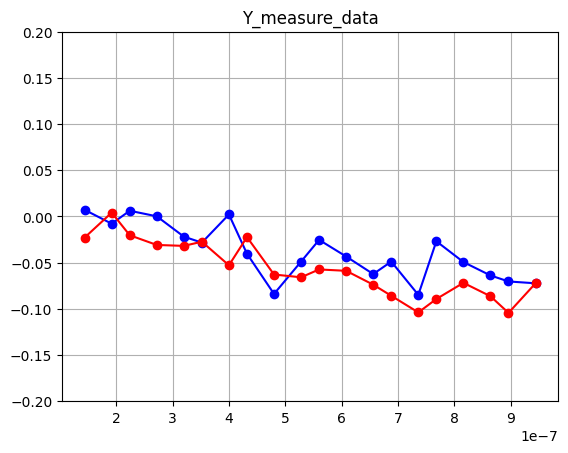

0.026161611479073324
0.09998979967430136 0.04515359434530946 0.020718395331699346 600


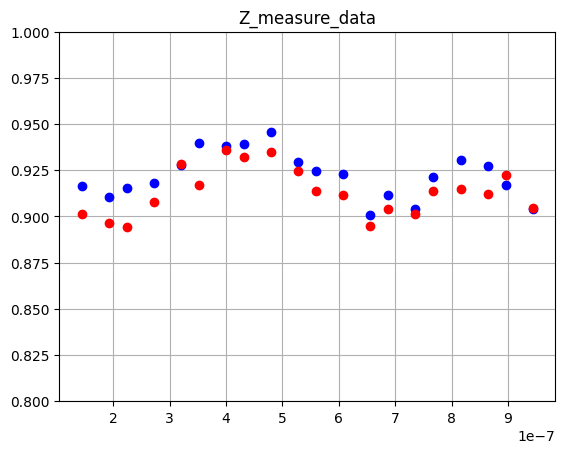

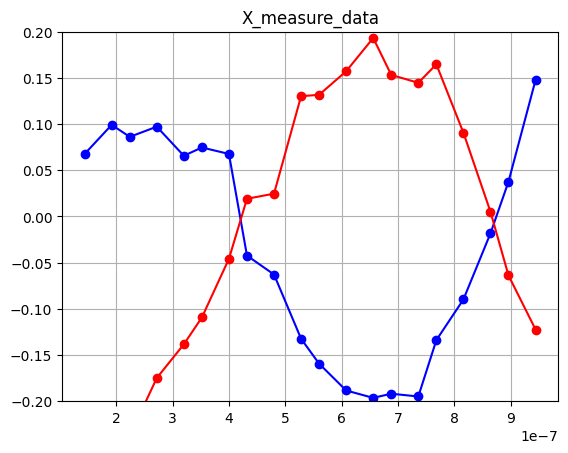

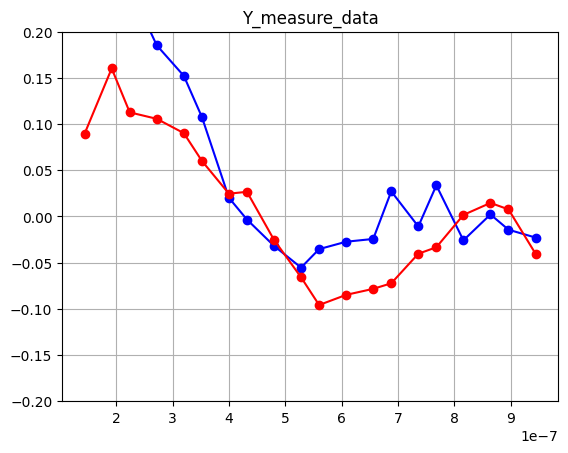

0.05589715191431469
0.19326202801370715 0.04033824782834368 0.05355273845786941 600


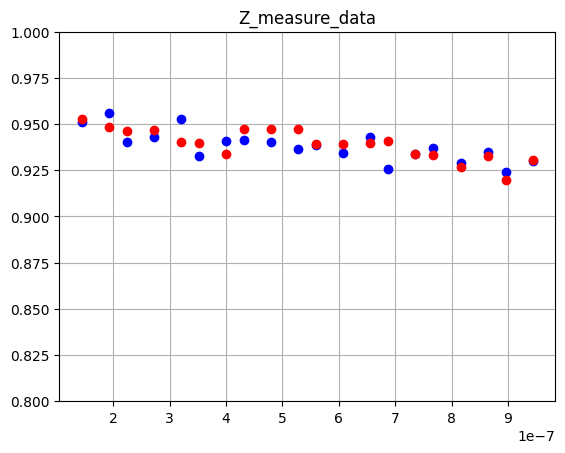

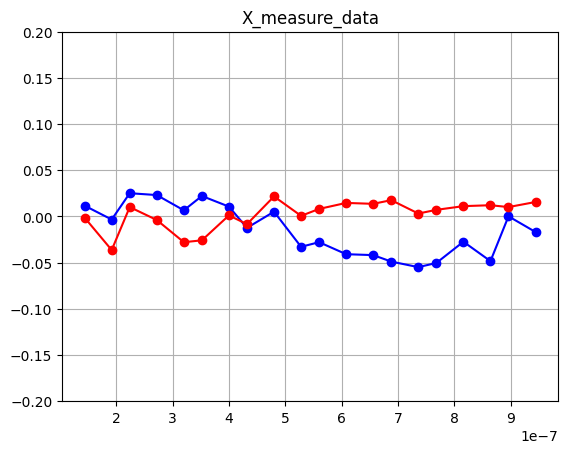

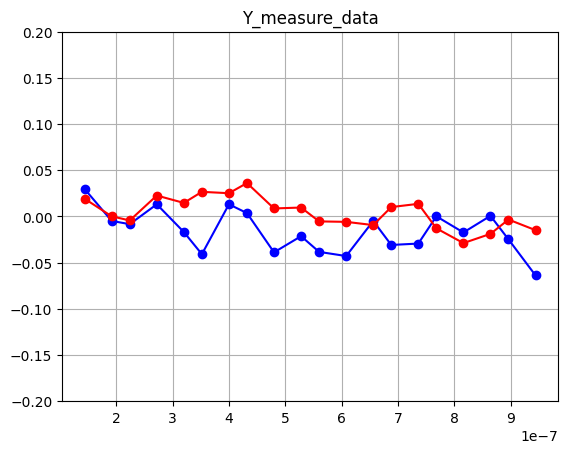

0.04082358338569974
0.14988384011128564 0.03505696107757544 0.043212353323139475 600


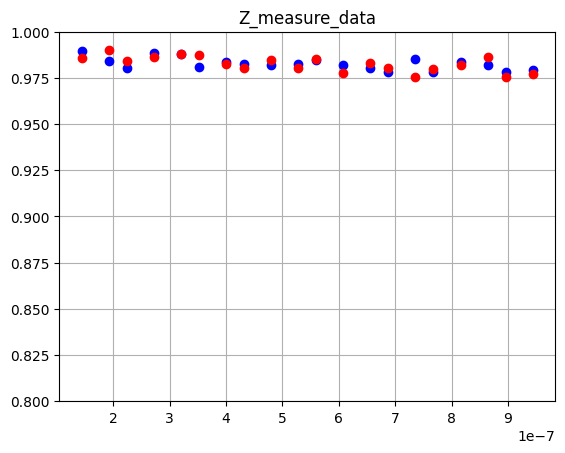

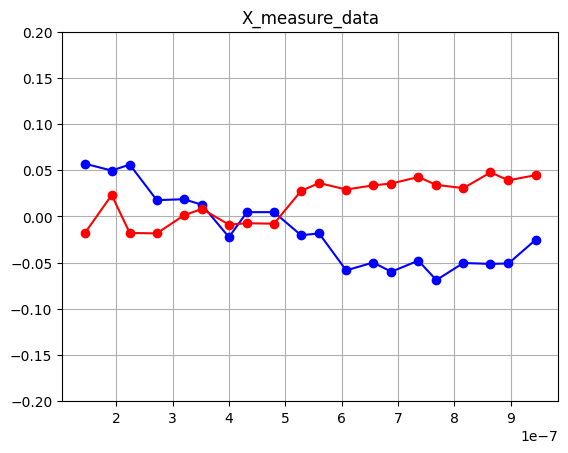

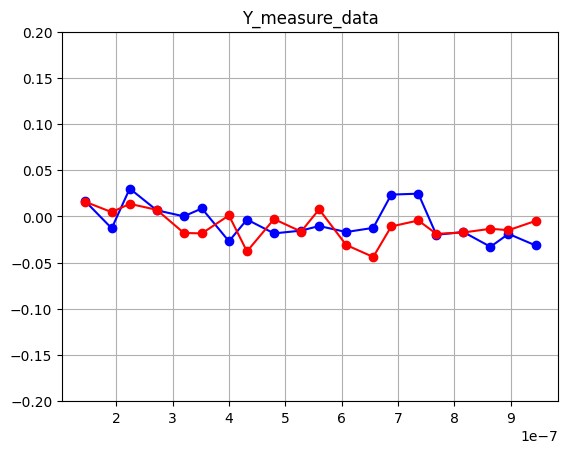

0.039754687428864864
0.15746744370411117 0.03888441926021364 0.040376362217450196 600


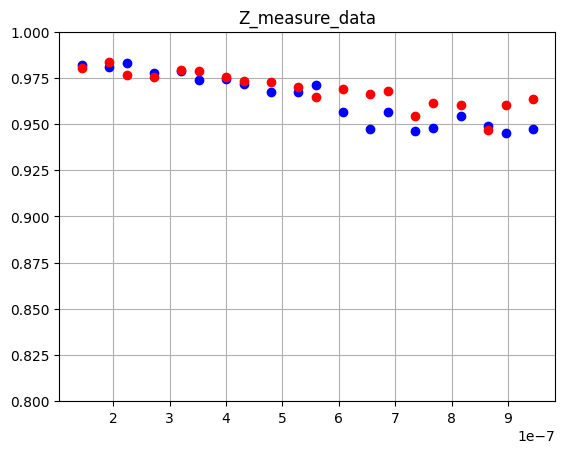

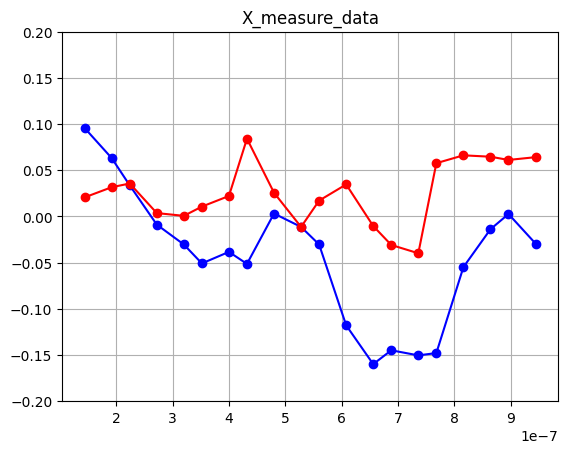

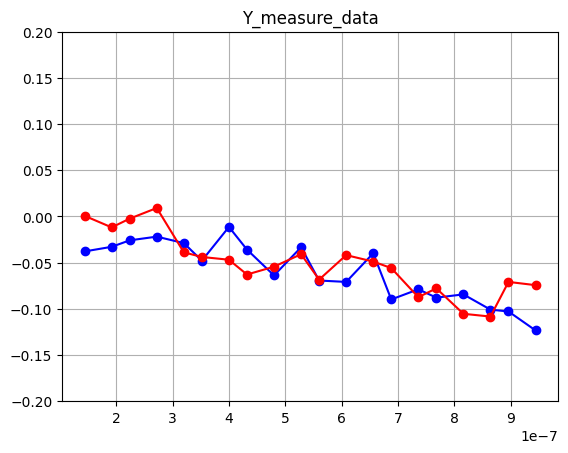

In [16]:
amp_x_rate(7)

-0.014547470622827918
0.10722142868729484 0.042034966233255276 -0.011654083395122744 600


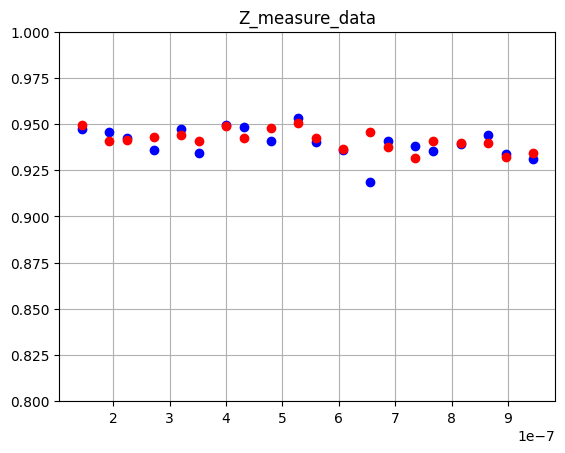

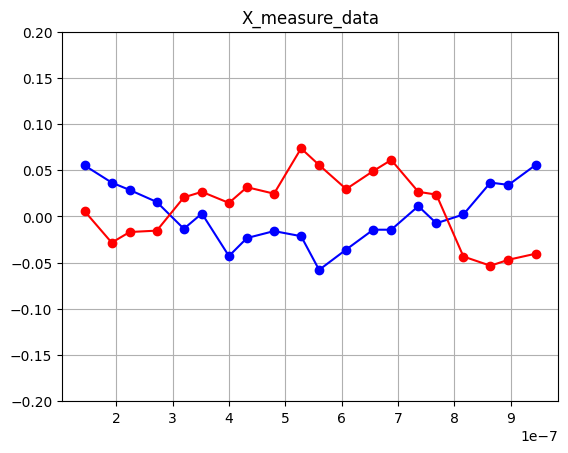

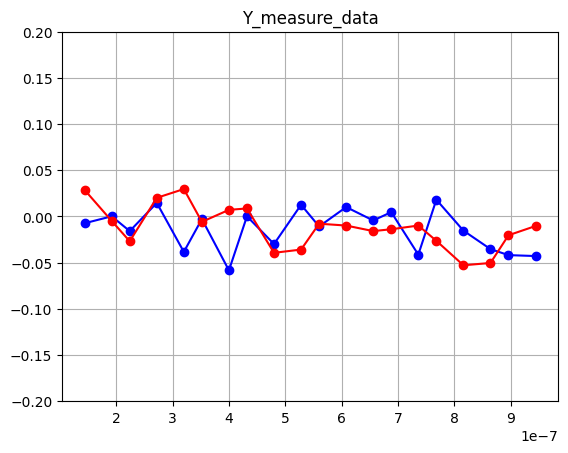

0.03969377799067167
0.12961987420785068 0.0426182227269974 0.03402132004572162 600


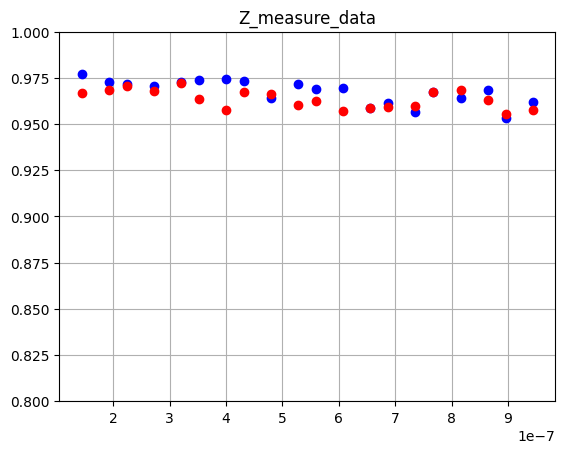

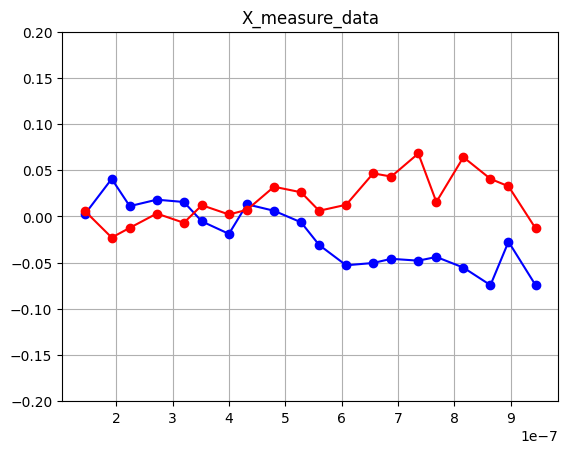

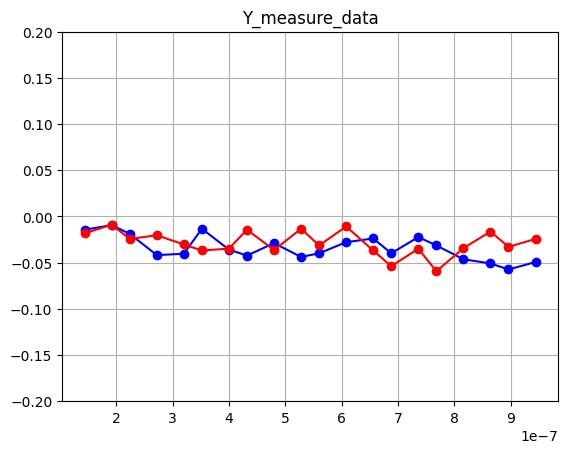

0.04509137694848309
0.10952263074299179 0.04339176156629696 0.04049705222510868 600


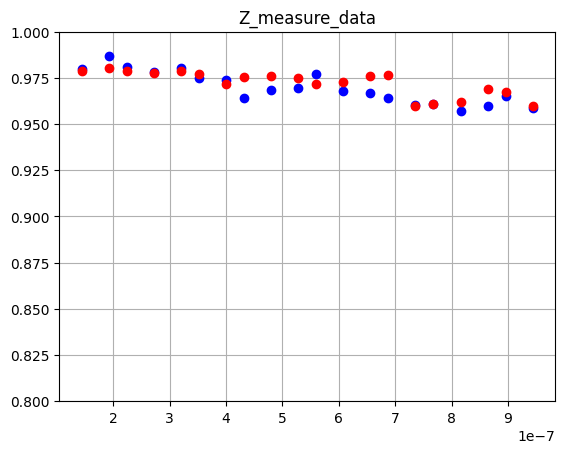

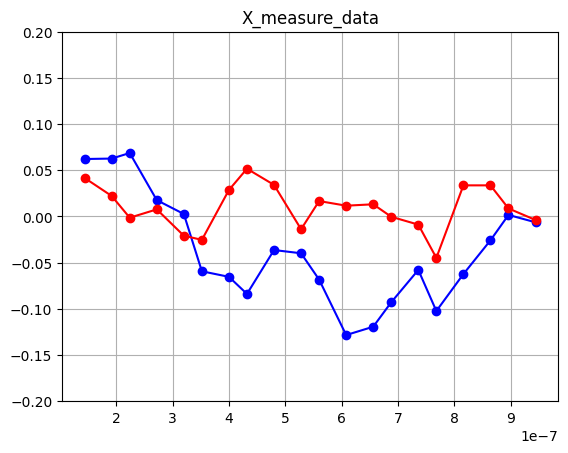

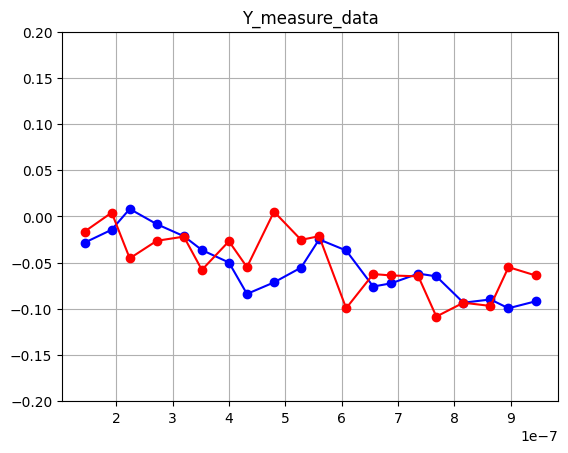

0.026161611479073324
0.09998979967430136 0.0516015122900893 0.01812920384773436 600


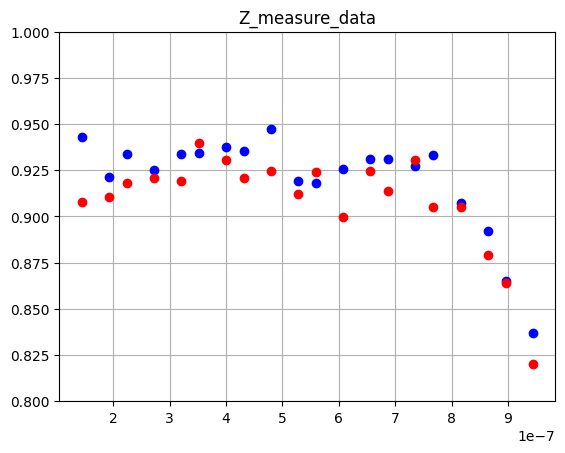

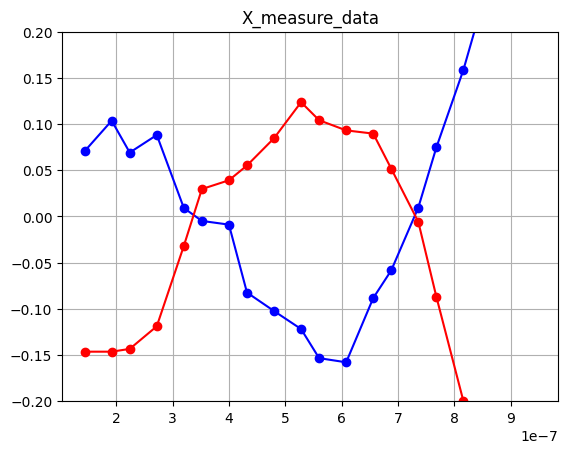

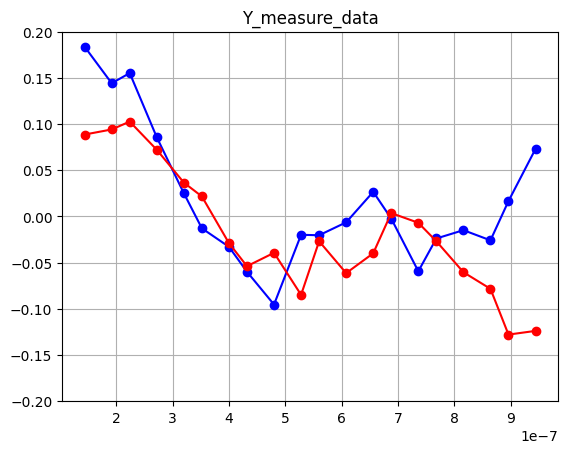

0.05589715191431469
0.19326202801370715 0.04559176463426118 0.0473769595952947 600


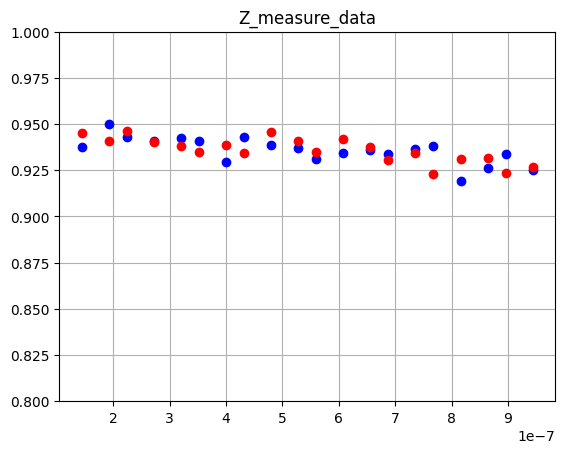

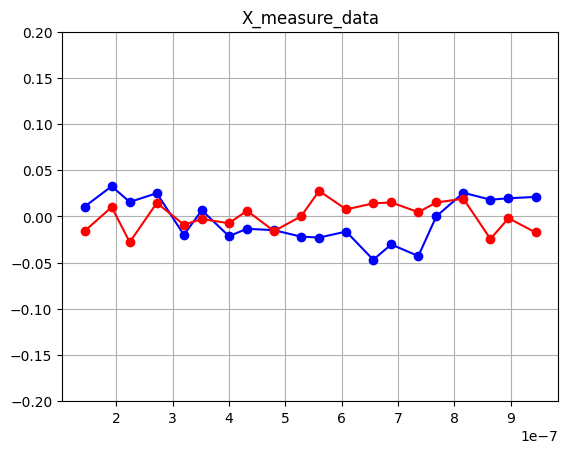

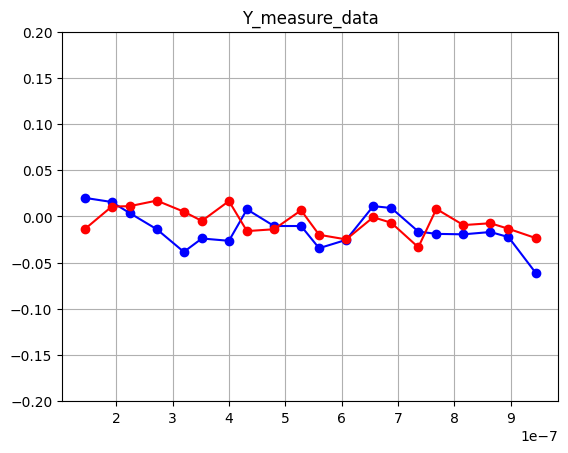

0.04082358338569974
0.14988384011128564 0.03984082765234196 0.038020979854176774 600


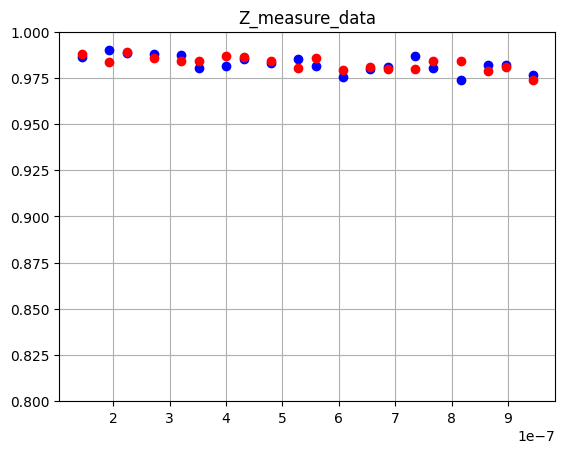

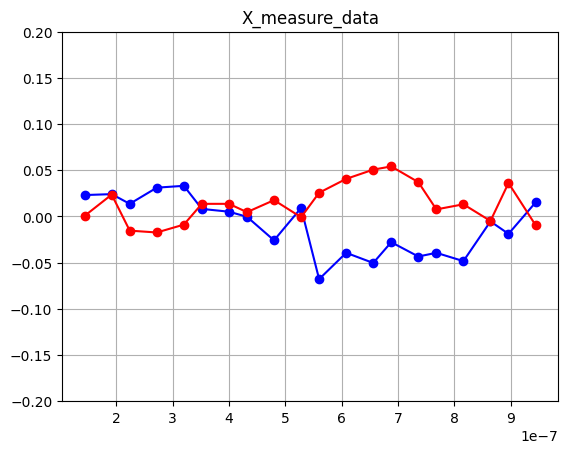

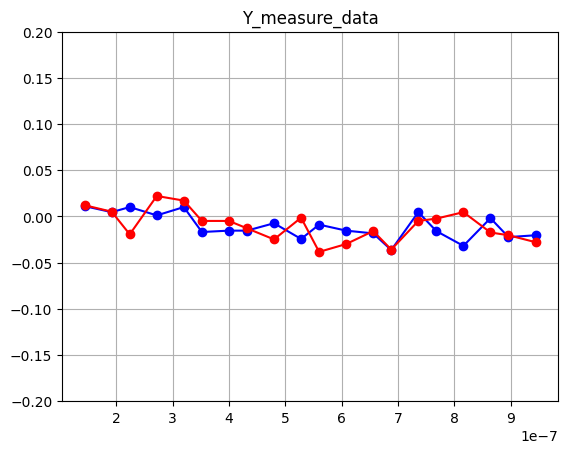

0.039754687428864864
0.15746744370411117 0.04412081995967837 0.03558220593558825 600


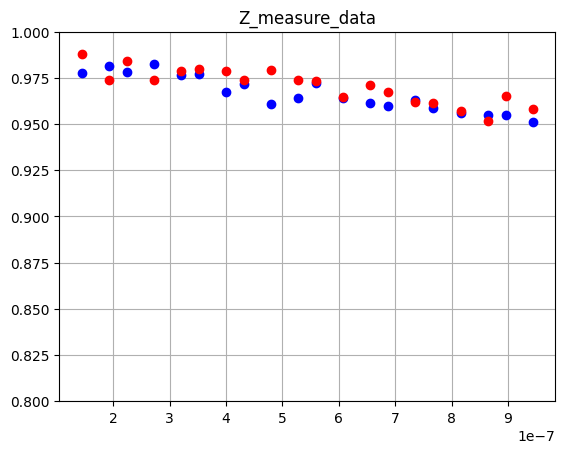

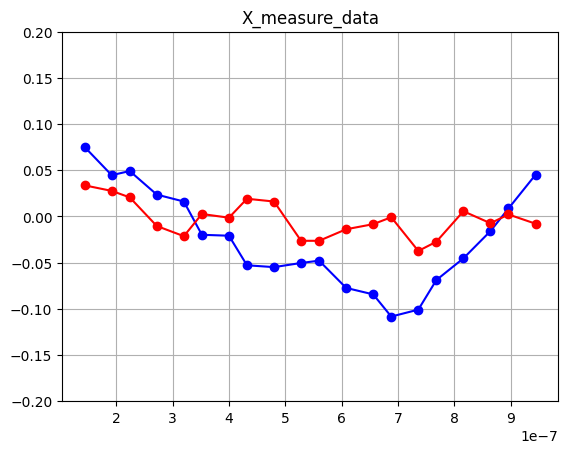

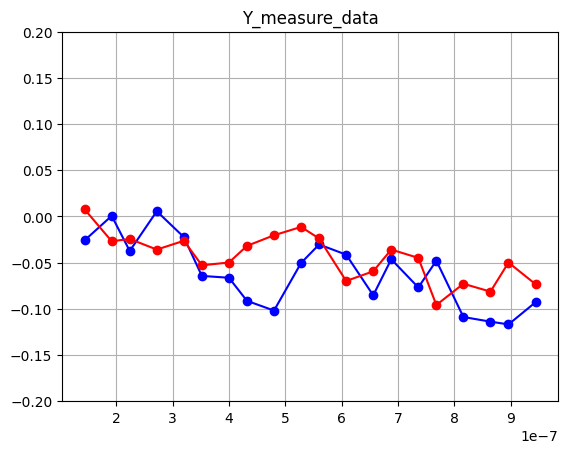

In [17]:
amp_x_rate(8)

-0.014547470622827918
0.10722142868729484 0.047288663048242884 -0.010359283668439969 600


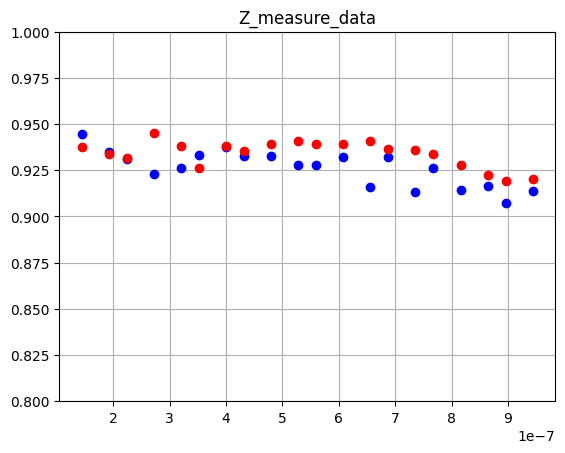

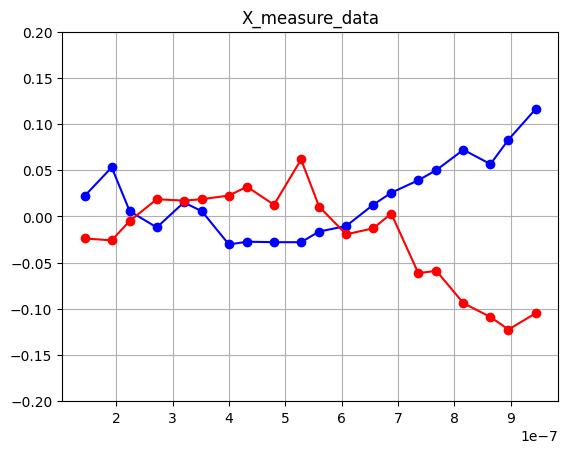

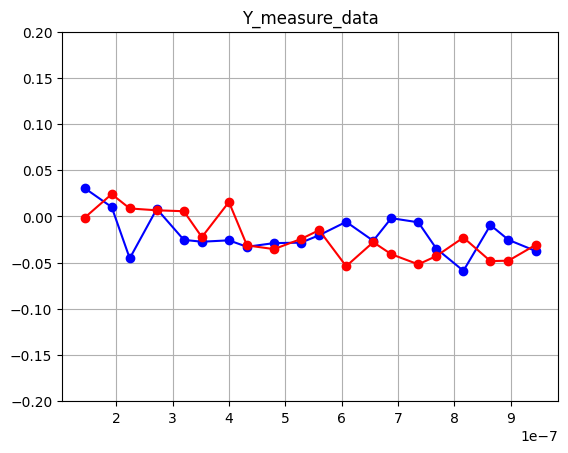

0.03969377799067167
0.12961987420785068 0.04793967896082665 0.03024362190920516 600


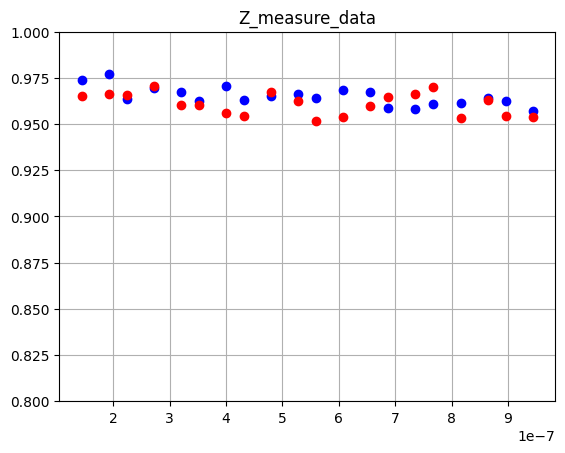

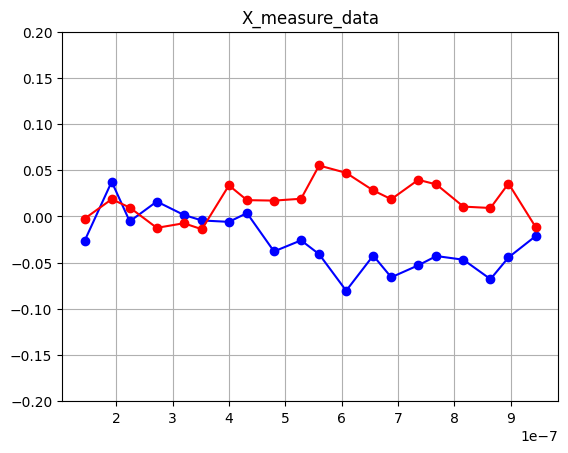

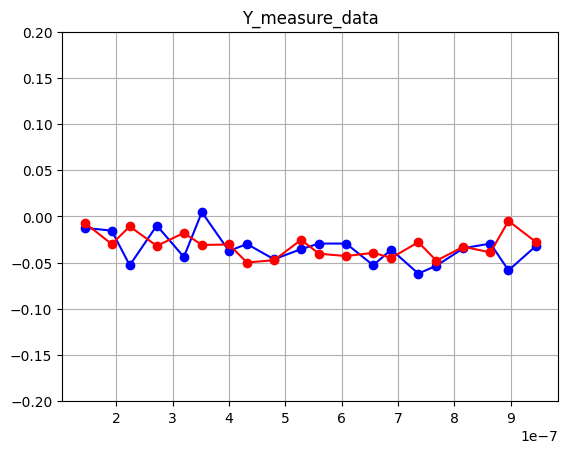

0.04509137694848309
0.10952263074299179 0.04860196412878621 0.03615370191914362 600


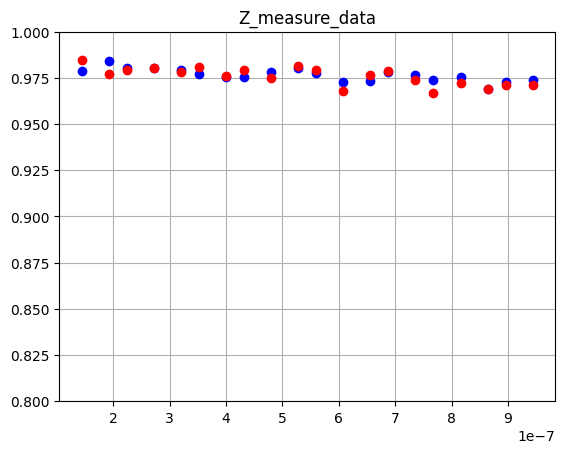

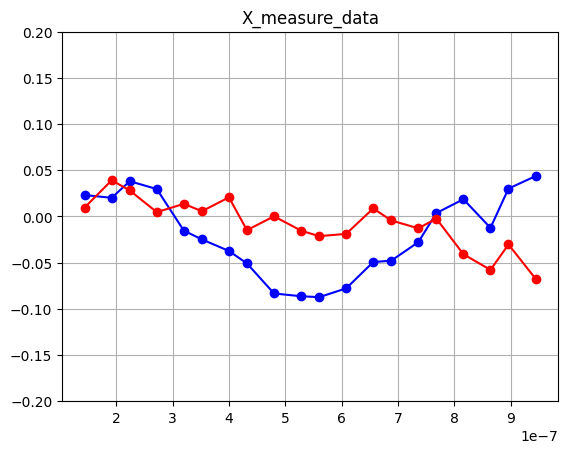

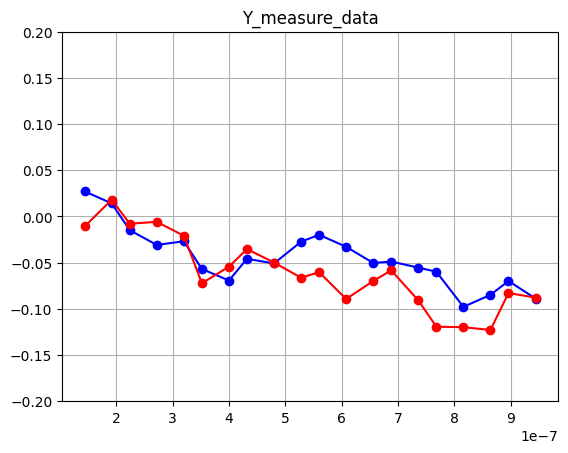

0.026161611479073324
0.09998979967430136 0.058049699316397634 0.0161152183881442 600


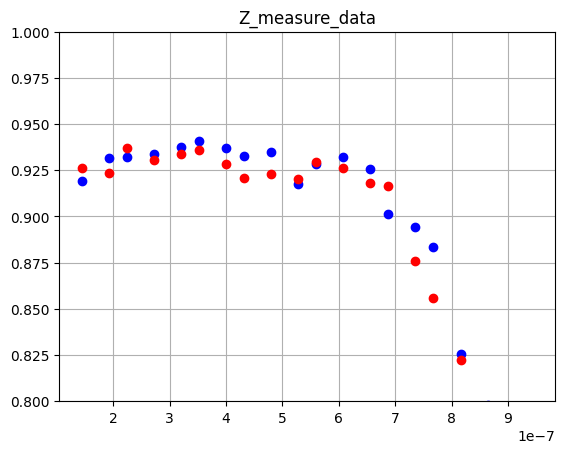

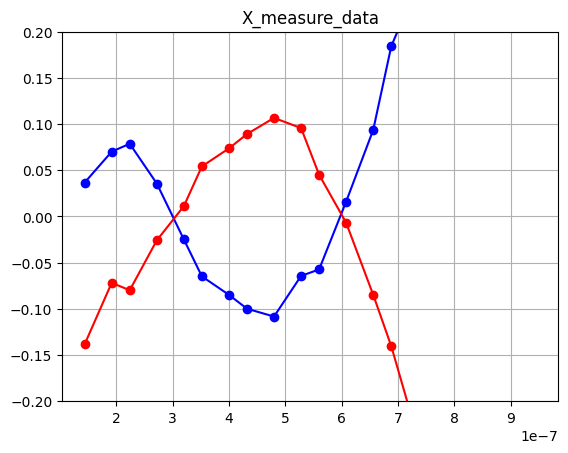

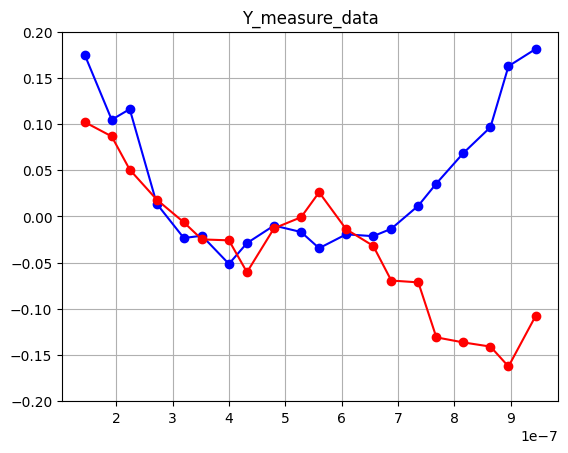

0.05589715191431469
0.19326202801370715 0.050846660963280804 0.042477532442154714 600


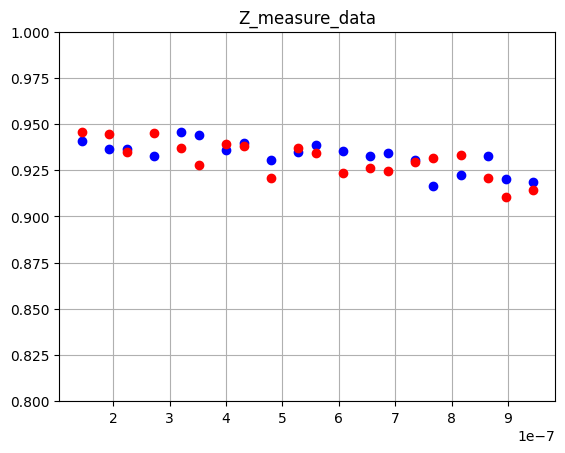

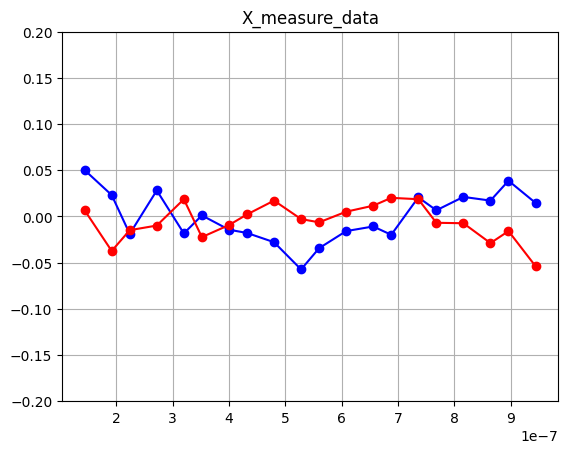

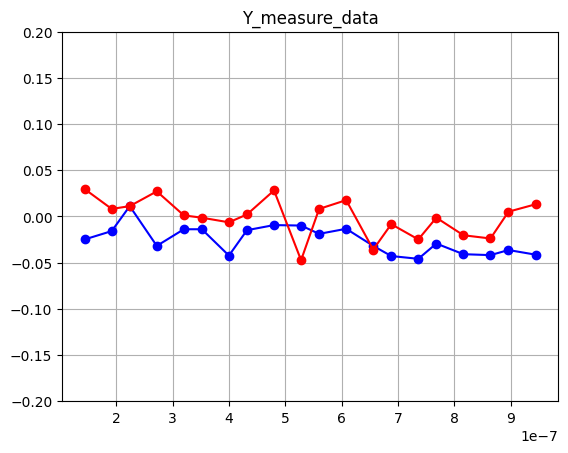

0.04082358338569974
0.14988384011128564 0.04462553773049721 0.03394274407447139 600


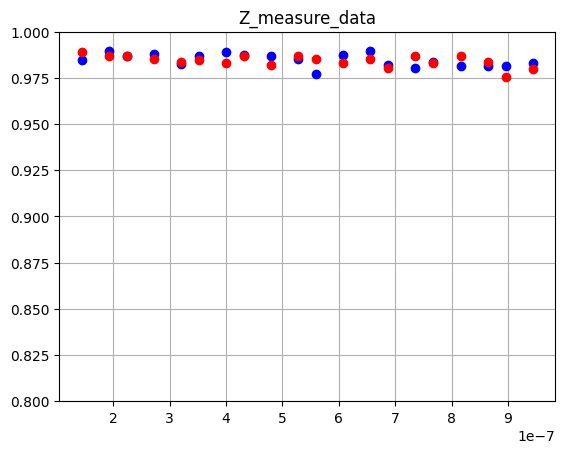

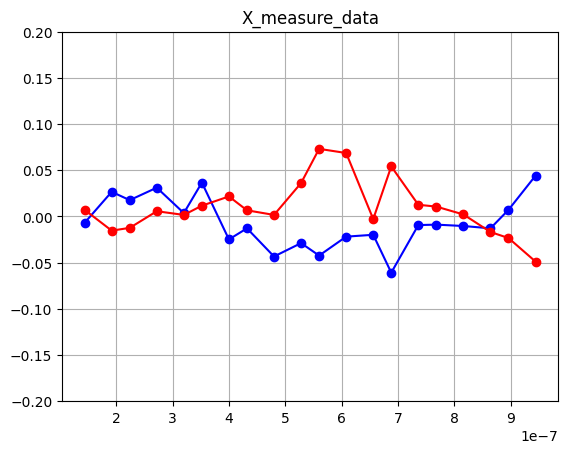

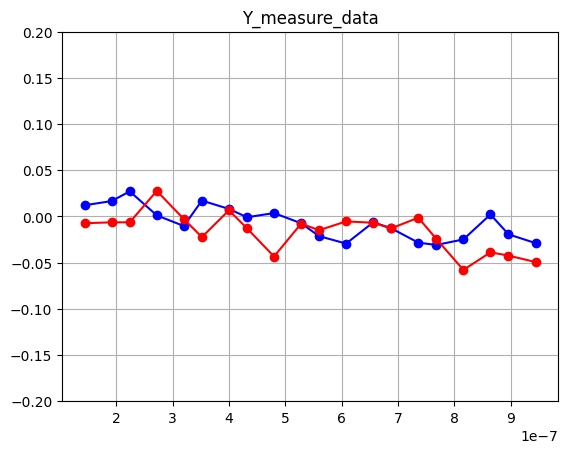

0.039754687428864864
0.15746744370411117 0.049358019551973706 0.031805358451686215 600


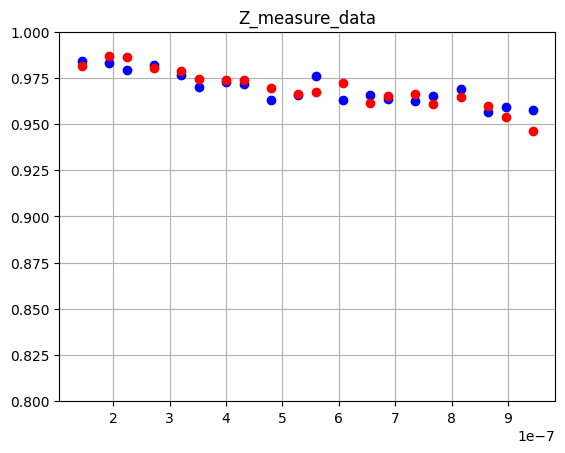

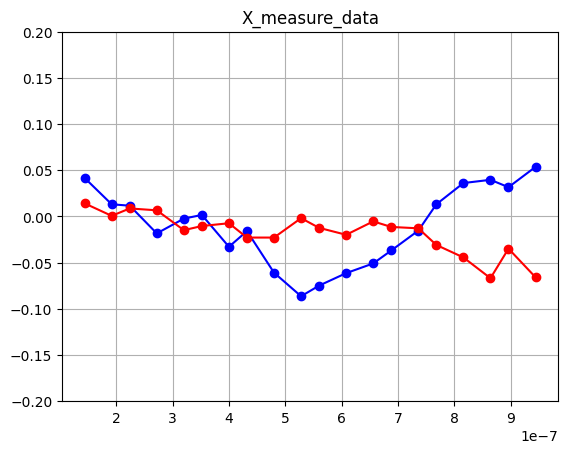

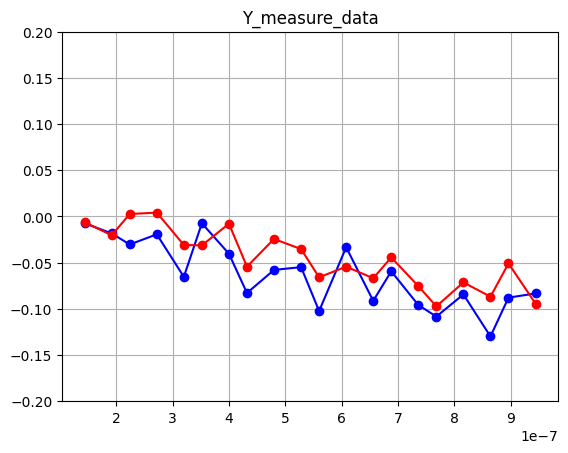

In [18]:
amp_x_rate(9)

-0.014547470622827918
0.10722142868729484 0.05254242328860486 -0.009323418668140345 600


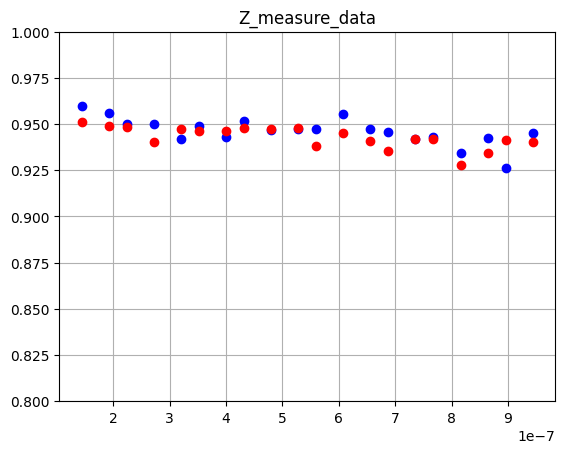

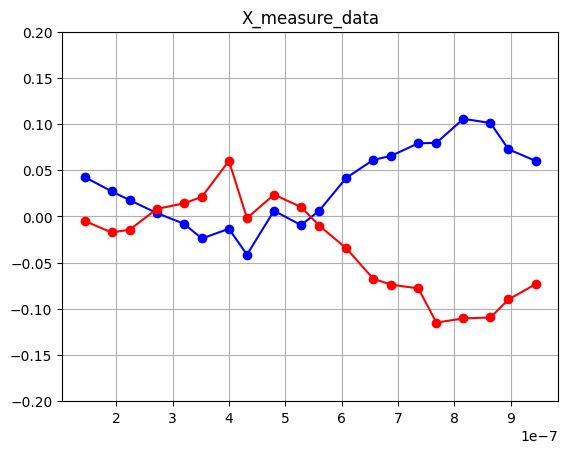

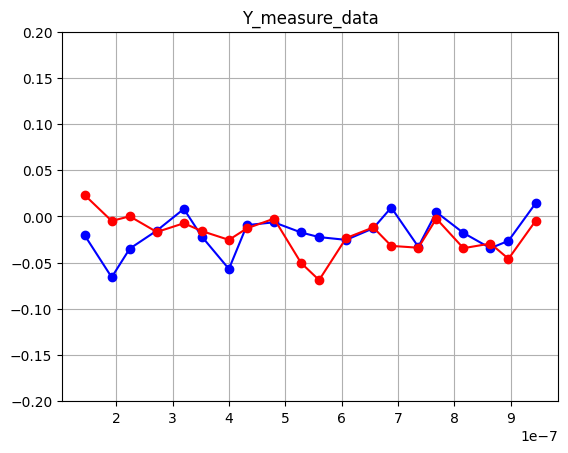

0.03969377799067167
0.12961987420785068 0.05326168262868848 0.027220836392934024 600


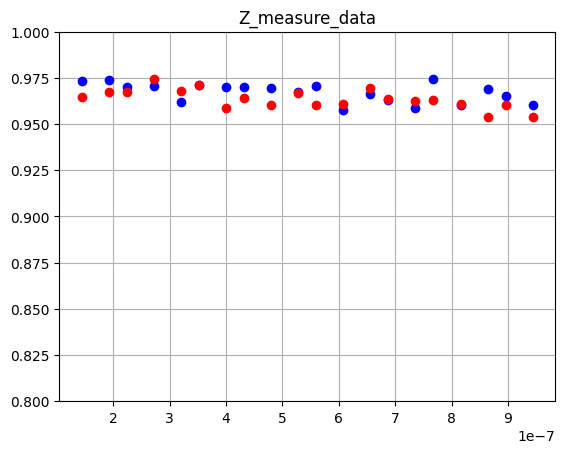

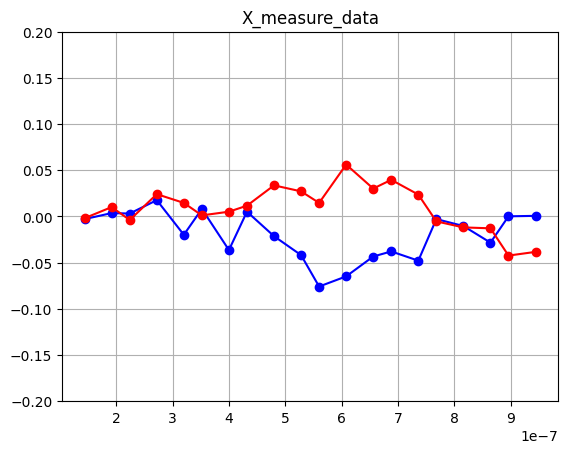

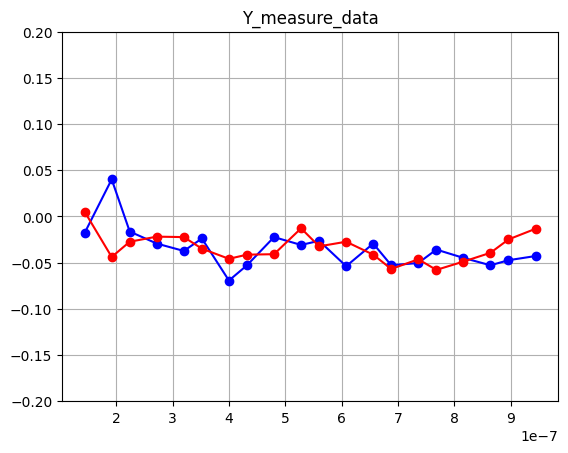

0.04509137694848309
0.10952263074299179 0.05381290600143341 0.03265146746282174 600


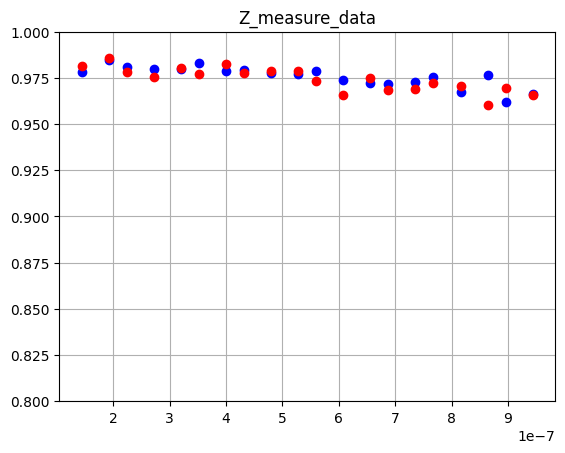

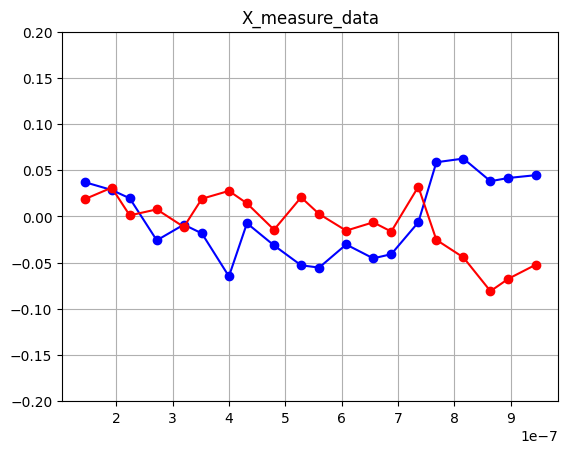

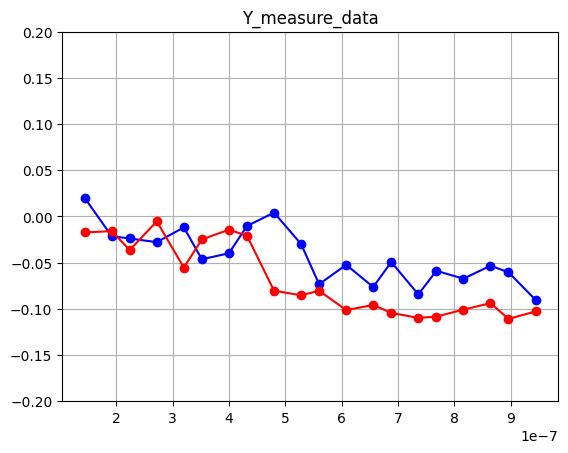

0.026161611479073324
0.09998979967430136 0.06449807472010756 0.014503935096210088 600


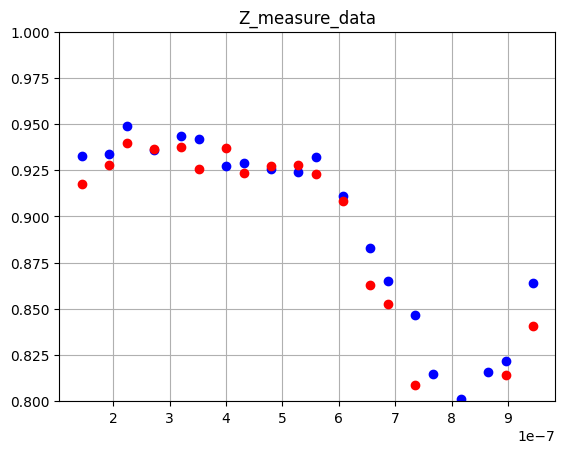

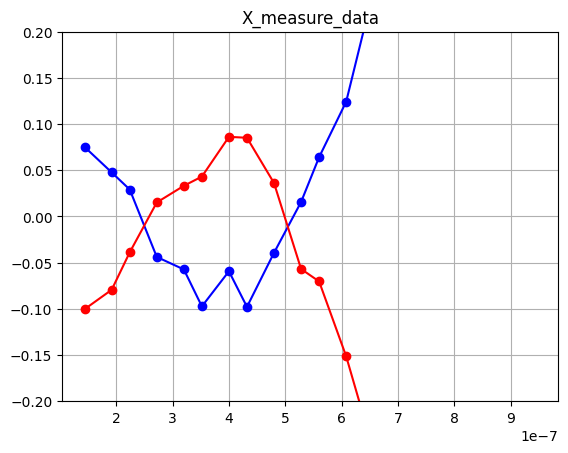

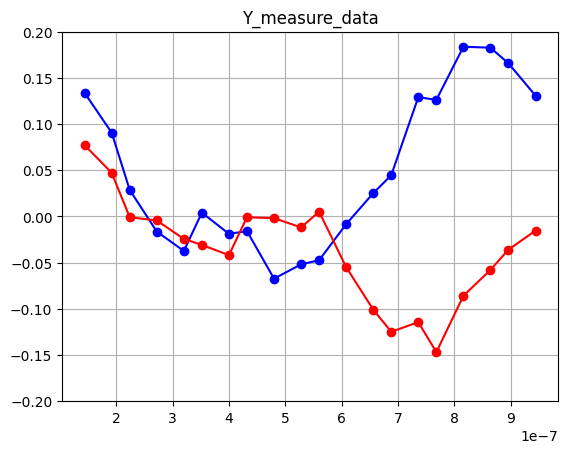

0.05589715191431469
0.19326202801370715 0.05610254917388101 0.03849601592622527 600


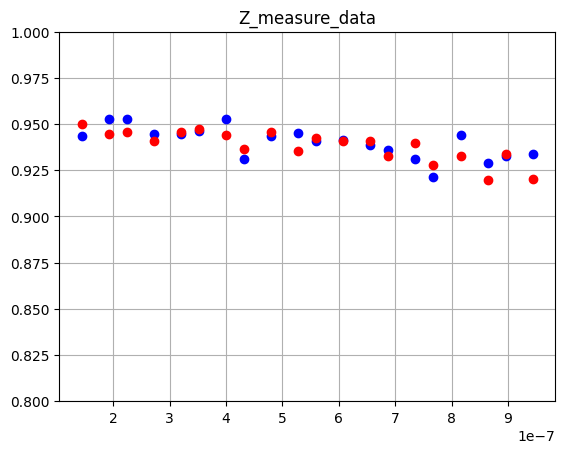

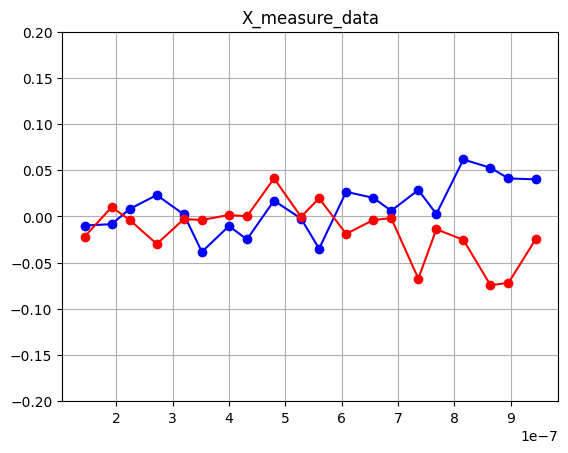

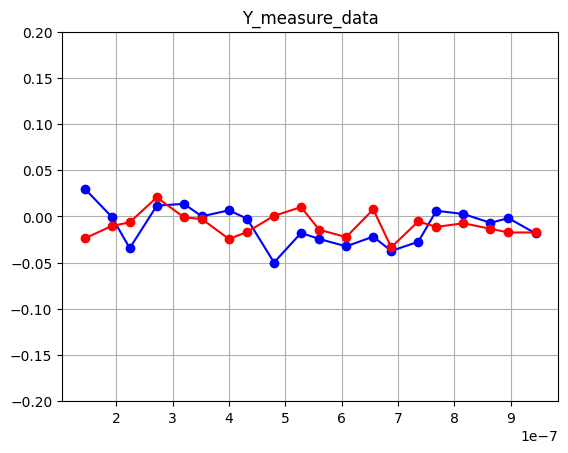

0.04082358338569974
0.14988384011128564 0.04941084627014477 0.030654394582053678 600


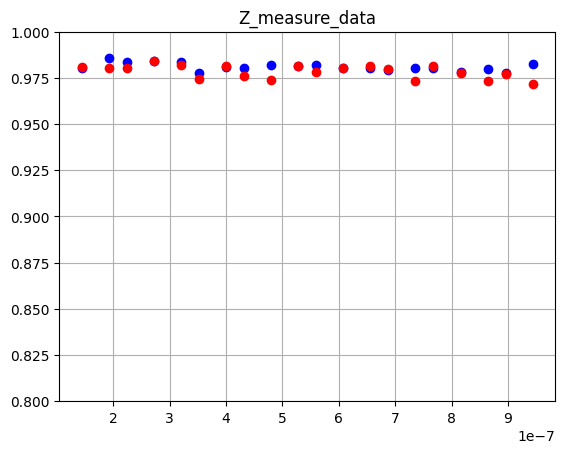

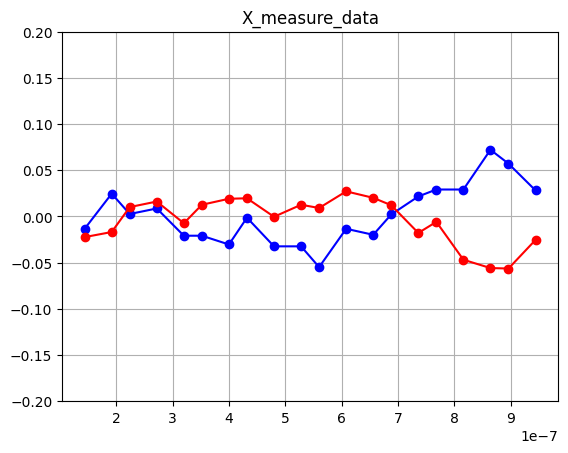

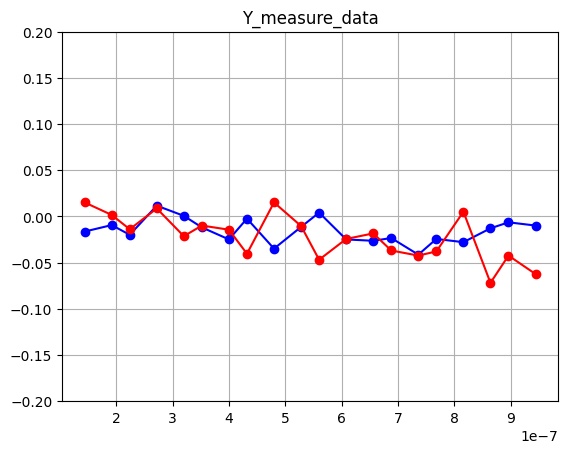

0.039754687428864864
0.15746744370411117 0.05459578813187033 0.028753154680730322 600


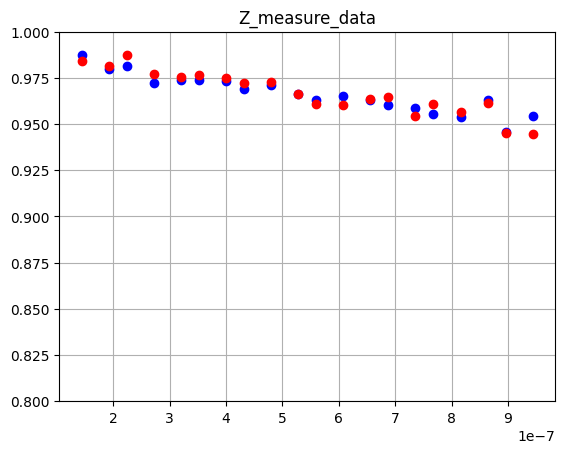

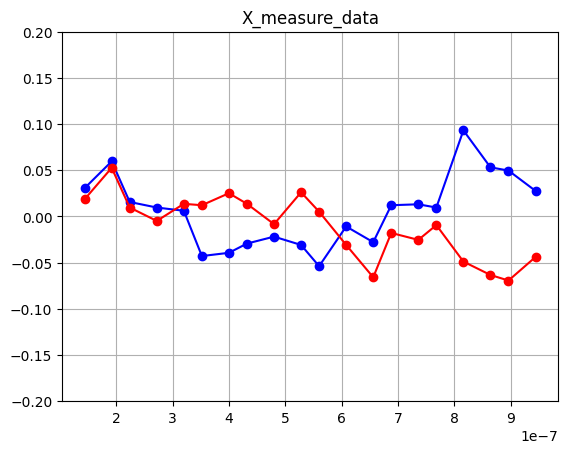

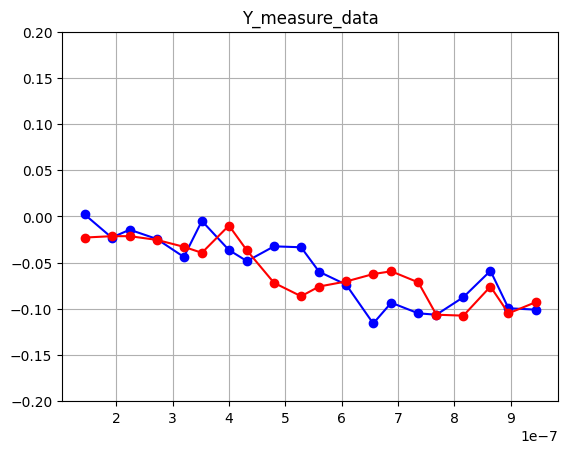

In [19]:
amp_x_rate(10)

-0.014547470622827918
0.10722142868729484 0.057796229657971064 -0.00847587777564986 600


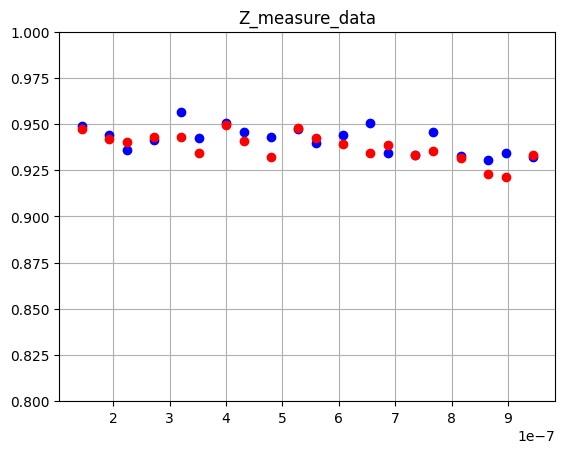

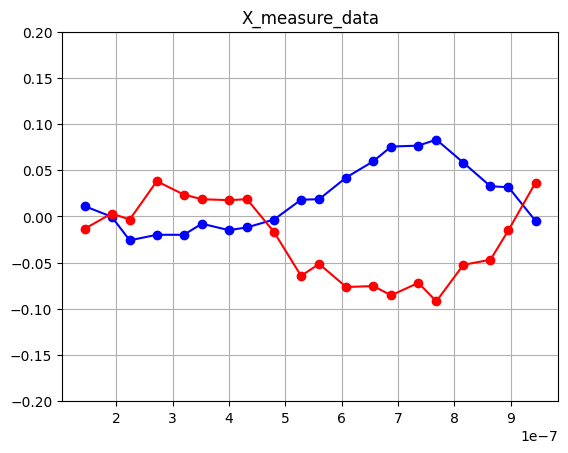

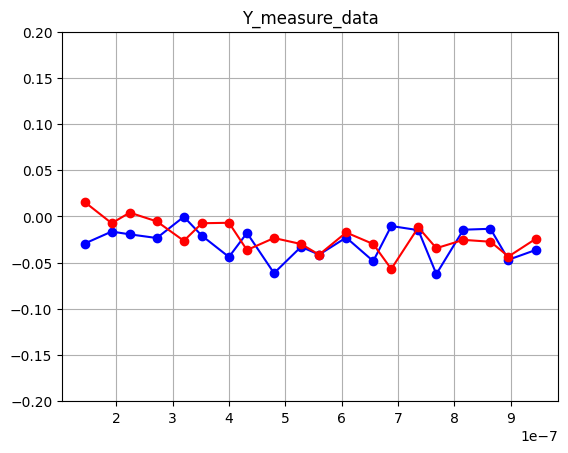

0.03969377799067167
0.12961987420785068 0.05858408453773081 0.024747275605002023 600


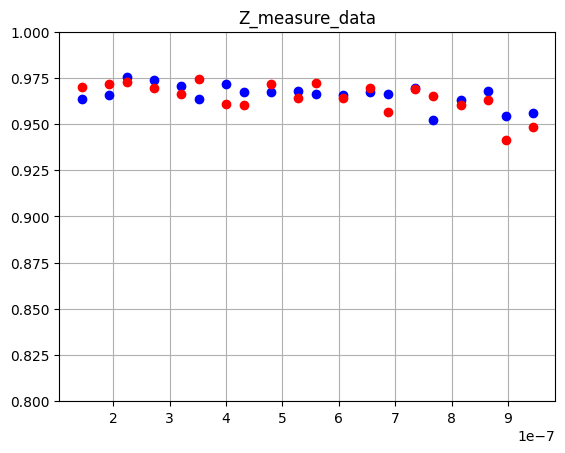

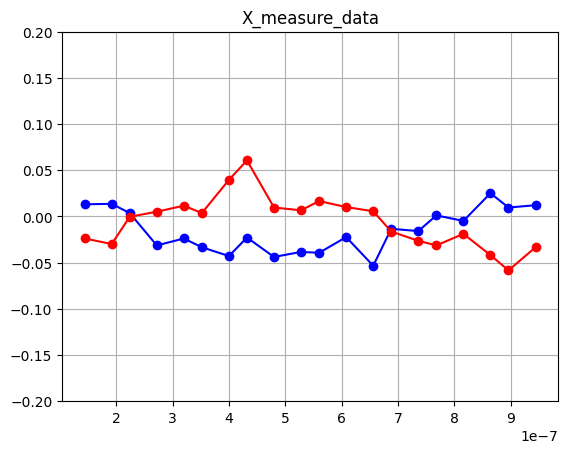

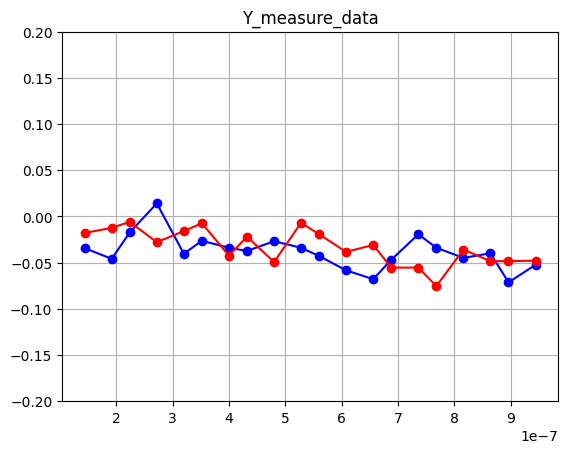

0.04509137694848309
0.10952263074299179 0.05902439137556799 0.029767653544334693 600


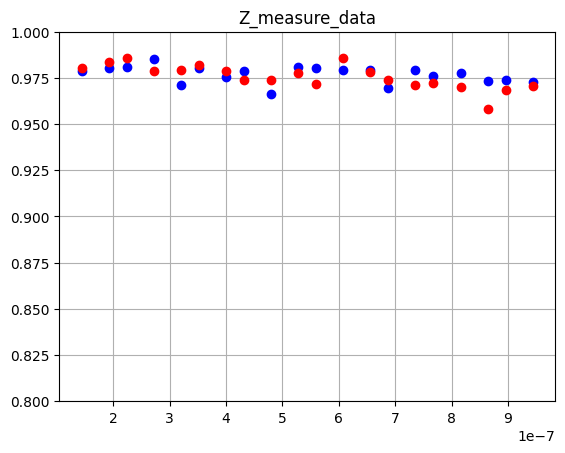

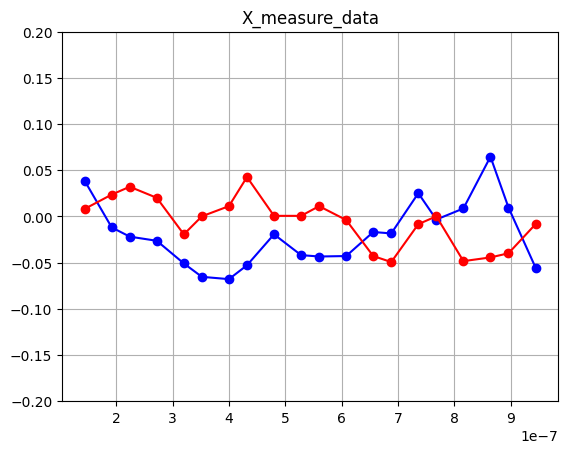

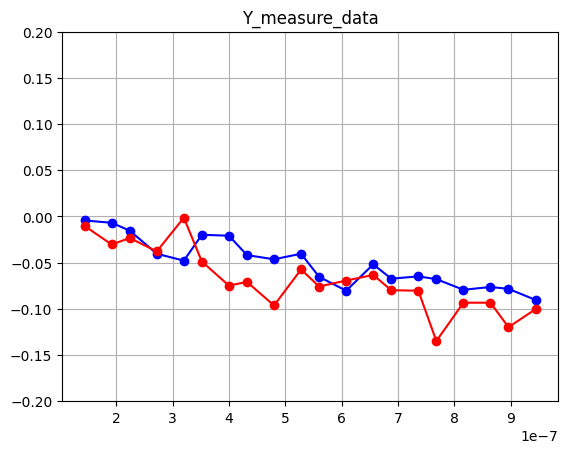

0.026161611479073324
0.09998979967430136 0.07094658713605217 0.013185556002741006 600


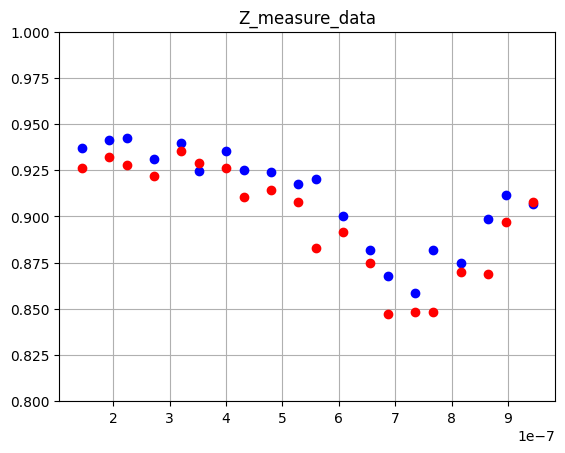

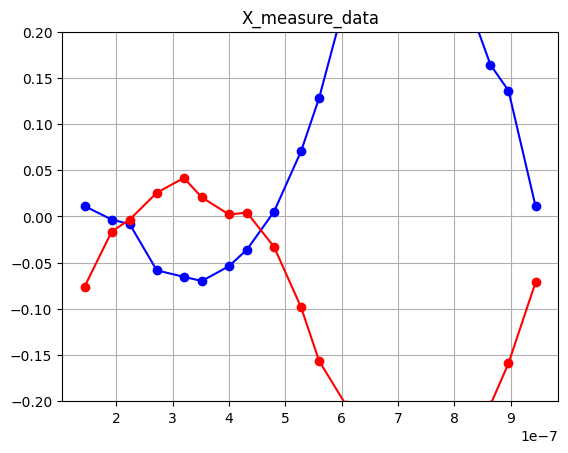

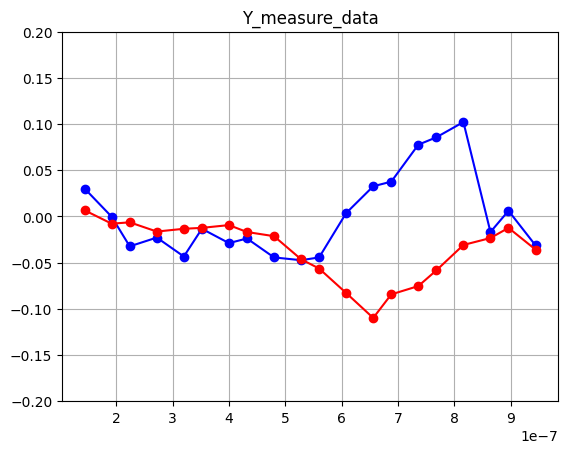

0.05589715191431469
0.19326202801370715 0.06135917437958736 0.035196645377771944 600


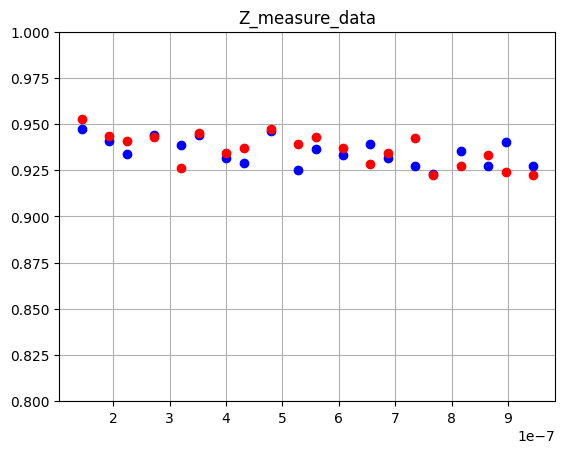

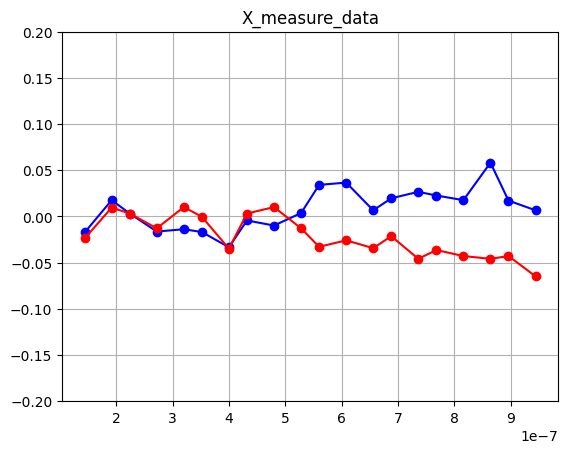

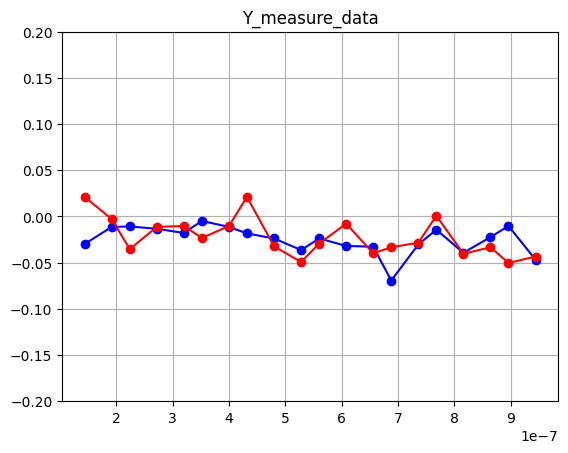

0.04082358338569974
0.14988384011128564 0.054196594747374725 0.027946765442831686 600


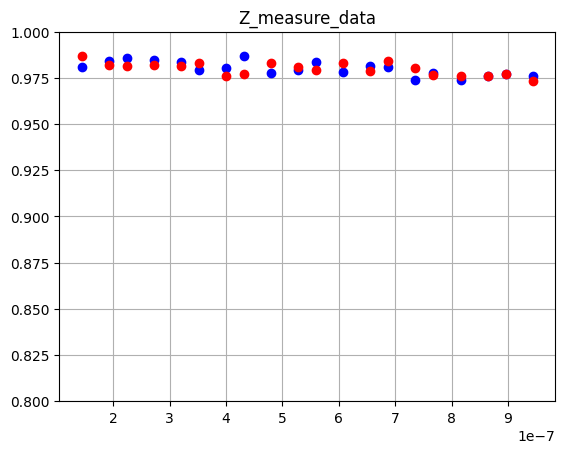

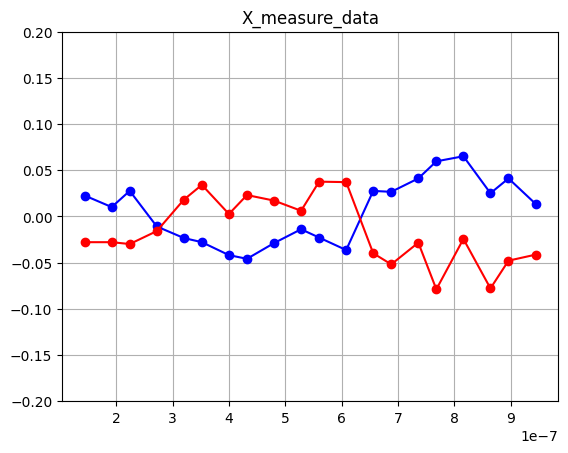

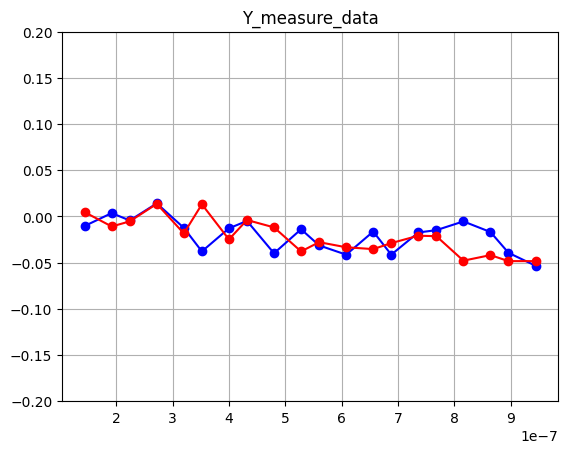

0.039754687428864864
0.15746744370411117 0.05983397627481826 0.026235343429572573 600


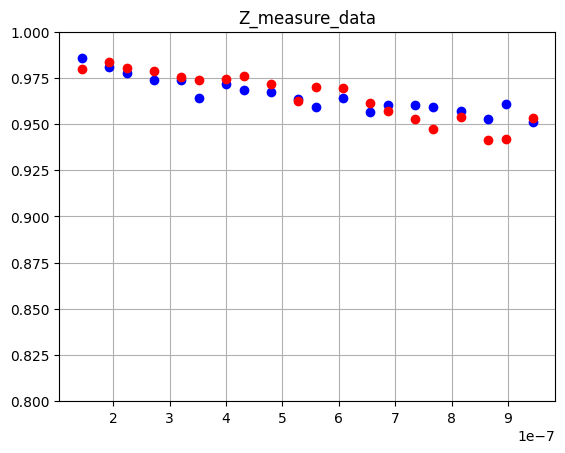

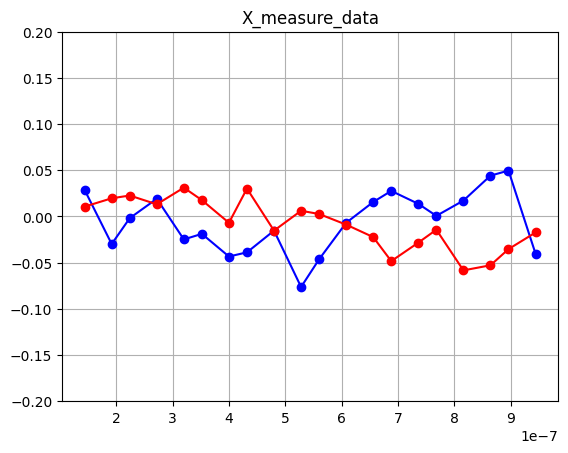

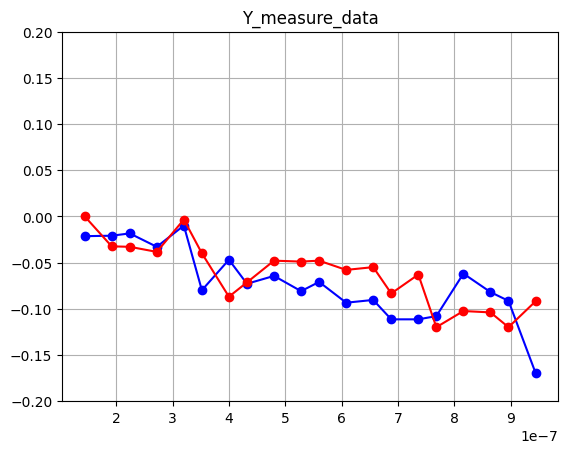

In [20]:
amp_x_rate(11)

-0.014547470622827918
0.10722142868729484 0.06305007062489525 -0.0077695843447728044 600


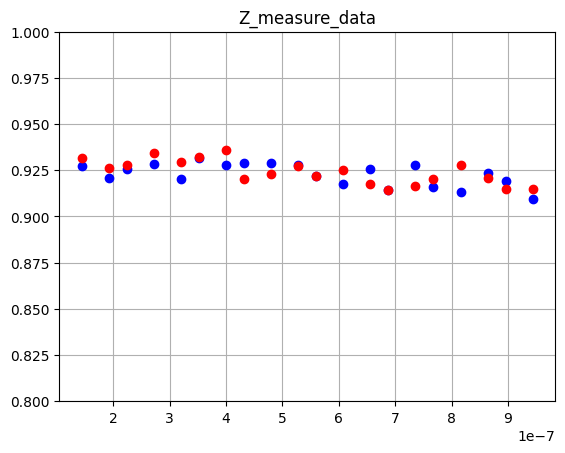

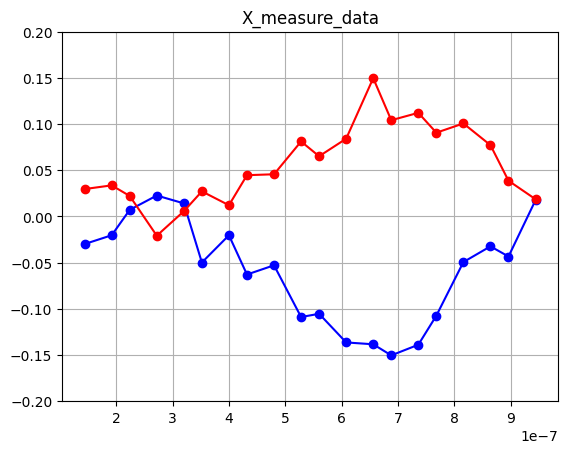

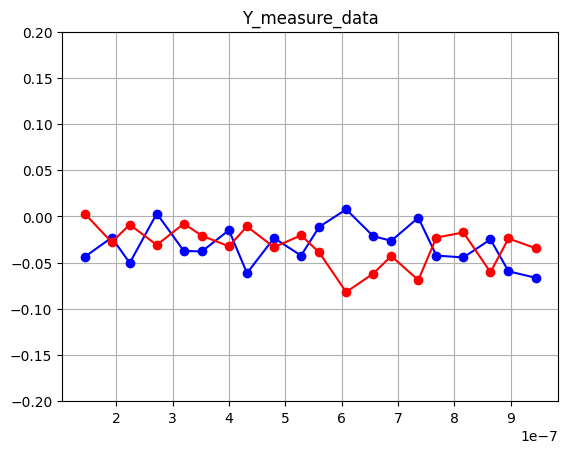

0.03969377799067167
0.12961987420785068 0.06390678518687737 0.02268574226023104 600


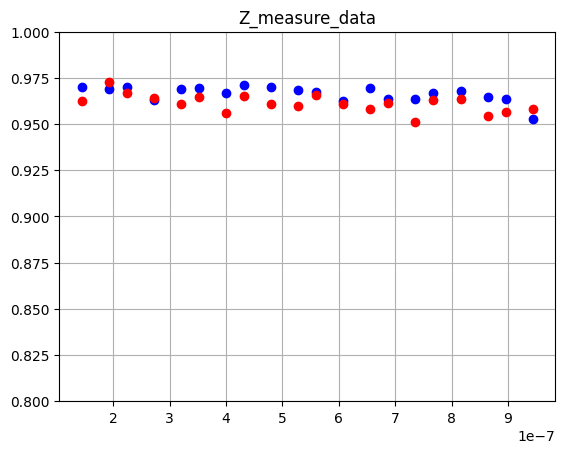

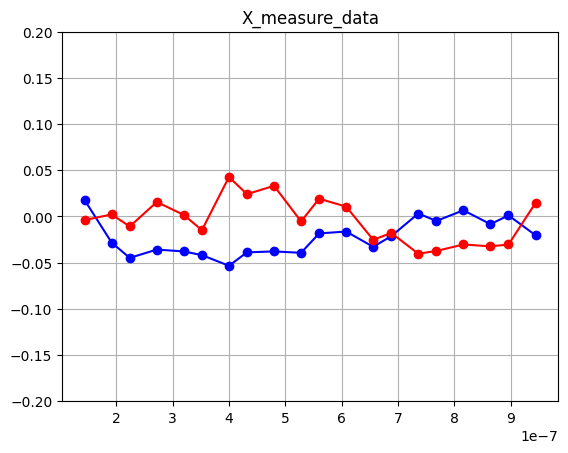

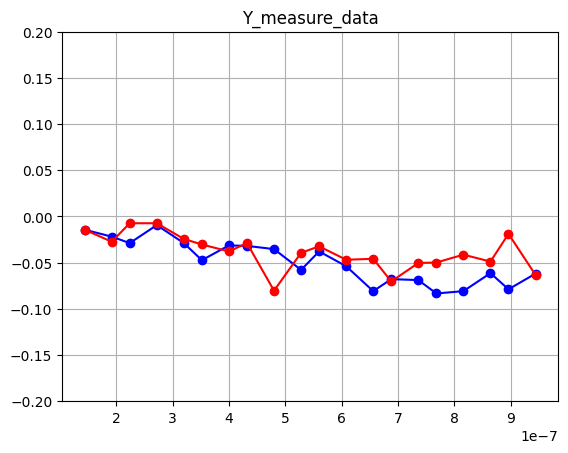

0.04509137694848309
0.10952263074299179 0.06423628796861765 0.02735178631280858 600


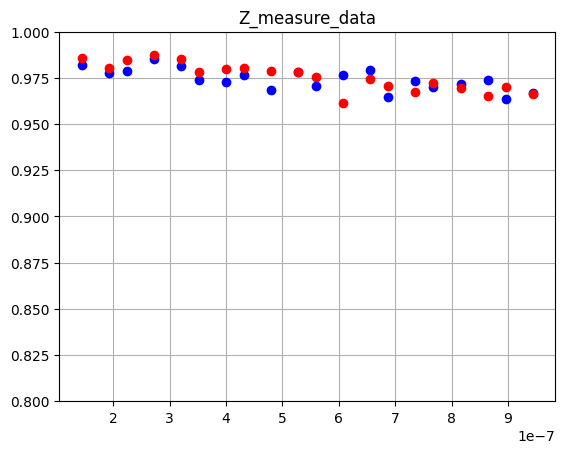

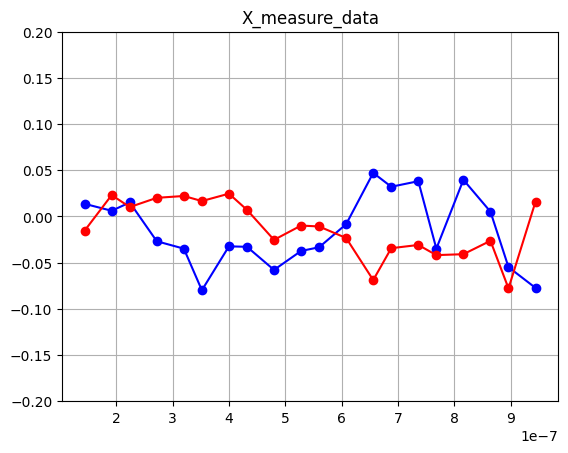

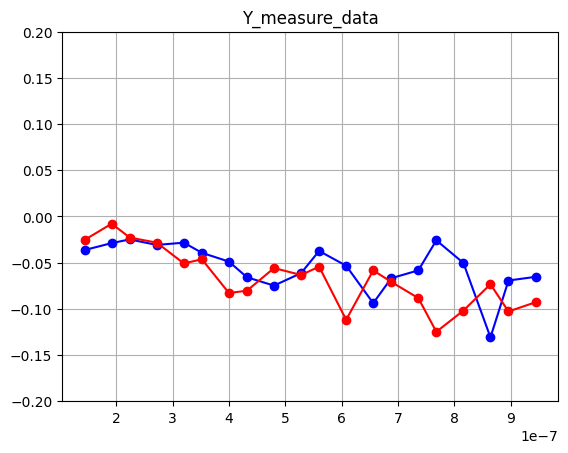

0.026161611479073324
0.09998979967430136 0.07739520231695741 0.01208687154674435 600


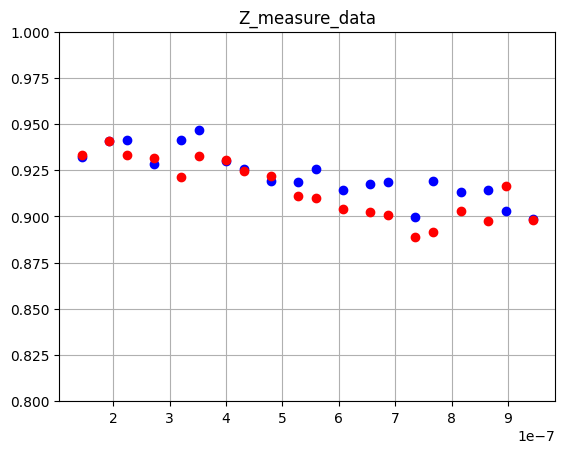

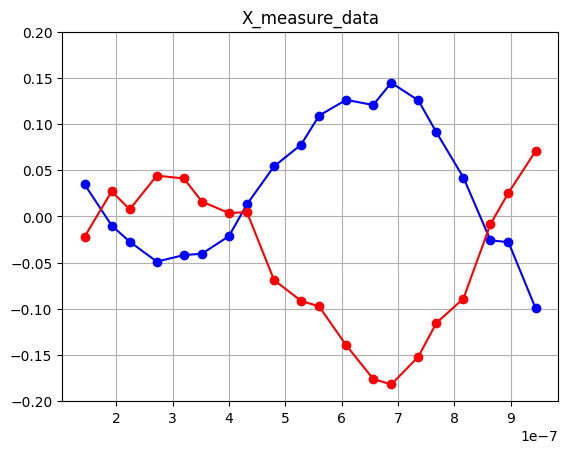

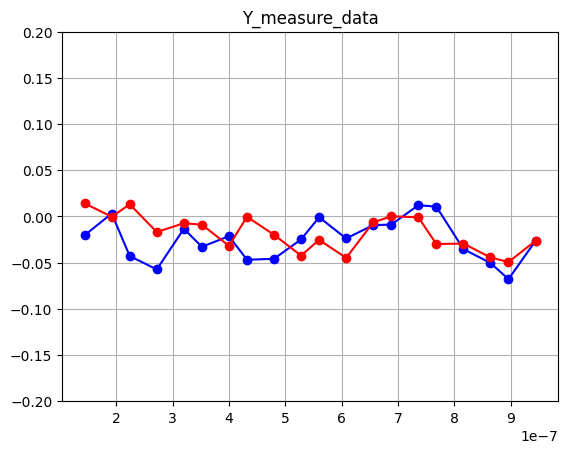

0.05589715191431469
0.19326202801370715 0.06661636211416412 0.03241800369093789 600


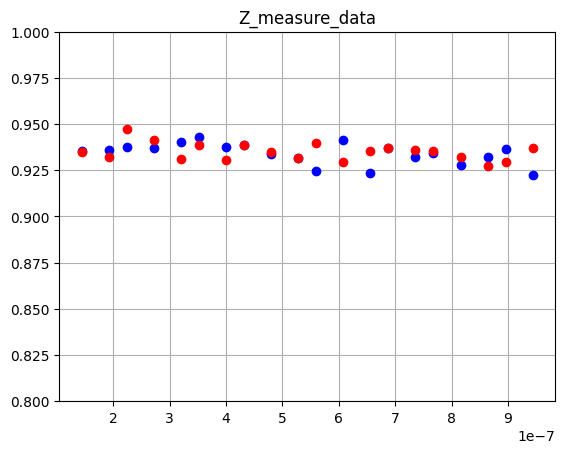

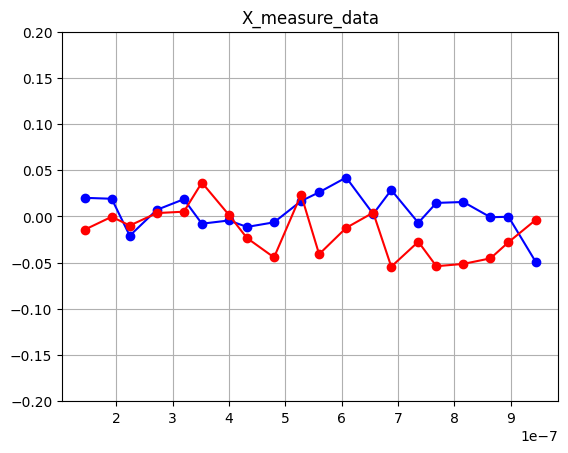

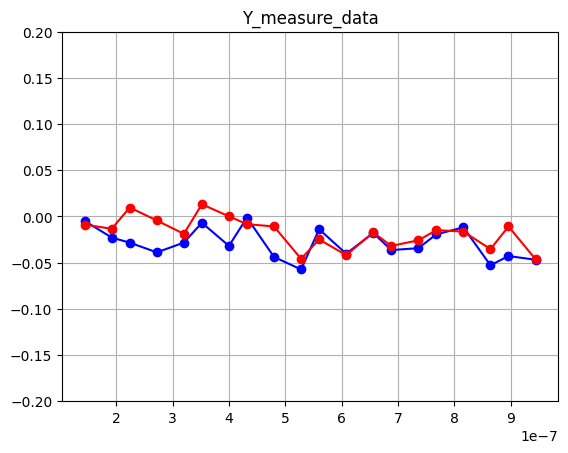

0.04082358338569974
0.14988384011128564 0.05898267607504671 0.025678536747462732 600


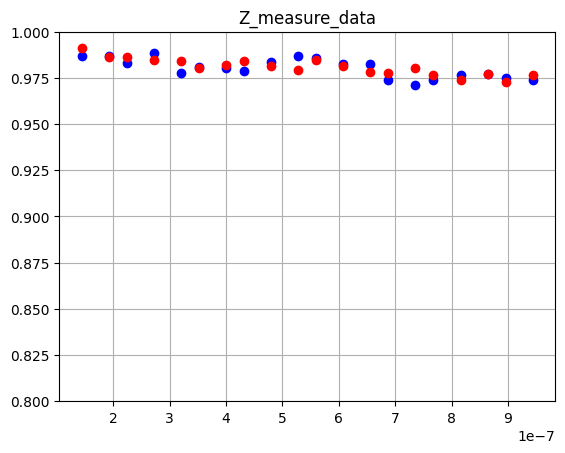

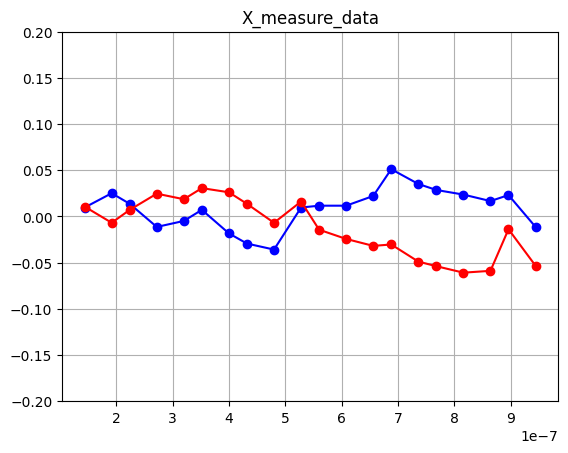

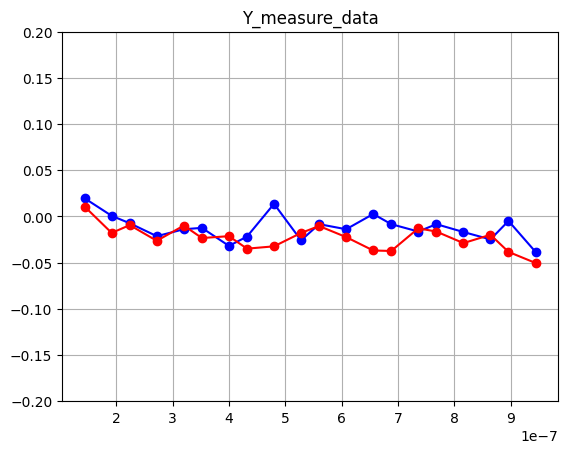

0.039754687428864864
0.15746744370411117 0.06507248265925732 0.024122901410997027 600


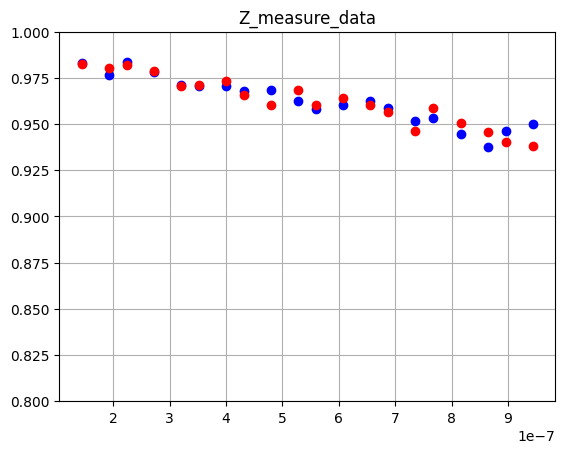

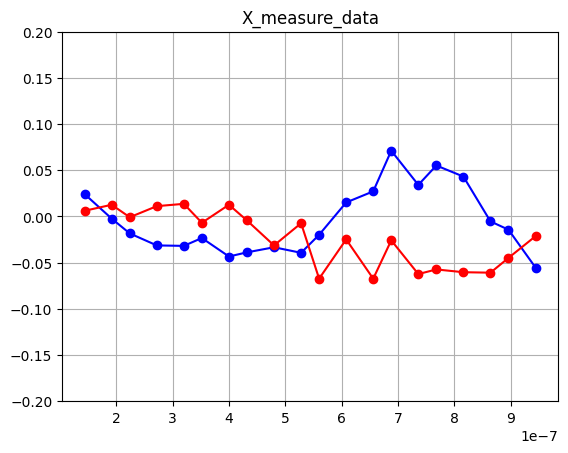

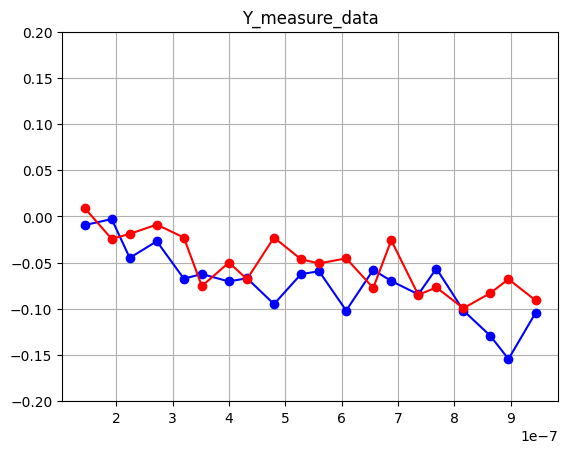

In [29]:
amp_x_rate(12)

In [39]:
from qiskit_experiments.library import CrossResonanceHamiltonian
from qiskit.circuit import Gate
import math
import json
from matplotlib import pyplot as plt
init_list = check_connect(backend,[78,79,80,81,82,83,84,85])
def angle_to_amp(real,imag):
    amp = math.sqrt(real**2 + imag**2)
    angle = math.atan2(imag,real)
    return amp,angle

def amp_to_angle(amp,angle):
    real = amp*math.cos(angle)
    imag = amp*math.sin(angle)
    return real,imag
def ecr_test(rate_x,rate_pass = False):
    with open('IX.json','r') as file:
        X_data = json.load(file)
    for init in init_list[0]:
        c_params = backend.target['ecr'][init].calibration.instructions[1][1].pulse._params
        amp_c = c_params['amp'] 
        angle_c = c_params['angle']
        x_params = backend.target['ecr'][init].calibration.instructions[0][1].pulse._params
        amp_x = x_params['amp']
        angle_x = x_params['angle']
        
        value = X_data['value'][str(init)]
        offset = X_data['offset'][str(init)]
        rate = (rate_x-offset)/(value-offset)
        
        real_x,imag_x = amp_to_angle(amp_x,angle_x)
        real_x = real_x*rate
        if rate_pass:
            pass
        else:
            amp_x,angle_x = angle_to_amp(real_x,imag_x)
        
        print(amp_c,amp_x,angle_x,backend.target['ecr'][init].calibration.instructions[1][1].pulse.duration)
        cr_ham_experiment = EchoedCrossResonanceHamiltonian_double_X(
            physical_qubits=init,
            durations=np.linspace(1.e-7, 3e-7, 20),
            amp = amp_c,
            amp_t = amp_x,
            backend=backend,
            c_angle= angle_c,
            x_angle= angle_x
        )
        cr_ham_experiment.experiment_options.sigma = 32
        data_cr = cr_ham_experiment.run().block_for_results()
        Fig = data_cr.figure(0)
        Fig.figure.savefig(f'./ecr_double_0.1_{init}.svg')
        # 첫 번째 플롯
        x_list =[]
        data_list_0 = []
        data_list_1 = []
        
        for data in data_cr.data():
            if data['metadata']['meas_basis'] == 'z':
                if data['metadata']['control_state'] == 0:
                    x_list.append(data['metadata']['xval'])
                    data_list_0.append((data['counts']['0']-data['counts']['1'])/(data['counts']['0']+data['counts']['1']))
                else:
                    data_list_1.append((data['counts']['0']-data['counts']['1'])/(data['counts']['0']+data['counts']['1']))
        
        
        plt.figure()
        plt.plot(x_list,data_list_0,'bo')
        plt.plot(x_list,data_list_1,'ro')
        plt.ylim(0.8,1)
        plt.title('Z_measure_data')
        plt.grid(True)
        plt.savefig(f"ecr_double_x_z_{rate_x}_{init}.png")
        plt.show()

        x_list =[]
        data_list_0 = []
        data_list_1 = []
        
        for data in data_cr.data():
            if data['metadata']['meas_basis'] == 'x':
                if data['metadata']['control_state'] == 0:
                    x_list.append(data['metadata']['xval'])
                    data_list_0.append((data['counts']['0']-data['counts']['1'])/(data['counts']['0']+data['counts']['1']))
                else:
                    data_list_1.append((data['counts']['0']-data['counts']['1'])/(data['counts']['0']+data['counts']['1']))
        # 첫 번째 플롯
        plt.figure()
        plt.plot(x_list,data_list_0,'bo-')
        plt.plot(x_list,data_list_1,'ro-')
        plt.ylim(-0.2,0.2)
        plt.title('X_measure_data')
        plt.grid(True)
        plt.savefig(f"ecr_double_x_x_{rate_x}_{init}.png")
        plt.show()
        
        x_list =[]
        data_list_0 = []
        data_list_1 = []
        
        for data in data_cr.data():
            if data['metadata']['meas_basis'] == 'y':
                if data['metadata']['control_state'] == 0:
                    x_list.append(data['metadata']['xval'])
                    data_list_0.append((data['counts']['0']-data['counts']['1'])/(data['counts']['0']+data['counts']['1']))
                else:
                    data_list_1.append((data['counts']['0']-data['counts']['1'])/(data['counts']['0']+data['counts']['1']))
        # 첫 번째 플롯
        plt.figure()
        plt.plot(x_list,data_list_0,'bo-')
        plt.plot(x_list,data_list_1,'ro-')
        plt.ylim(-0.2,0.2)
        plt.title('Y_measure_data')
        plt.grid(True)
        plt.savefig(f"ecr_double_x_y_{rate_x}_{init}.png")
        plt.show()

In [52]:
def ecr_test_real(rate_x,rate_pass = True):
    with open('IX.json','r') as file:
        X_data = json.load(file)
    for init in init_list[0]:
        c_params = backend.target['ecr'][init].calibration.instructions[1][1].pulse._params
        amp_c = c_params['amp'] 
        angle_c = c_params['angle']
        x_params = backend.target['ecr'][init].calibration.instructions[0][1].pulse._params
        amp_x = x_params['amp']
        angle_x = x_params['angle']
        
        value = X_data['value'][str(init)]
        offset = X_data['offset'][str(init)]
        rate = (rate_x-offset)/(value-offset)
        
        real_x,imag_x = amp_to_angle(amp_x,angle_x)
        real_x = real_x*rate
        if rate_pass:
            pass
        else:
            amp_x,angle_x = angle_to_amp(real_x,imag_x)
        
        print(amp_c,amp_x,angle_x,backend.target['ecr'][init].calibration.instructions[1][1].pulse.duration)
        cr_ham_experiment = EchoedCrossResonanceHamiltonian(
            physical_qubits=init,
            durations=np.linspace(1.e-7, 6e-7, 20),
            amp = amp_c,
            amp_t = amp_x,
            backend=backend,
            c_angle= angle_c,
            x_angle= angle_x
        )
        cr_ham_experiment.experiment_options.sigma = 32
        data_cr = cr_ham_experiment.run().block_for_results()
        Fig = data_cr.figure(0)
        #Fig.figure.savefig(f'./ecr_double_0.1_{init}.svg')
        # 첫 번째 플롯
        x_list =[]
        data_list_0 = []
        data_list_1 = []
        
        for data in data_cr.data():
            if data['metadata']['meas_basis'] == 'z':
                if data['metadata']['control_state'] == 0:
                    x_list.append(data['metadata']['xval'])
                    data_list_0.append((data['counts']['0']-data['counts']['1'])/(data['counts']['0']+data['counts']['1']))
                else:
                    data_list_1.append((data['counts']['0']-data['counts']['1'])/(data['counts']['0']+data['counts']['1']))
        
        
        plt.figure()
        plt.plot(x_list,data_list_0,'bo')
        plt.plot(x_list,data_list_1,'ro')
        plt.ylim(-1,1)
        plt.title('Z_measure_data')
        plt.grid(True)
        plt.savefig(f"ecr_echo_z_{init}.png")
        plt.show()

        x_list =[]
        data_list_0 = []
        data_list_1 = []
        
        for data in data_cr.data():
            if data['metadata']['meas_basis'] == 'x':
                if data['metadata']['control_state'] == 0:
                    x_list.append(data['metadata']['xval'])
                    data_list_0.append((data['counts']['0']-data['counts']['1'])/(data['counts']['0']+data['counts']['1']))
                else:
                    data_list_1.append((data['counts']['0']-data['counts']['1'])/(data['counts']['0']+data['counts']['1']))
        # 첫 번째 플롯
        plt.figure()
        plt.plot(x_list,data_list_0,'bo-')
        plt.plot(x_list,data_list_1,'ro-')
        plt.ylim(-0.2,0.2)
        plt.title('X_measure_data')
        plt.grid(True)
        plt.savefig(f"ecr_echo_x_{rate_x}_{init}.png")
        plt.show()
        
        x_list =[]
        data_list_0 = []
        data_list_1 = []
        
        for data in data_cr.data():
            if data['metadata']['meas_basis'] == 'y':
                if data['metadata']['control_state'] == 0:
                    x_list.append(data['metadata']['xval'])
                    data_list_0.append((data['counts']['0']-data['counts']['1'])/(data['counts']['0']+data['counts']['1']))
                else:
                    data_list_1.append((data['counts']['0']-data['counts']['1'])/(data['counts']['0']+data['counts']['1']))
        # 첫 번째 플롯
        plt.figure()
        plt.plot(x_list,data_list_0,'bo-')
        plt.plot(x_list,data_list_1,'ro-')
        plt.ylim(-1,1)
        plt.title('Y_measure_data')
        plt.grid(True)
        plt.savefig(f"ecr_echo_y_{rate_x}_{init}.png")
        plt.show()

0.10722142868729484 0.03367493941236519 -0.014547470622827918 600


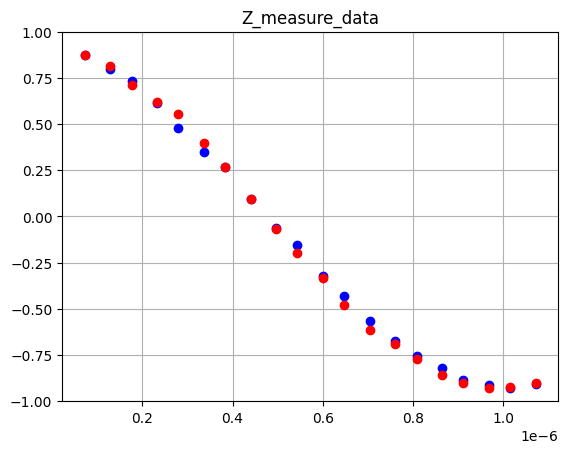

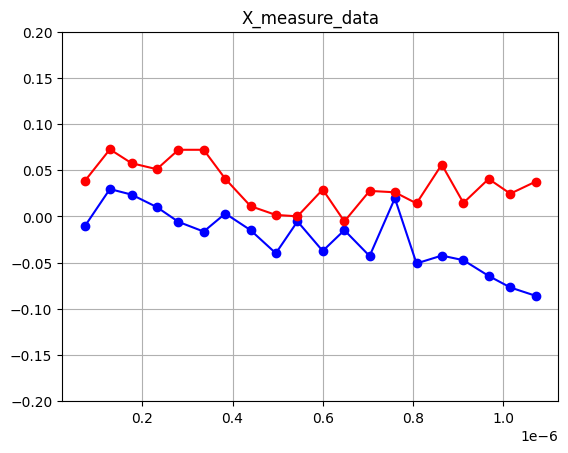

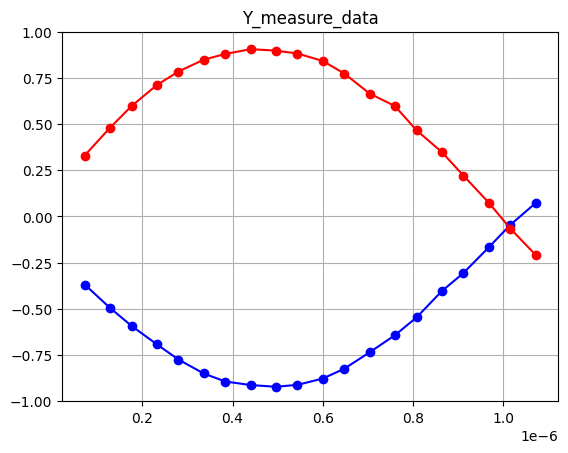

0.12961987420785068 0.03653039161805744 0.03969377799067167 600


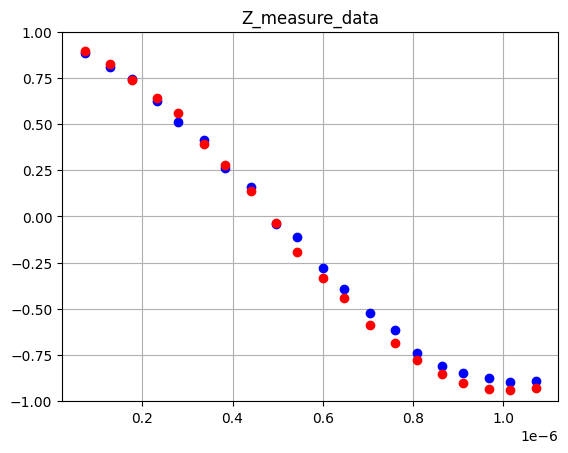

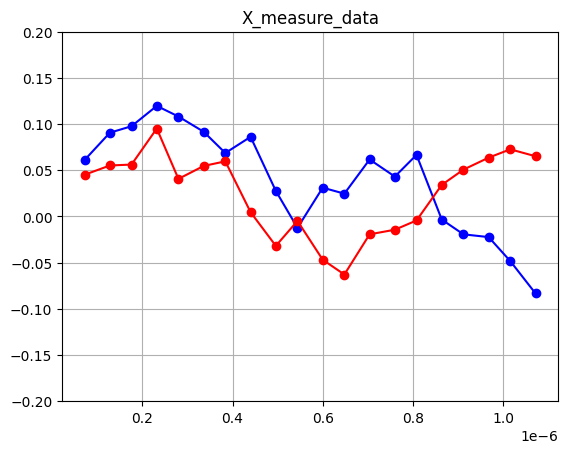

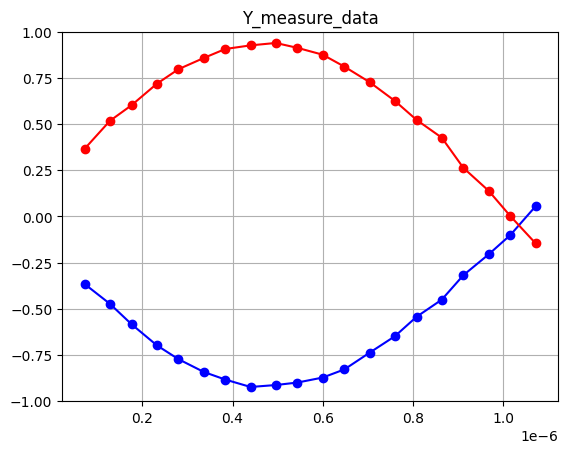

0.10952263074299179 0.03897316371661508 0.04509137694848309 600


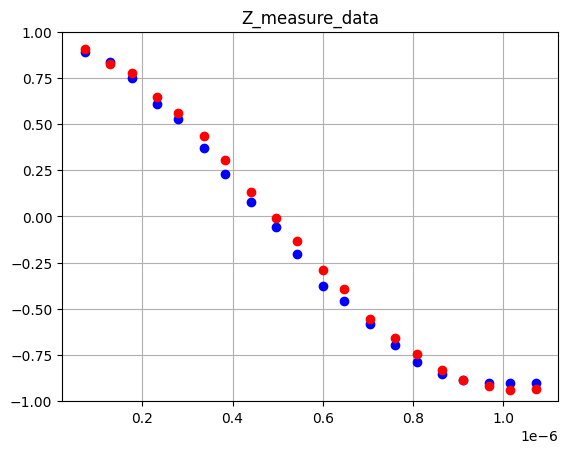

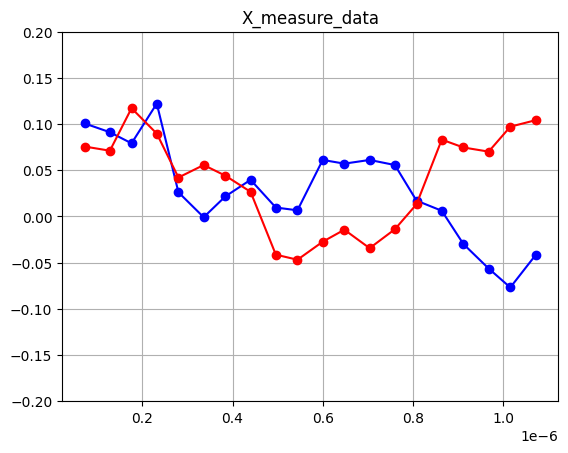

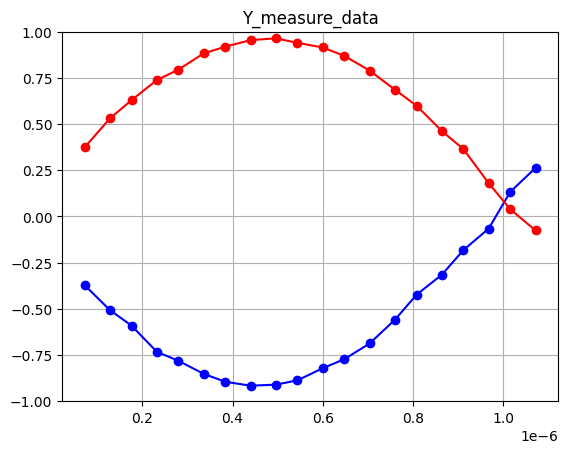

0.09998979967430136 0.03576040444969066 0.026161611479073324 600


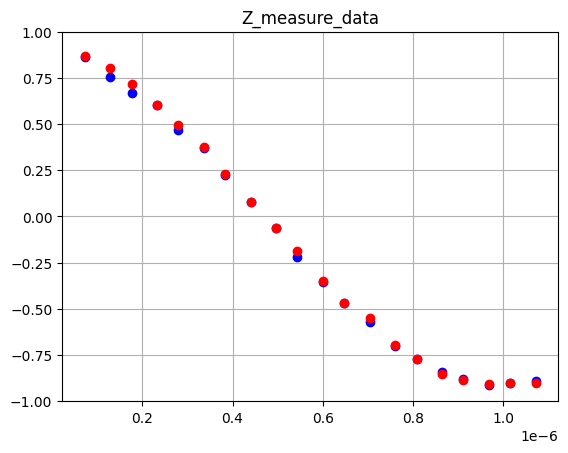

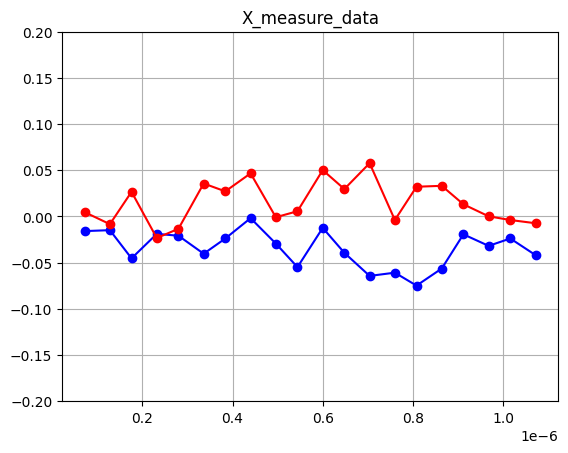

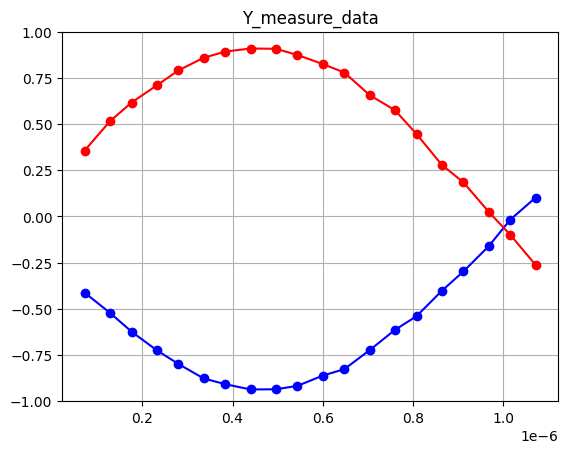

0.19326202801370715 0.03864805211537374 0.05589715191431469 600


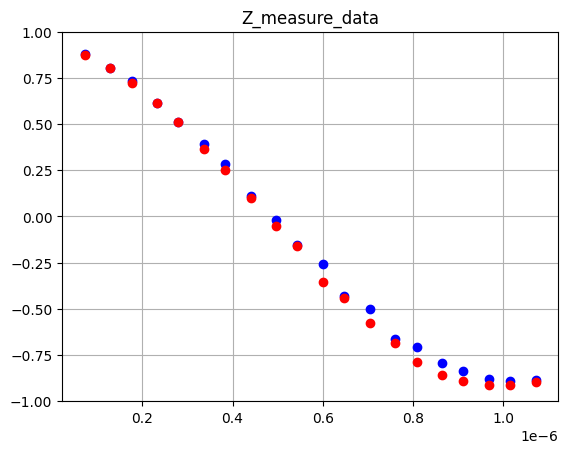

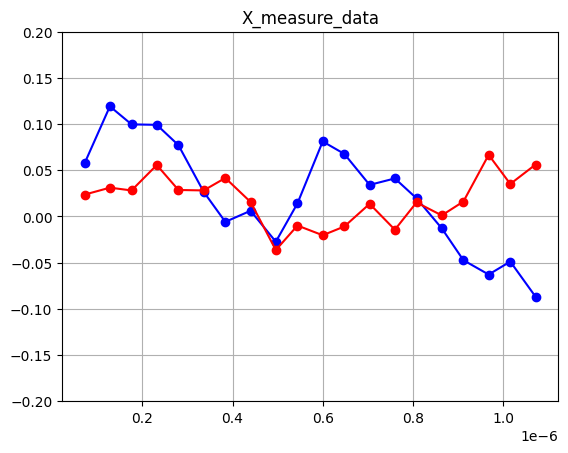

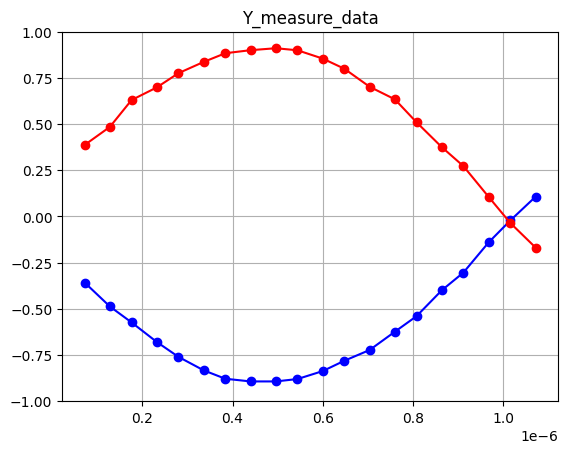

0.14988384011128564 0.03710705856346971 0.04082358338569974 600


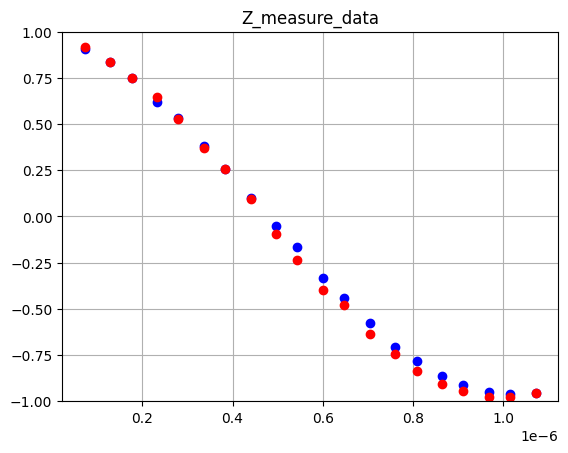

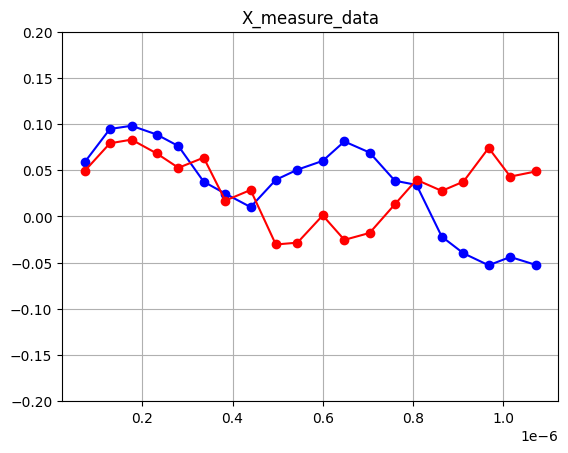

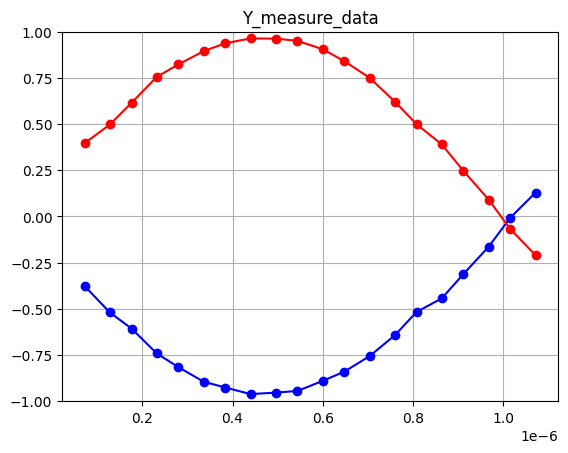

0.15746744370411117 0.03949215706941396 0.039754687428864864 600


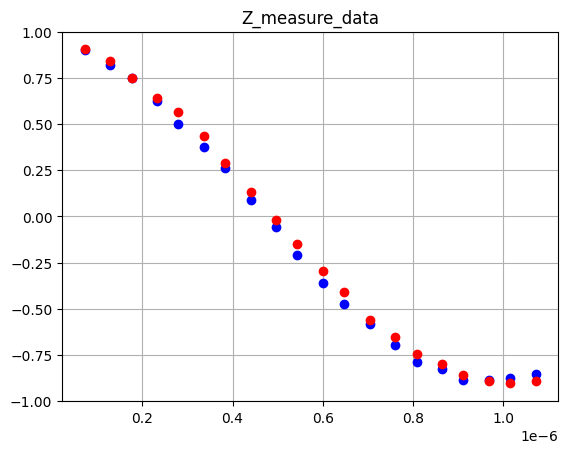

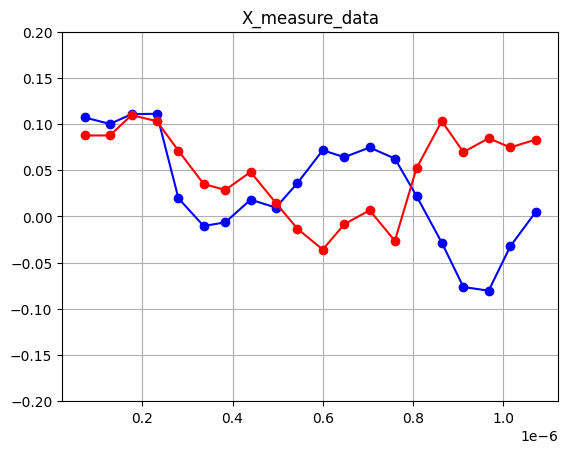

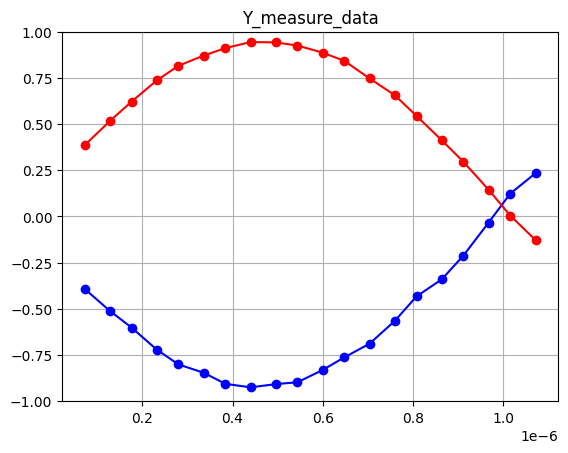

In [53]:
ecr_test_real(1)

0.10722142868729484 0.07355782669795896 -0.006659679276703101 600


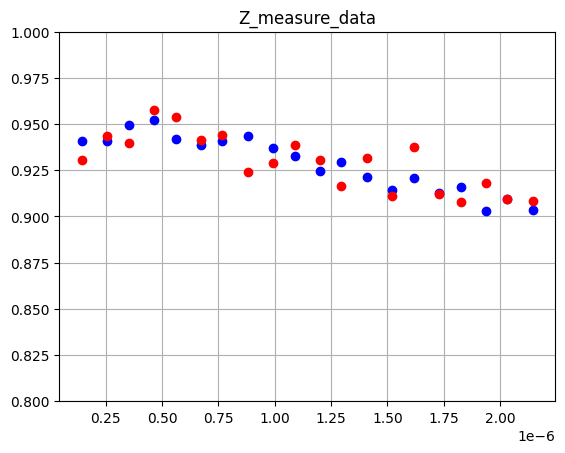

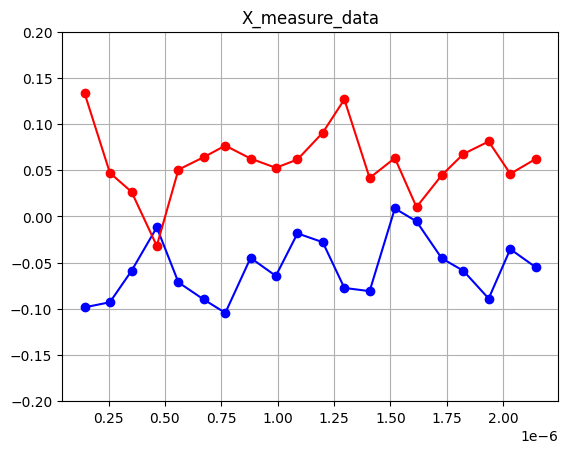

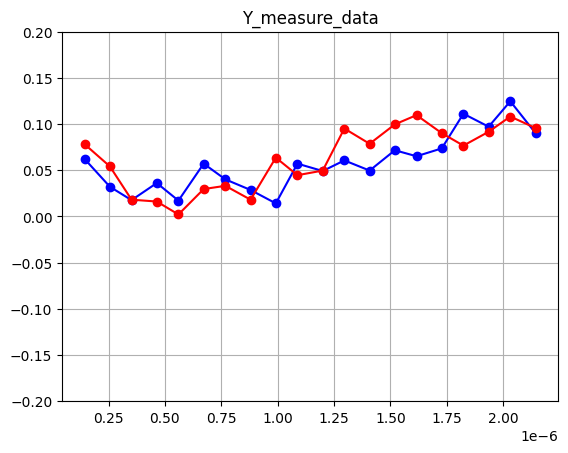

0.12961987420785068 0.07455282675965826 0.01944580690842967 600


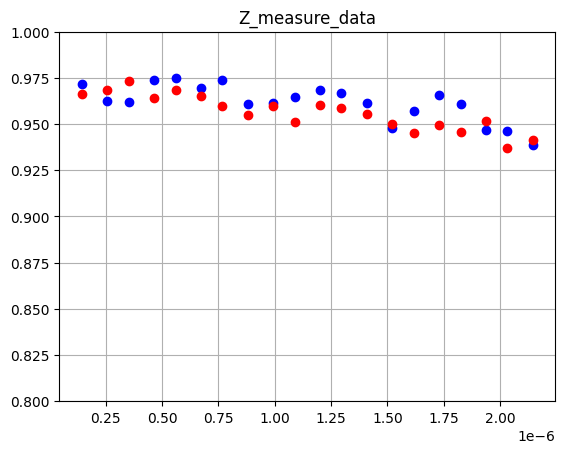

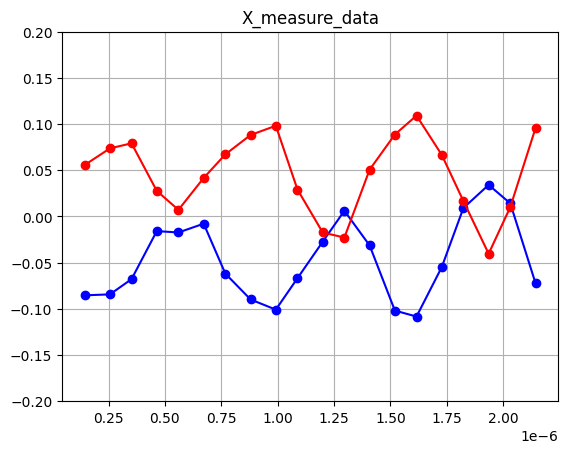

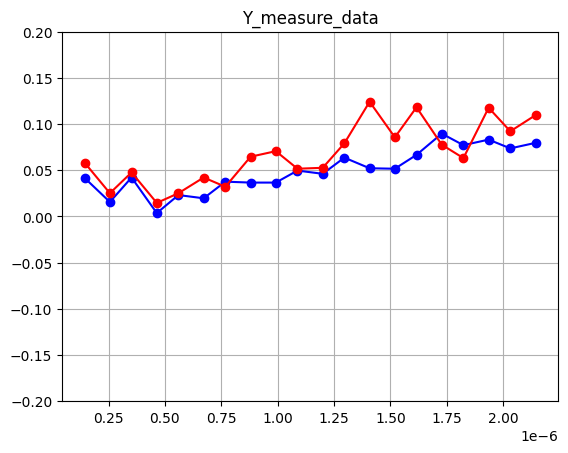

0.10952263074299179 0.07466097033142927 0.023531977906597317 600


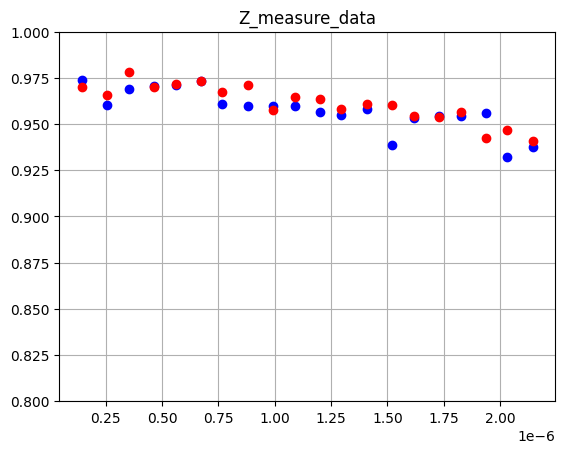

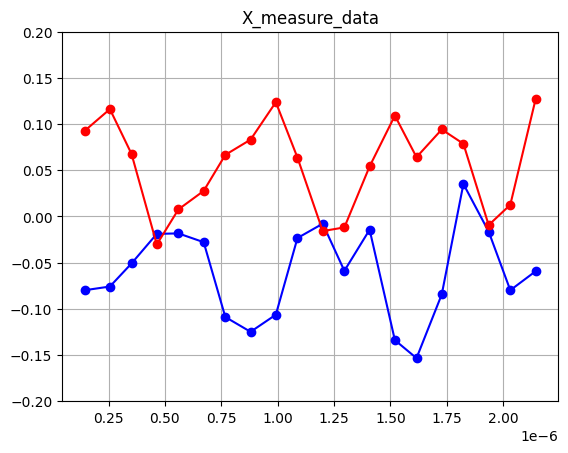

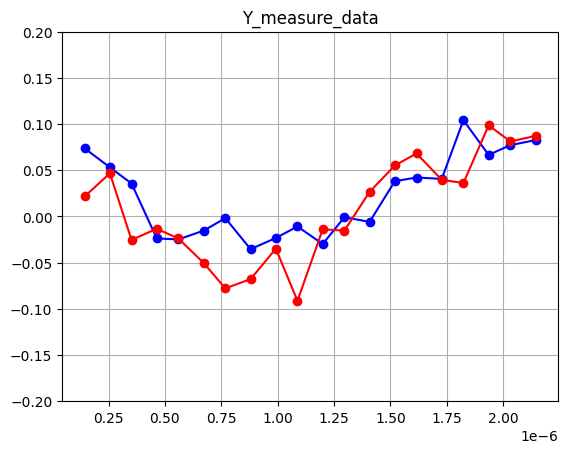

0.09998979967430136 0.09029265290083584 0.010360309461489754 600


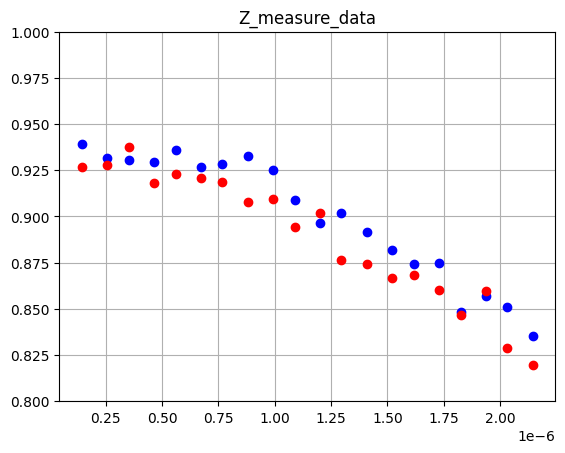

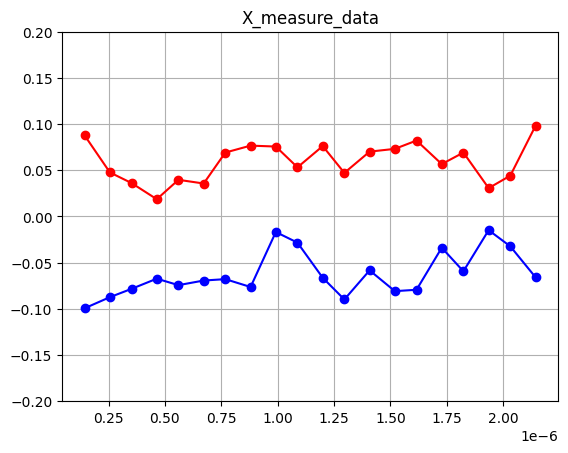

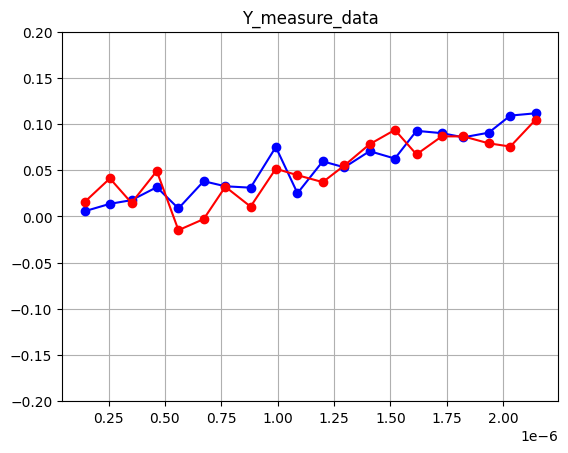

0.19326202801370715 0.07713196506649482 0.027997125897300967 600


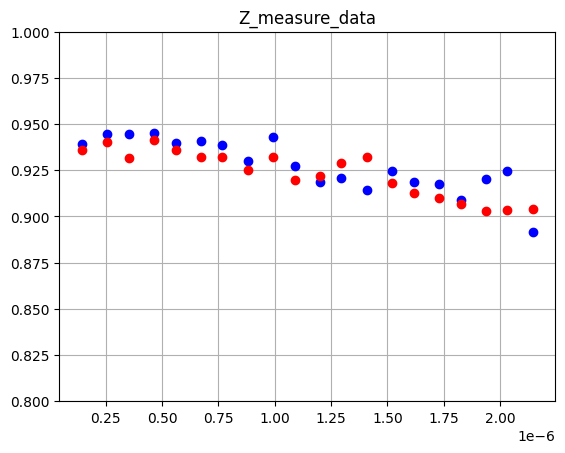

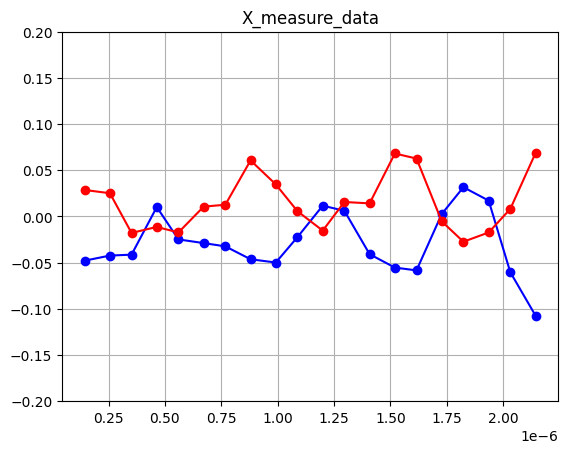

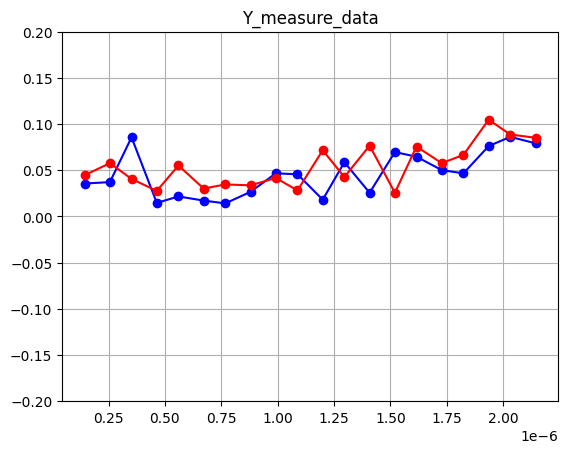

0.14988384011128564 0.0685555584292743 0.022092235875103436 600


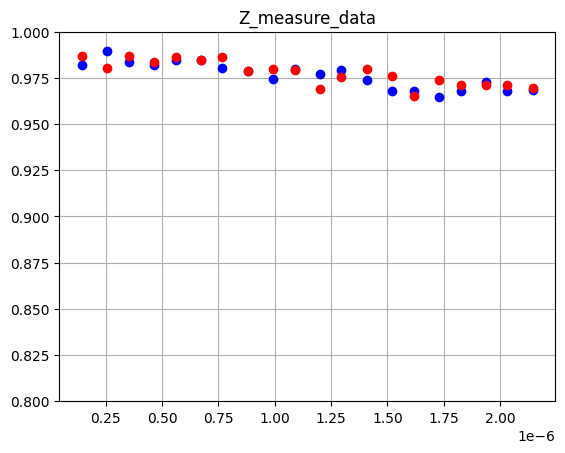

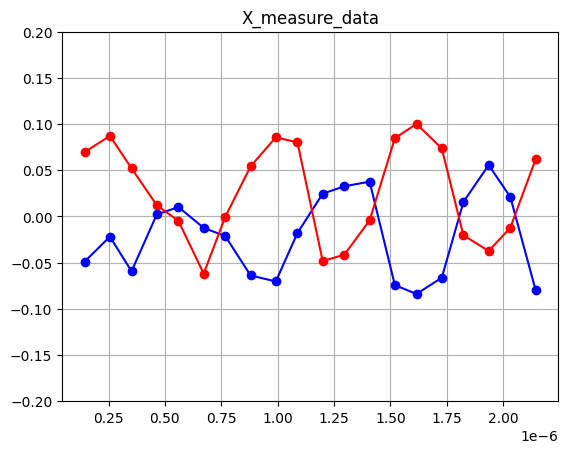

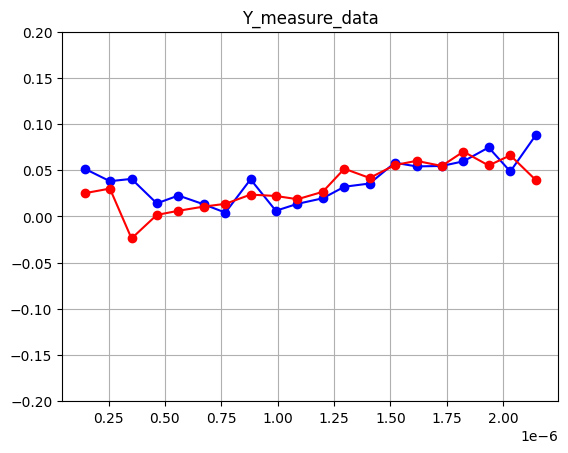

0.15746744370411117 0.07555018535392327 0.020776888509114293 600


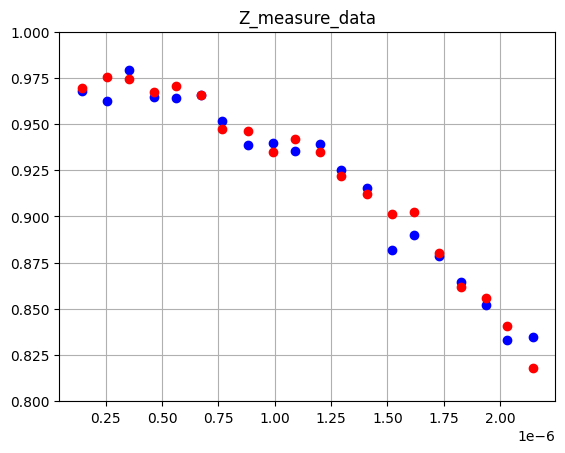

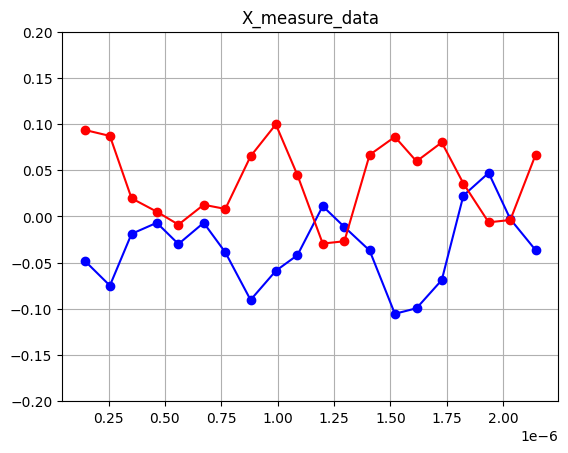

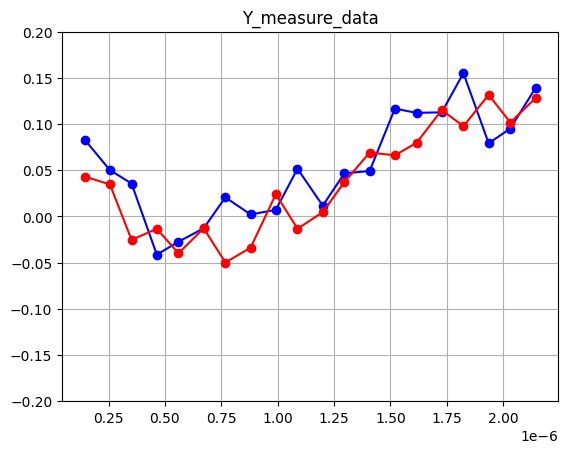

In [46]:
ecr_test(14)

0.10722142868729484 0.06830393820579421 -0.007171945358716292 600


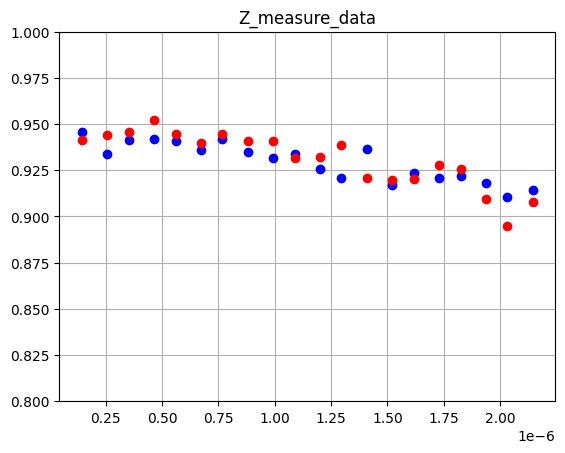

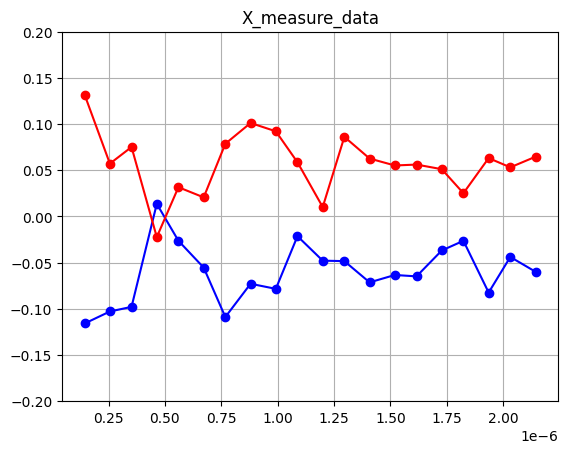

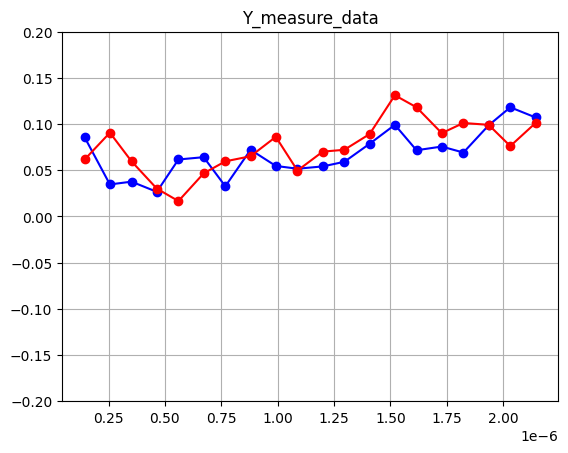

0.12961987420785068 0.06922971567060081 0.020941216541887648 600


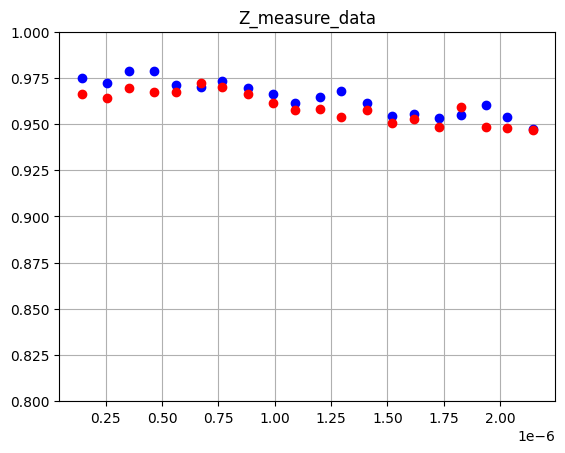

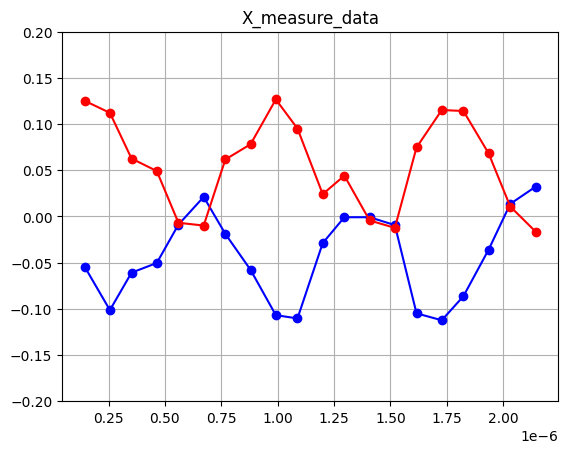

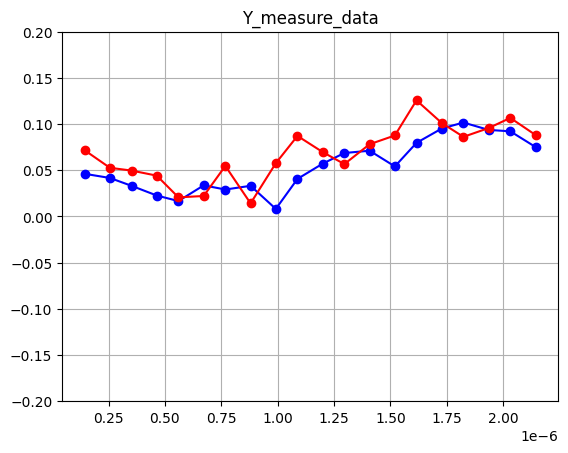

0.10952263074299179 0.06944850319849918 0.025298537532732236 600


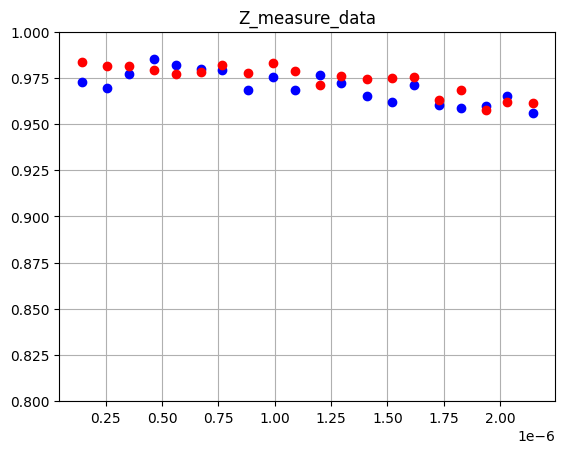

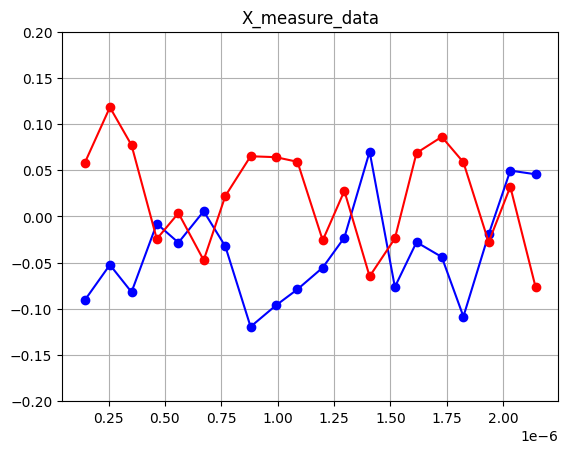

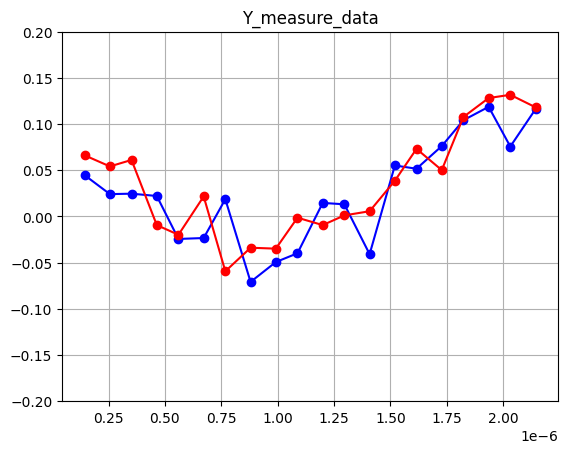

0.09998979967430136 0.08384389655120139 0.011157192568963194 600


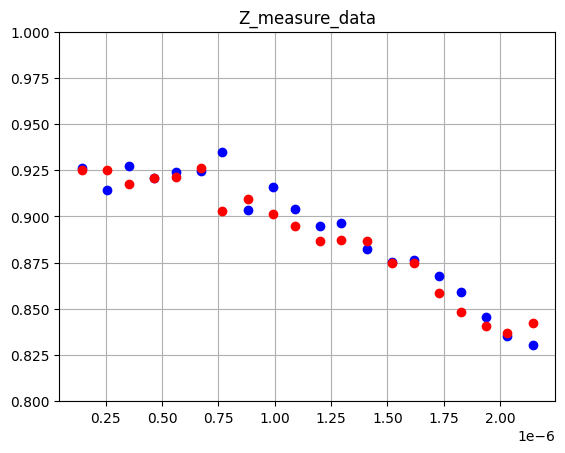

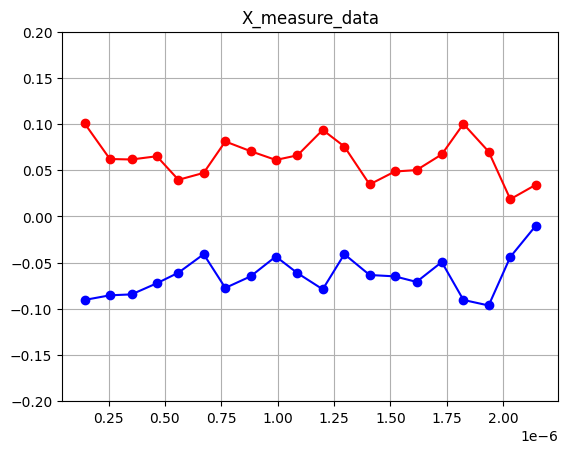

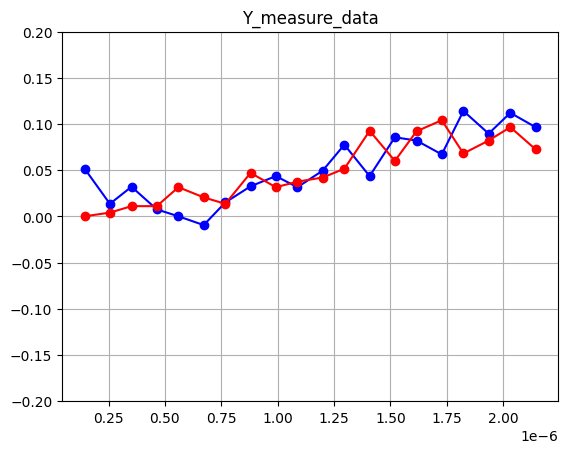

0.19326202801370715 0.07187398894002077 0.030045864578889782 600


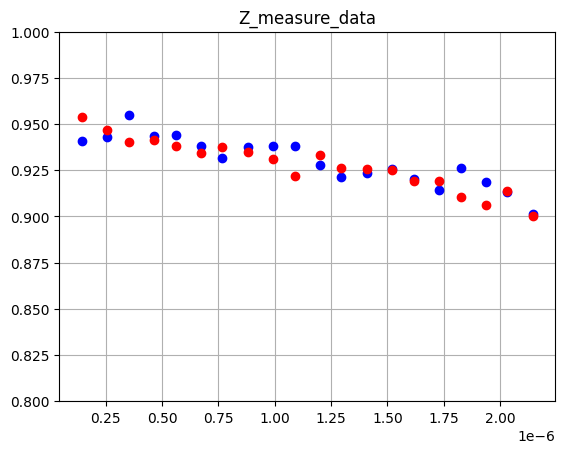

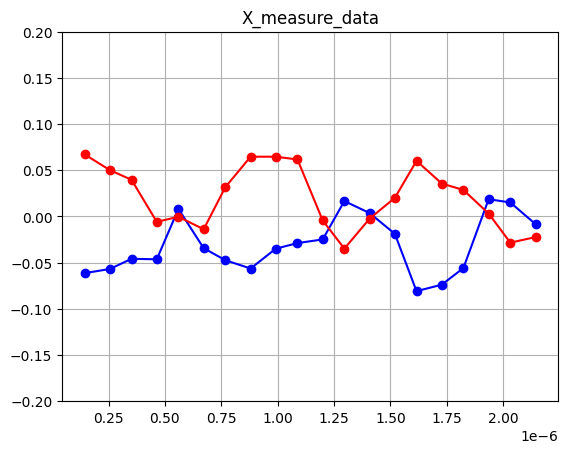

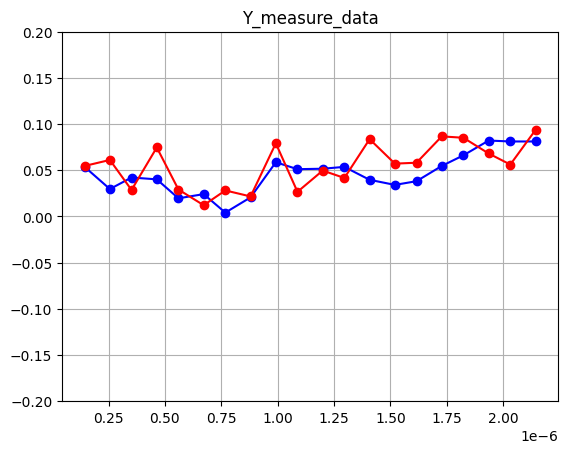

0.14988384011128564 0.06376901530853402 0.02375079422969979 600


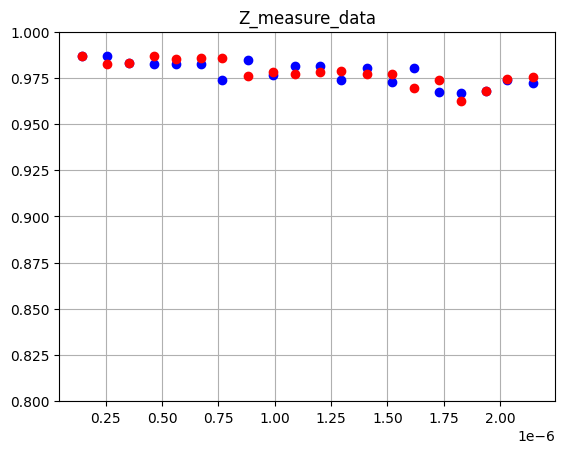

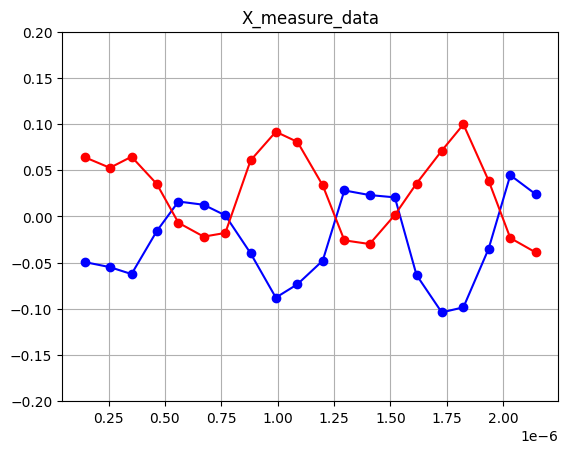

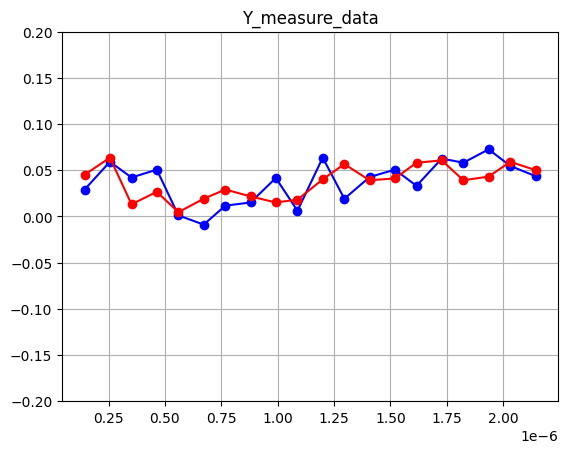

0.15746744370411117 0.07031123615391467 0.022325240231834197 600


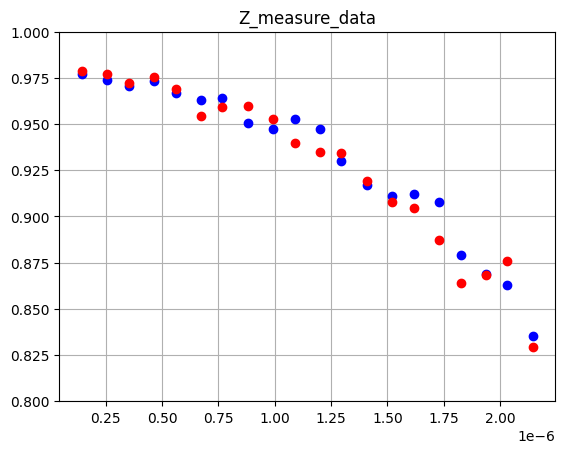

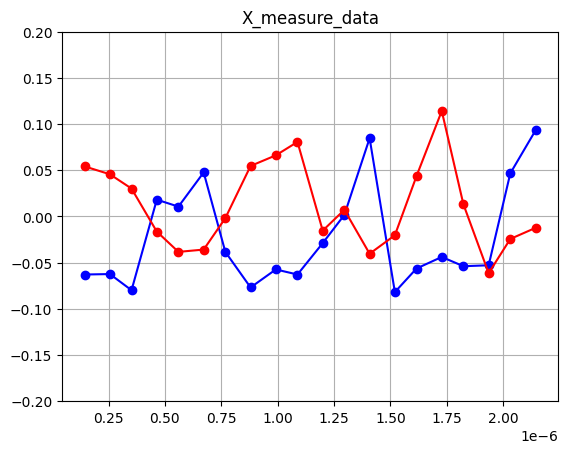

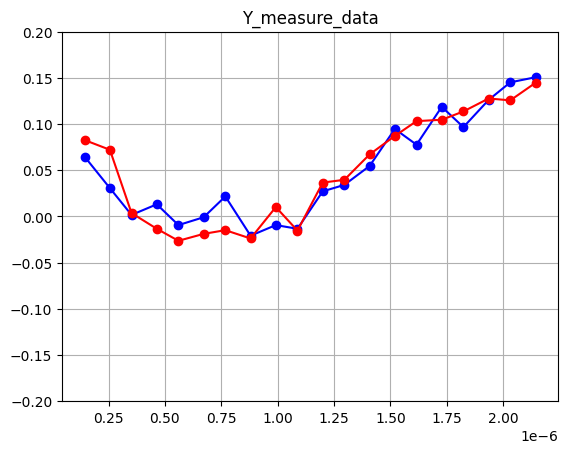

In [47]:
ecr_test(13)

0.10722142868729484 0.07881173191931713 -0.006215712501988522 600


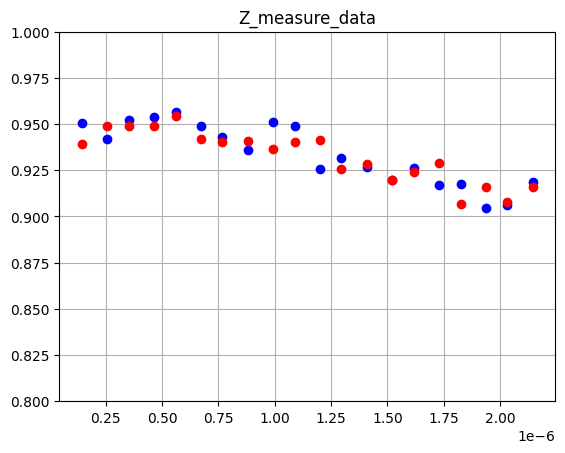

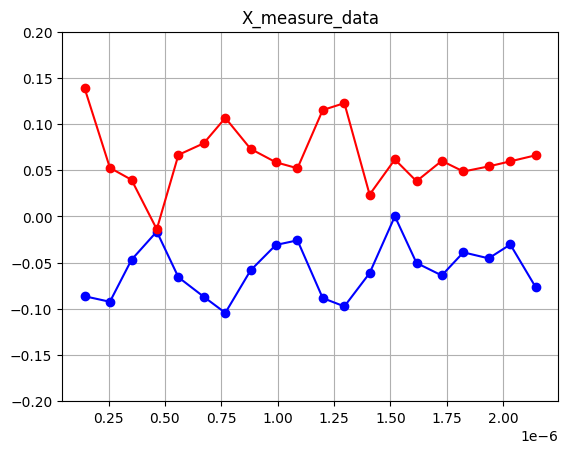

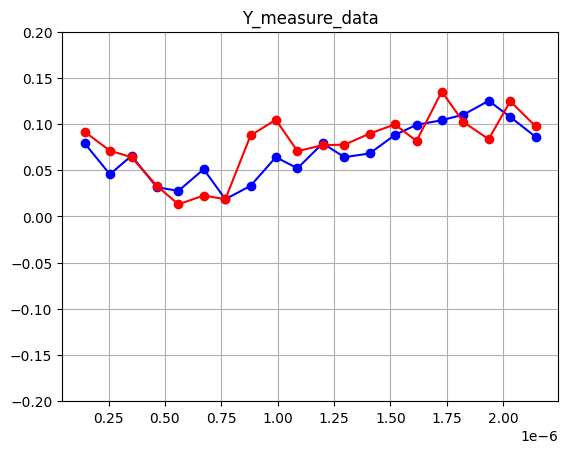

0.12961987420785068 0.0798760823462934 0.018149714622803407 600


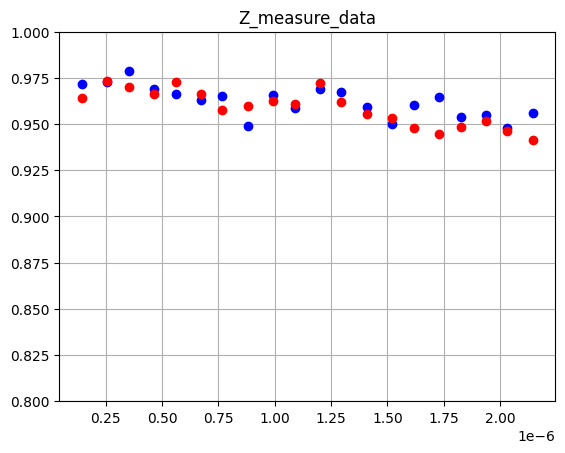

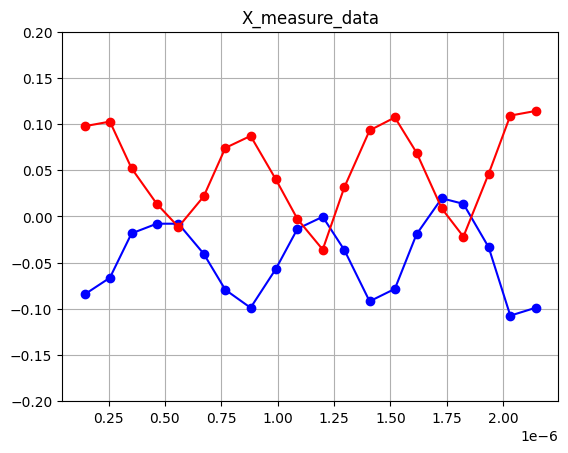

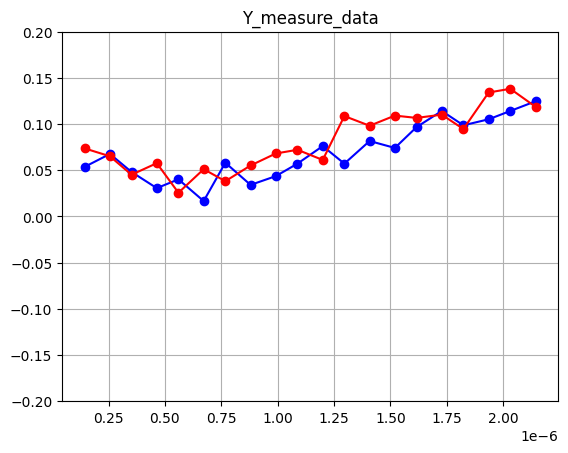

0.10952263074299179 0.07987364005066379 0.021995990486994448 600


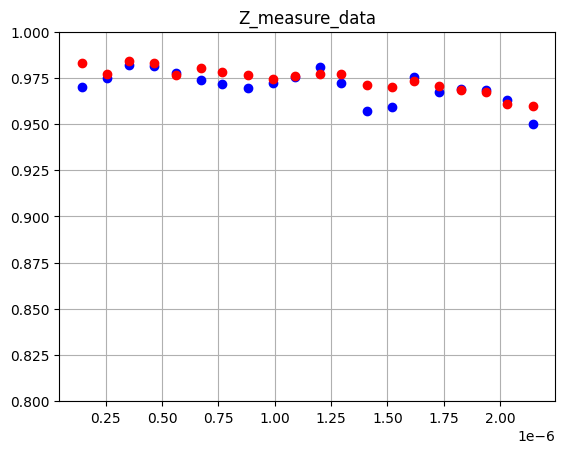

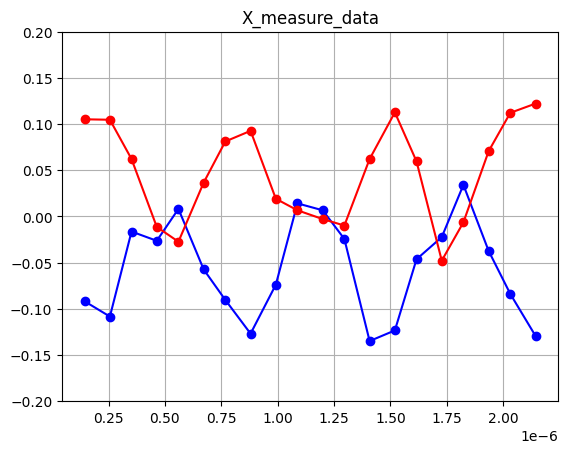

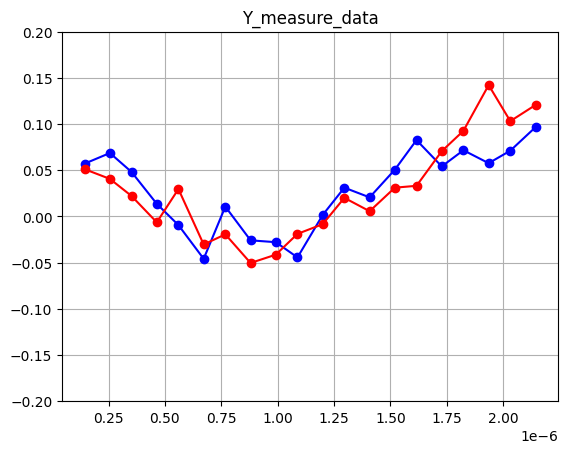

0.09998979967430136 0.09674145894408216 0.00966966675467262 600


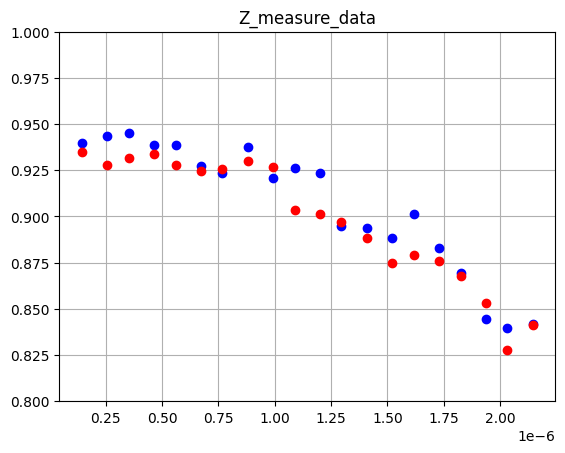

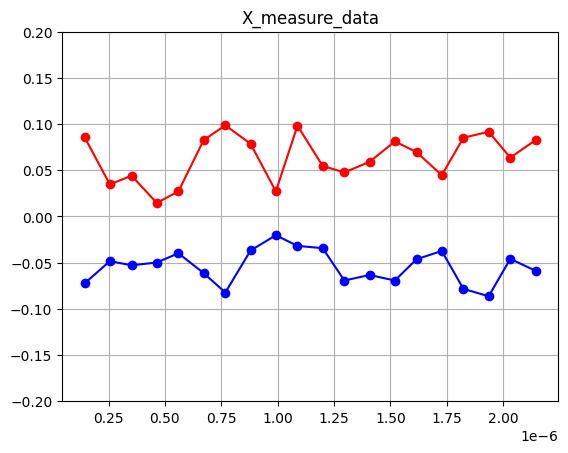

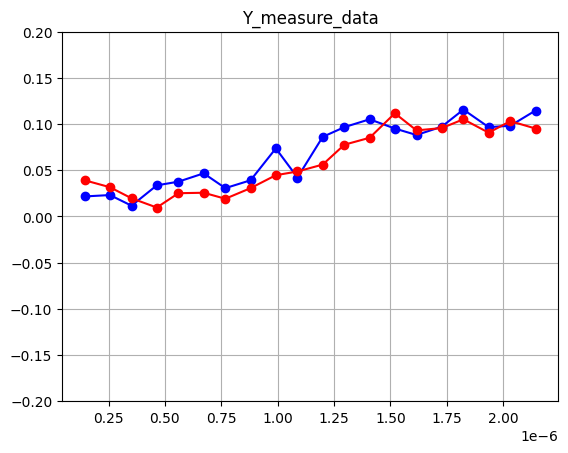

0.19326202801370715 0.08239022361865322 0.026209887190376854 600


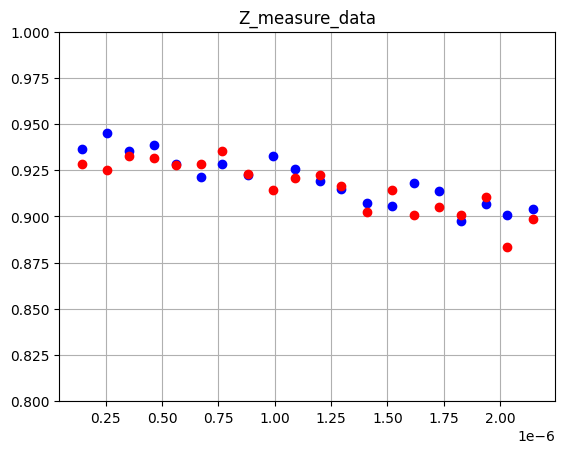

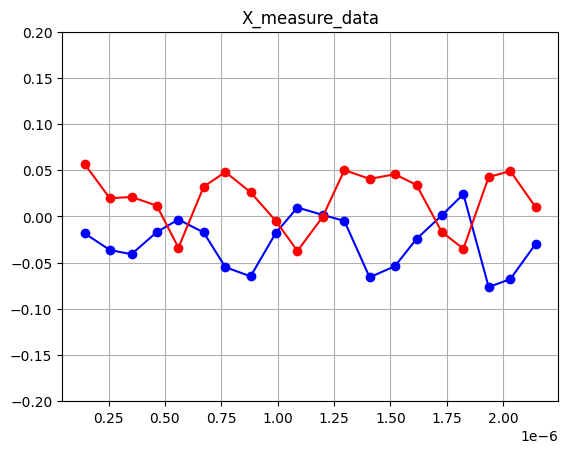

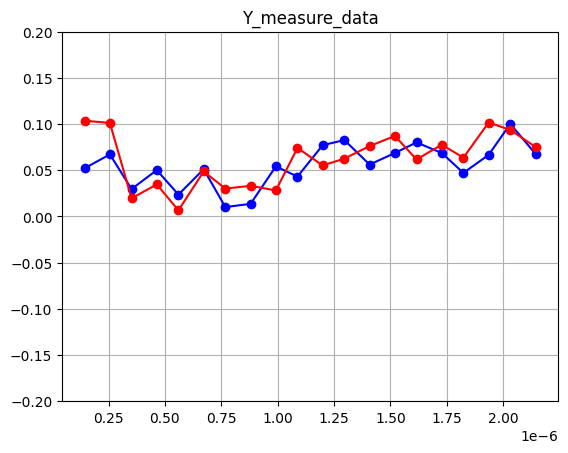

0.14988384011128564 0.07334226551833992 0.0206501666872428 600


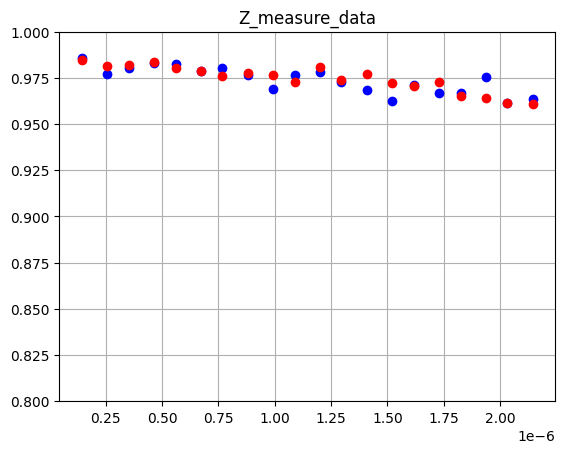

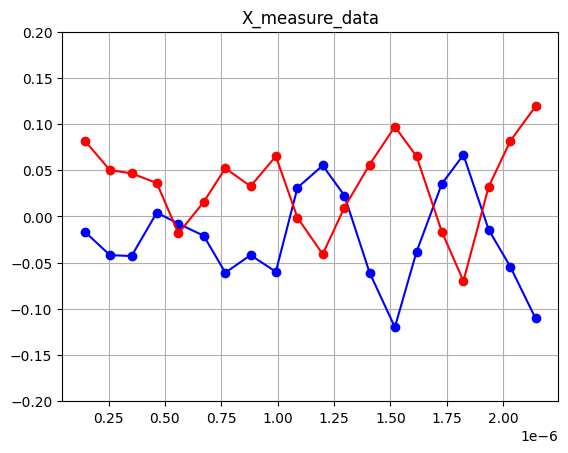

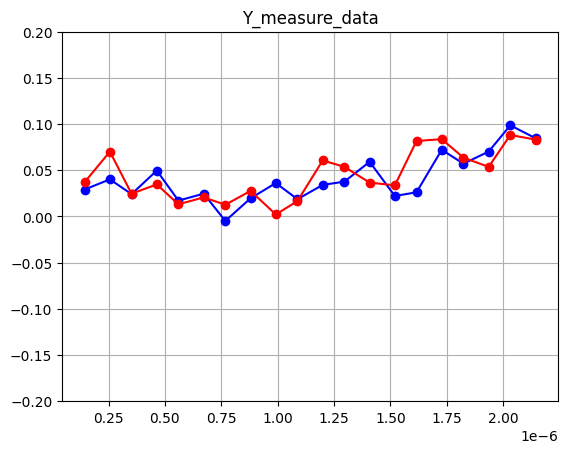

0.15746744370411117 0.08078929218653394 0.019429352095223756 600


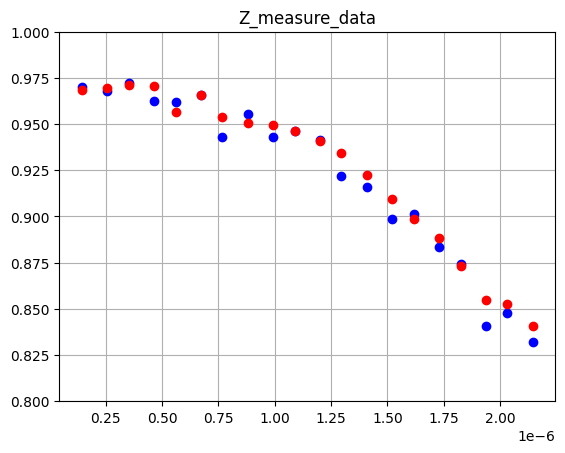

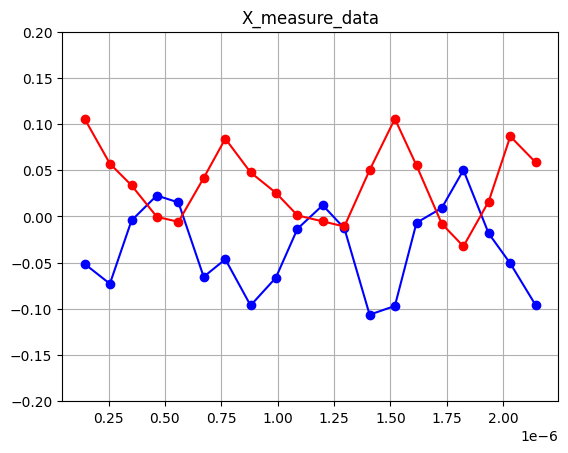

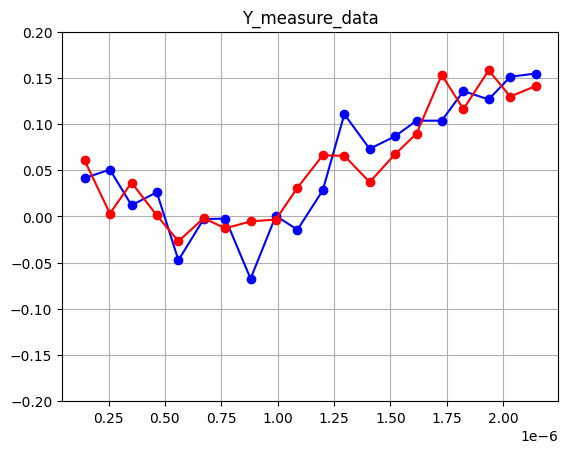

In [48]:
ecr_test(15)

0.10722142868729484 0.05254242328860486 -0.009323418668140345 600


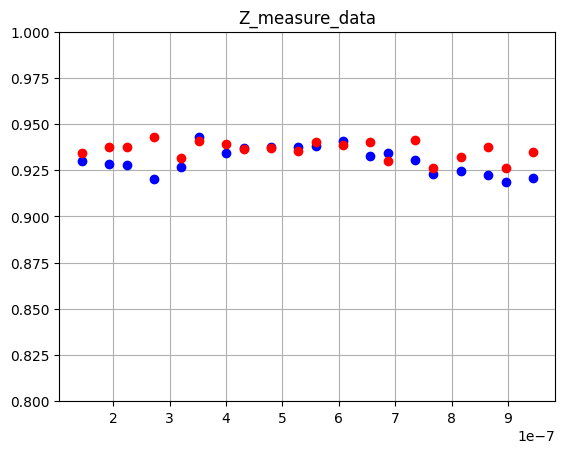

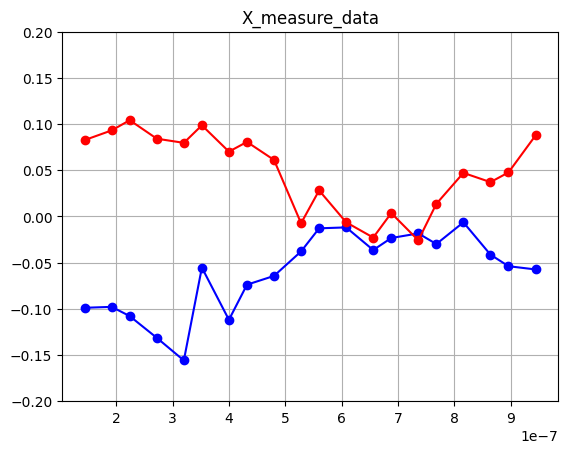

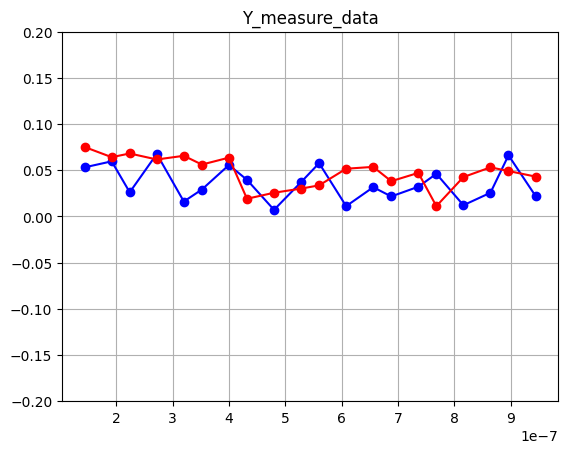

0.12961987420785068 0.05326168262868848 0.027220836392934024 600


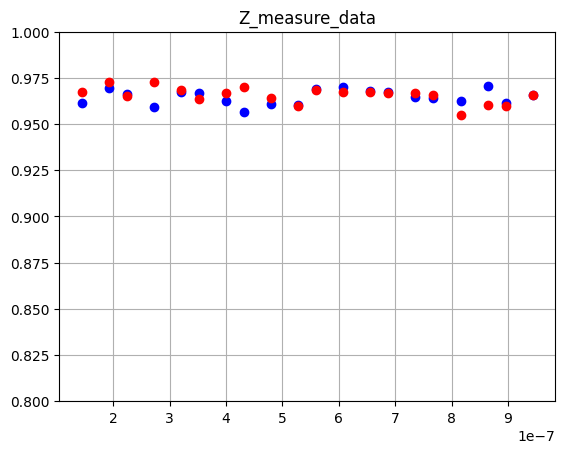

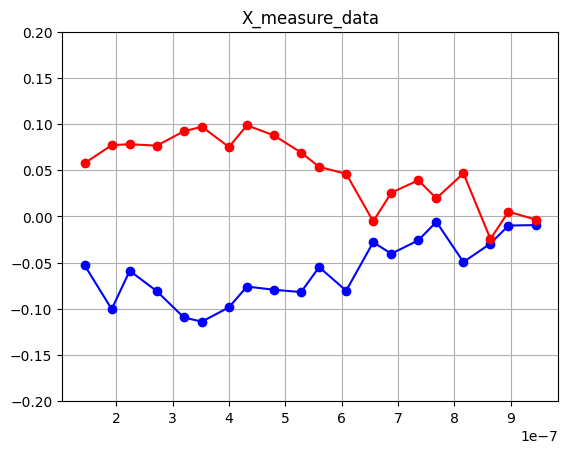

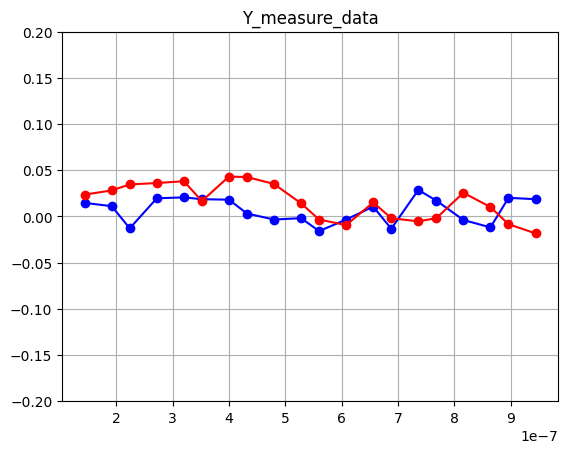

0.10952263074299179 0.05381290600143341 0.03265146746282174 600


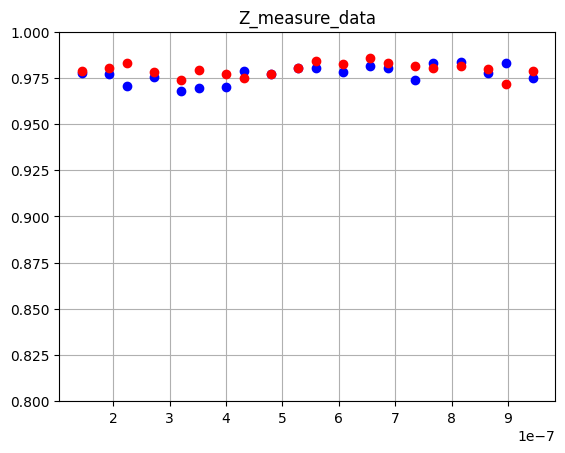

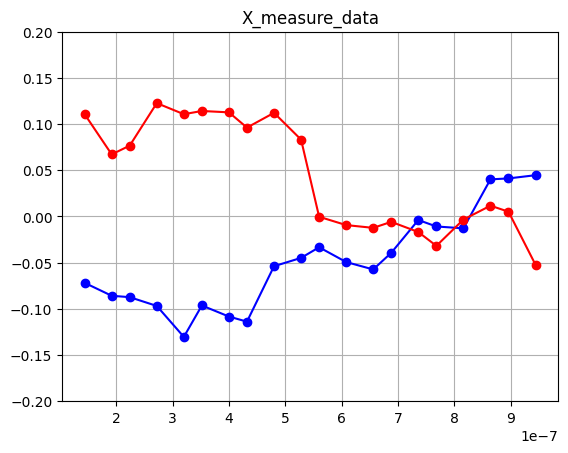

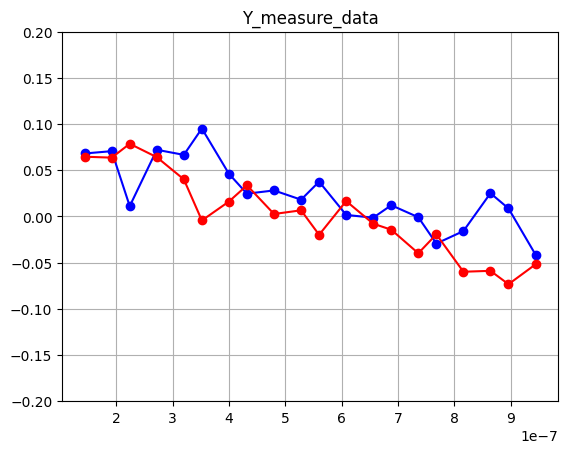

0.09998979967430136 0.06449807472010756 0.014503935096210088 600


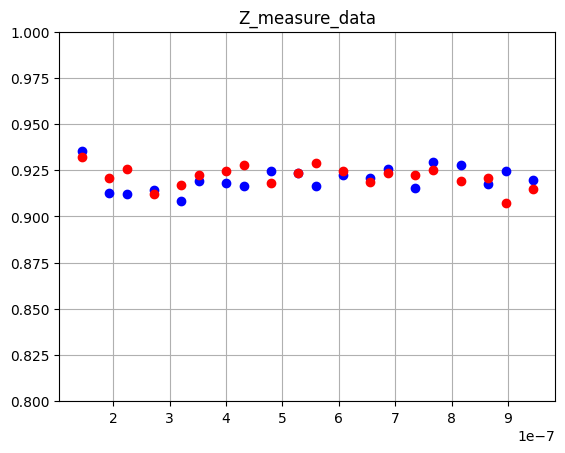

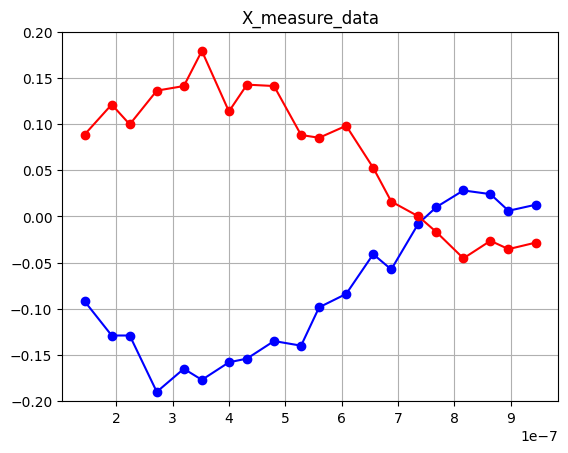

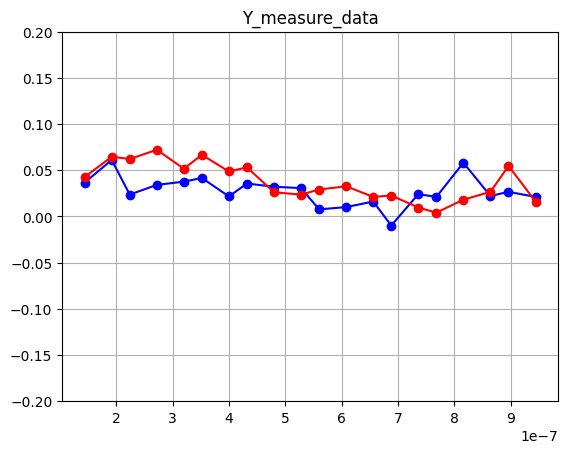

0.19326202801370715 0.05610254917388101 0.03849601592622527 600


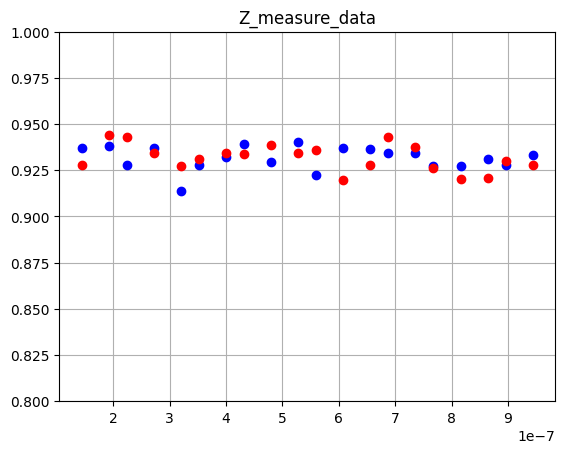

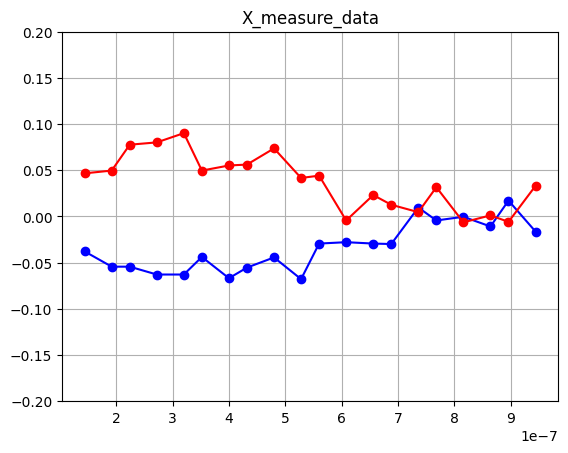

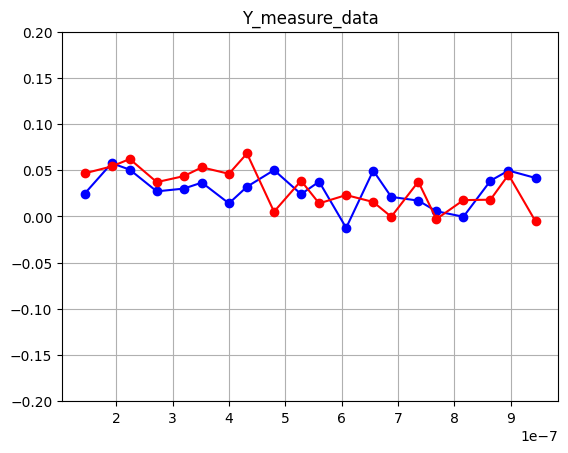

0.14988384011128564 0.04941084627014477 0.030654394582053678 600


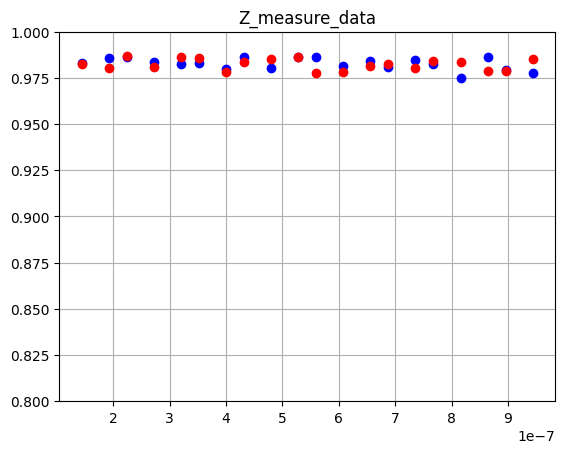

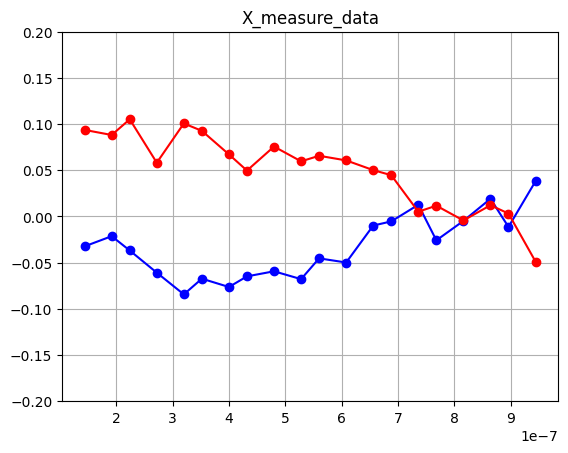

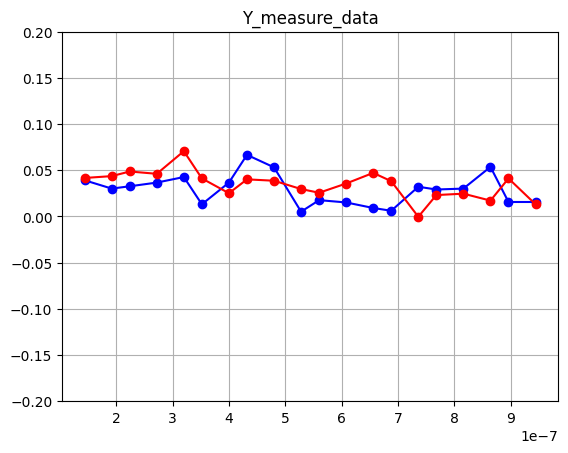

0.15746744370411117 0.05459578813187033 0.028753154680730322 600


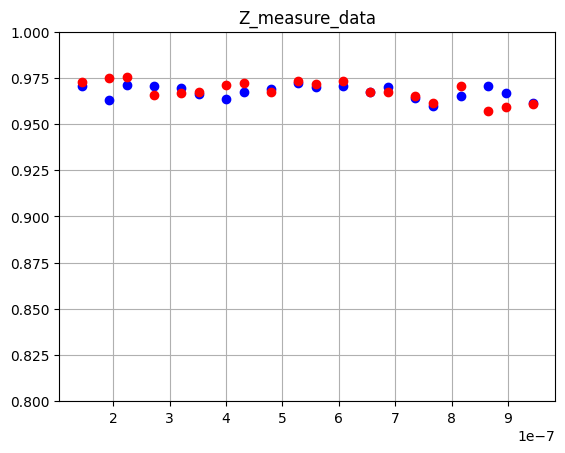

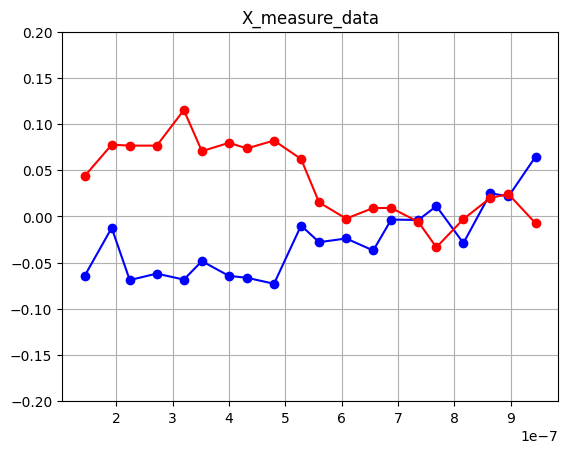

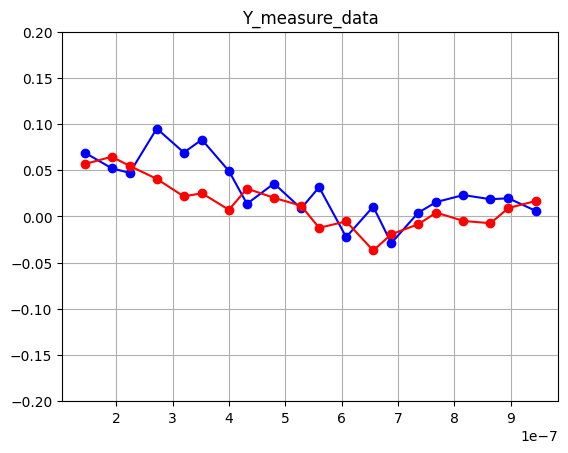

In [ ]:
ecr_test(8)

0.10722142868729484 0.057796229657971064 -0.00847587777564986 600


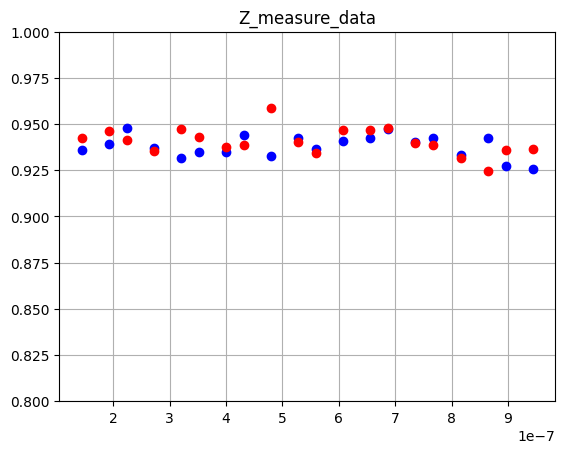

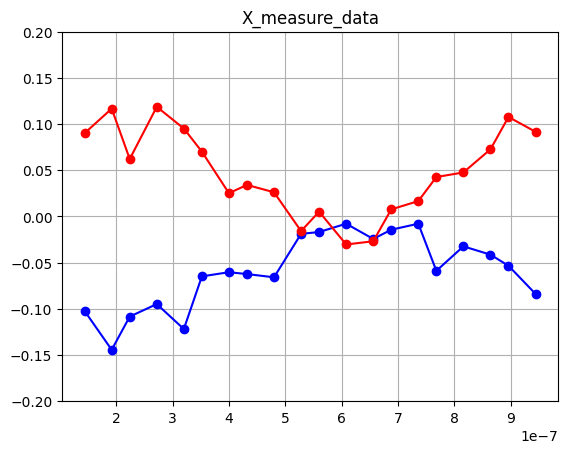

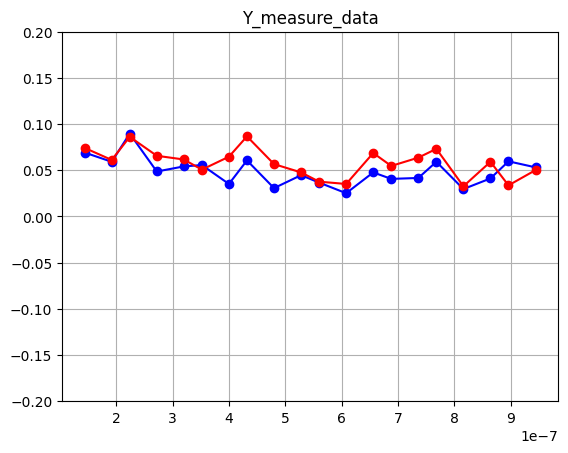

0.12961987420785068 0.05858408453773081 0.024747275605002023 600


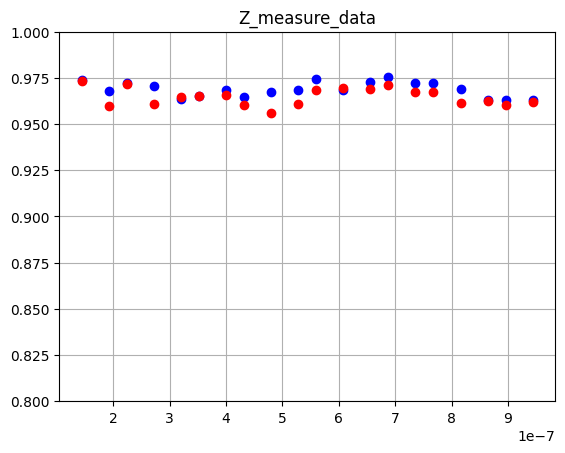

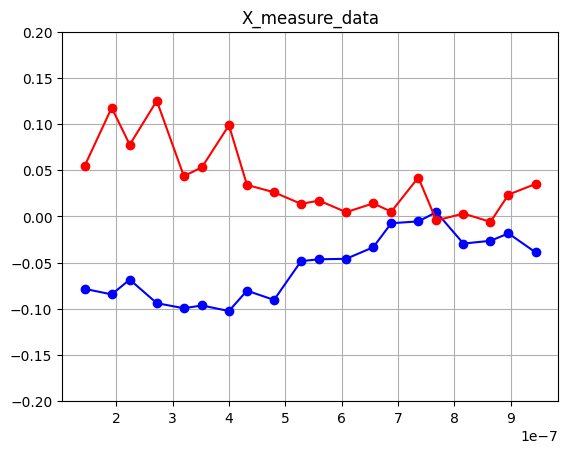

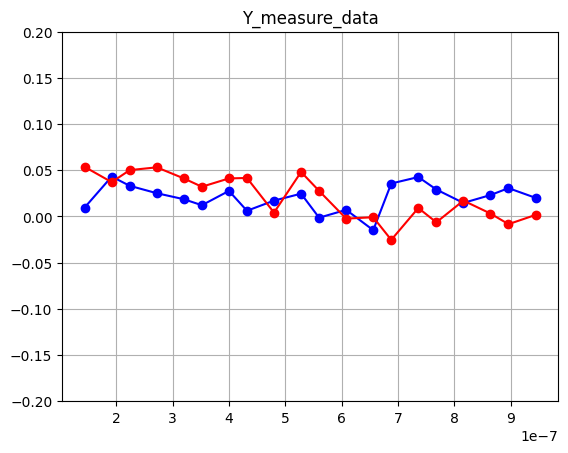

0.10952263074299179 0.05902439137556799 0.029767653544334693 600


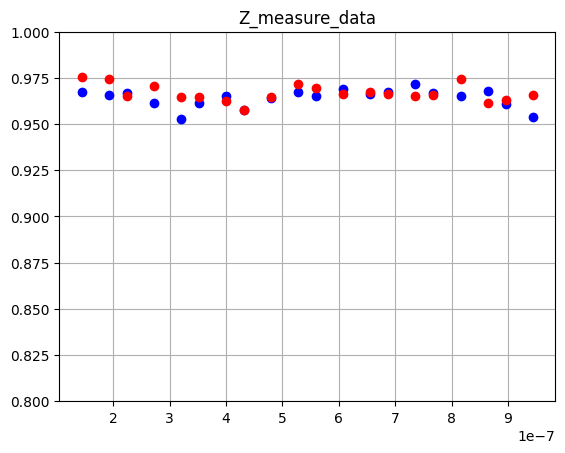

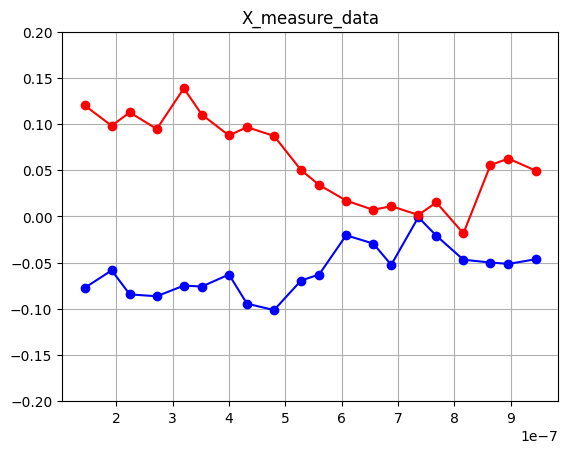

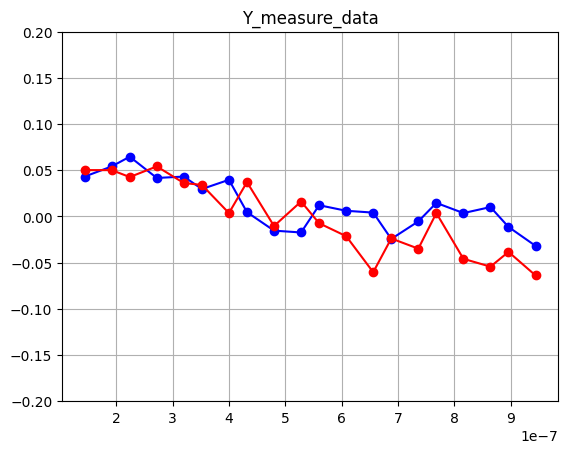

0.09998979967430136 0.07094658713605217 0.013185556002741006 600


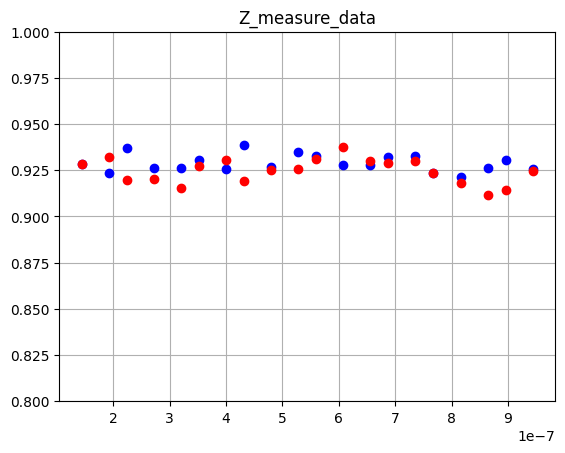

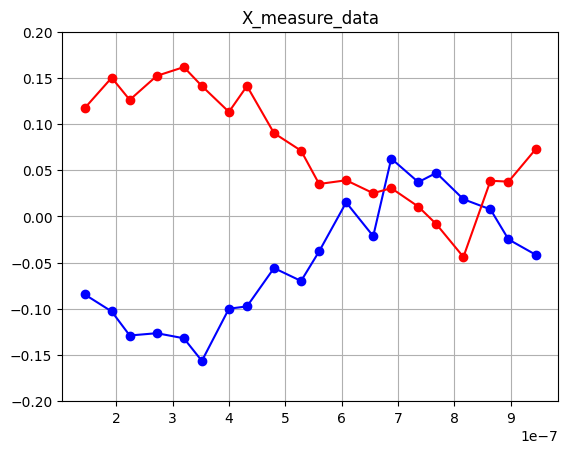

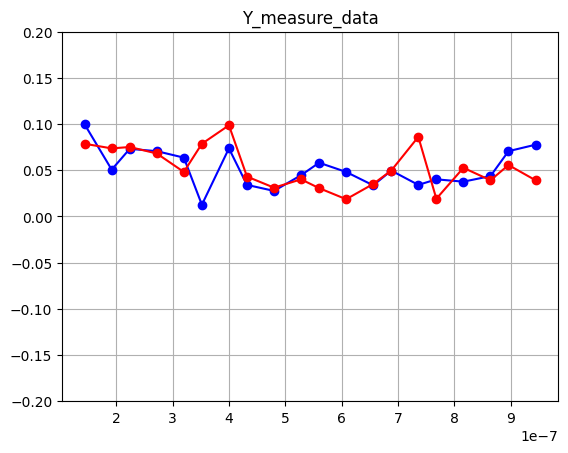

0.19326202801370715 0.06135917437958736 0.035196645377771944 600


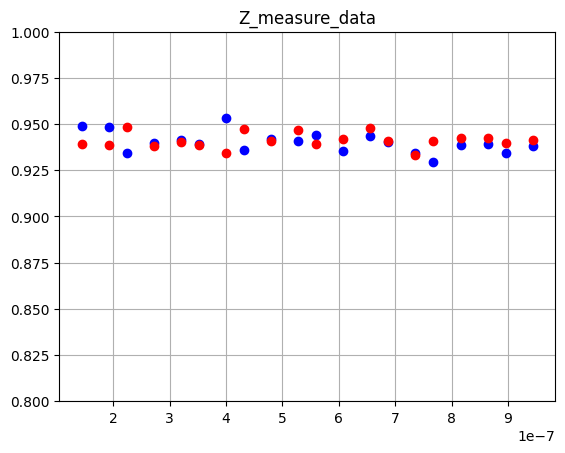

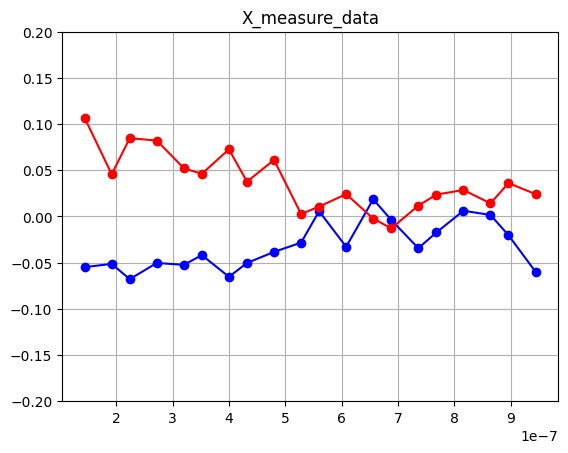

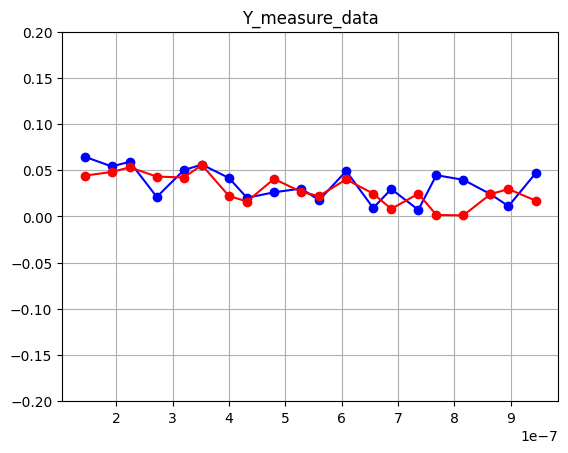

0.14988384011128564 0.054196594747374725 0.027946765442831686 600


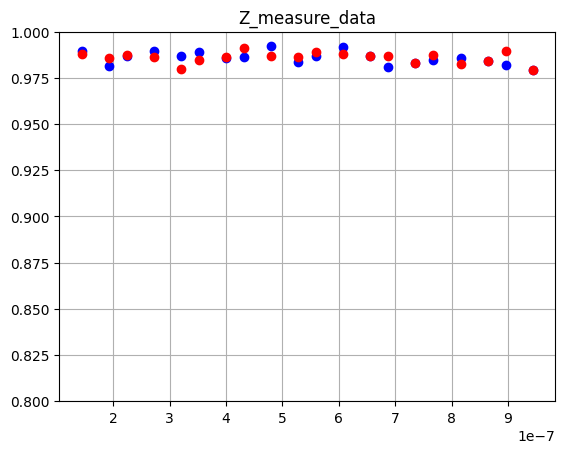

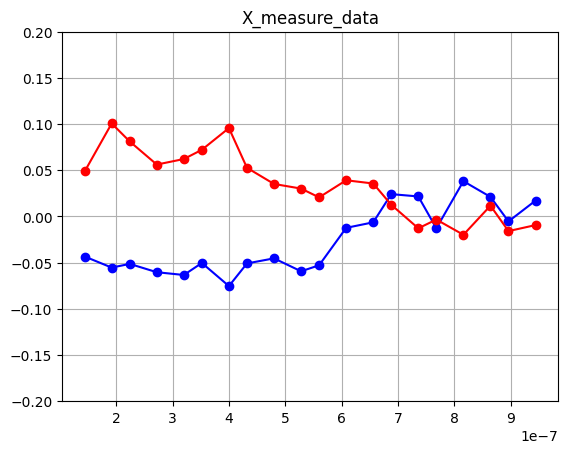

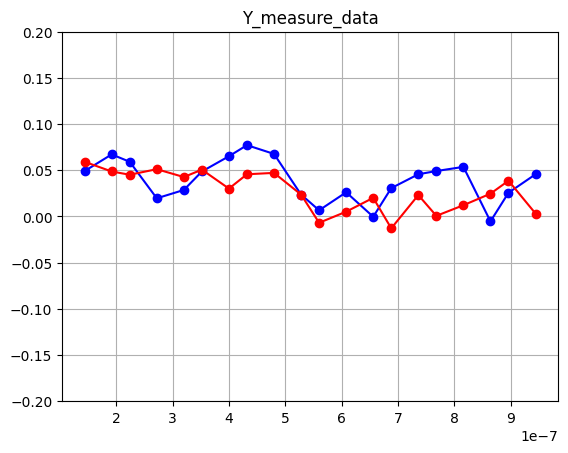

0.15746744370411117 0.05983397627481826 0.026235343429572573 600


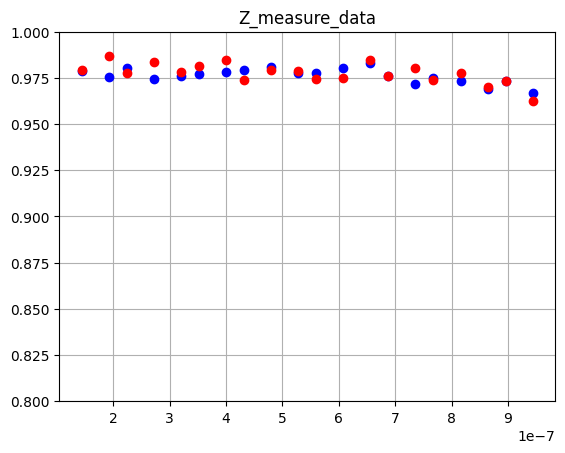

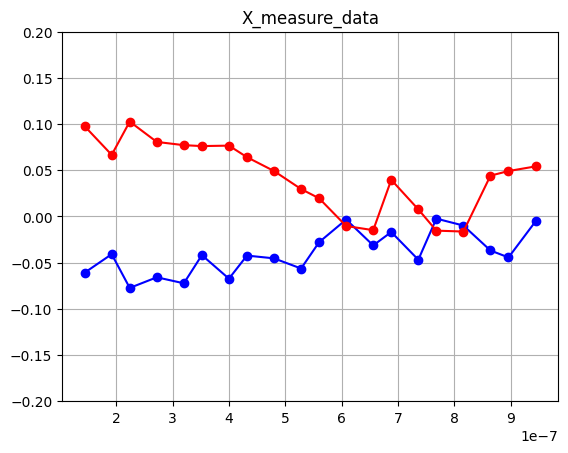

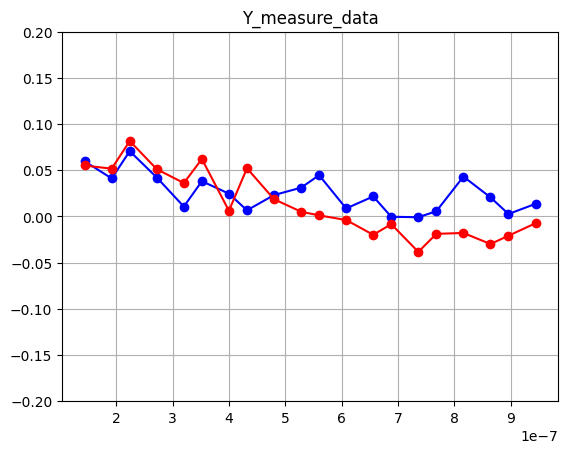

In [ ]:
ecr_test(9)

0.10722142868729484 0.057796229657971064 -0.00847587777564986 600


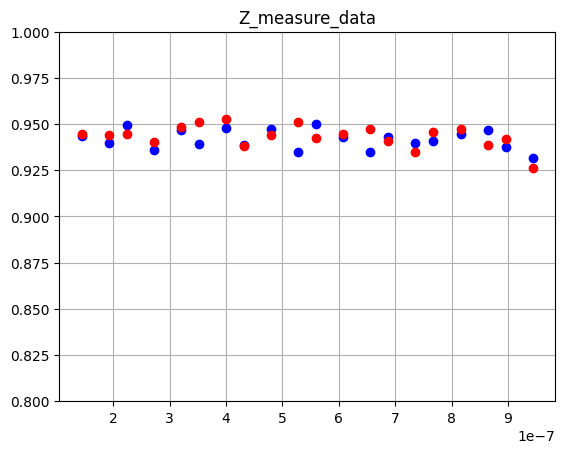

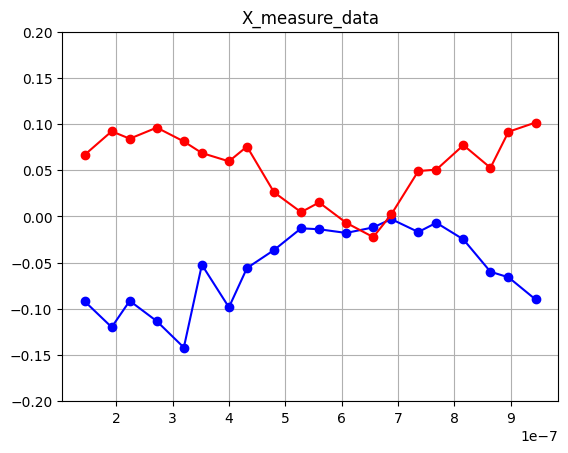

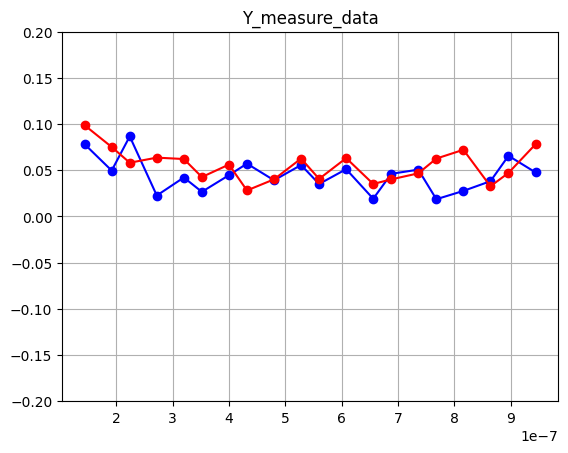

0.12961987420785068 0.05858408453773081 0.024747275605002023 600


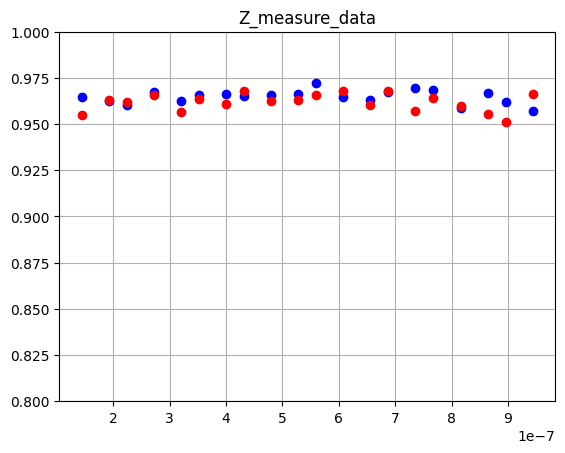

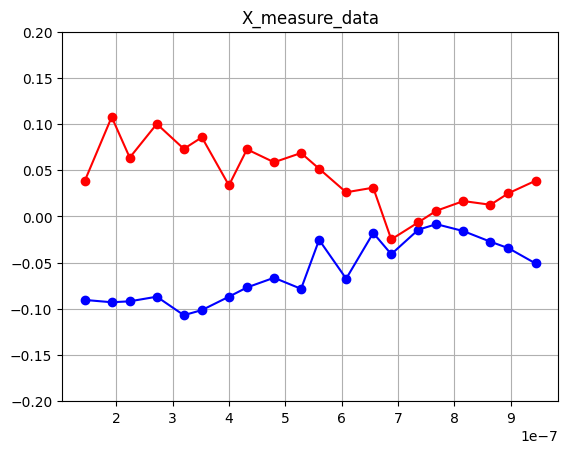

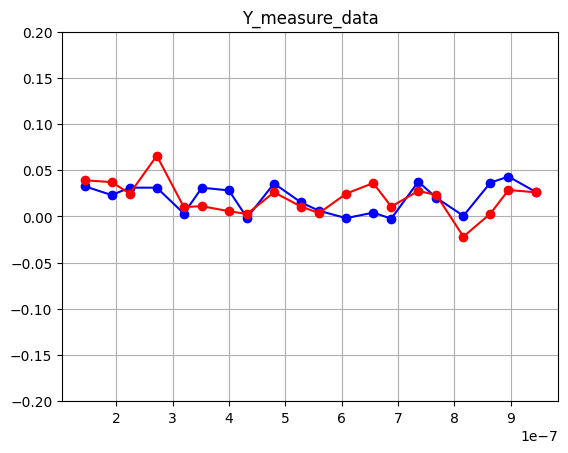

0.10952263074299179 0.05902439137556799 0.029767653544334693 600


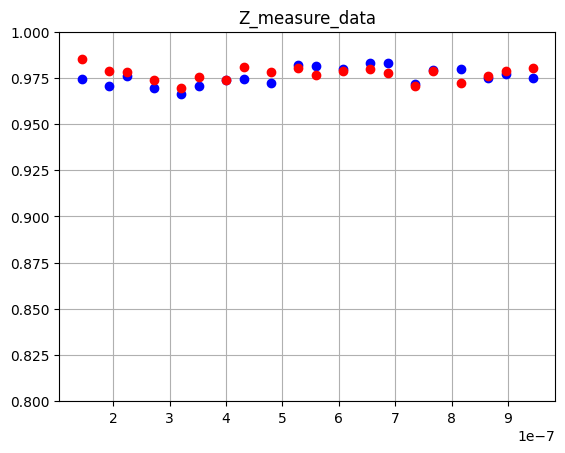

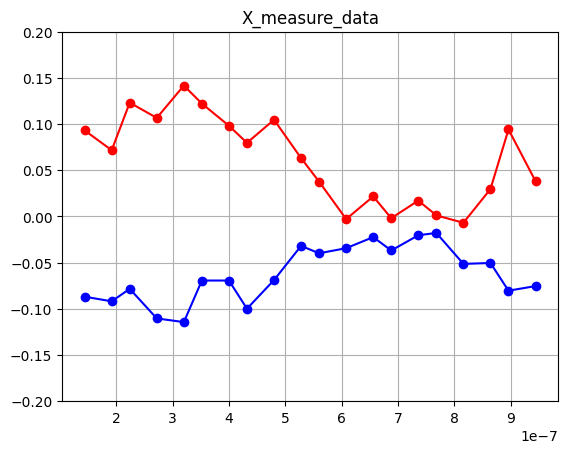

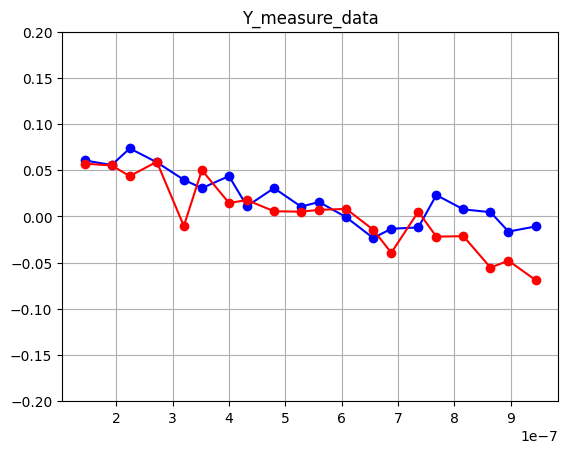

0.09998979967430136 0.07094658713605217 0.013185556002741006 600


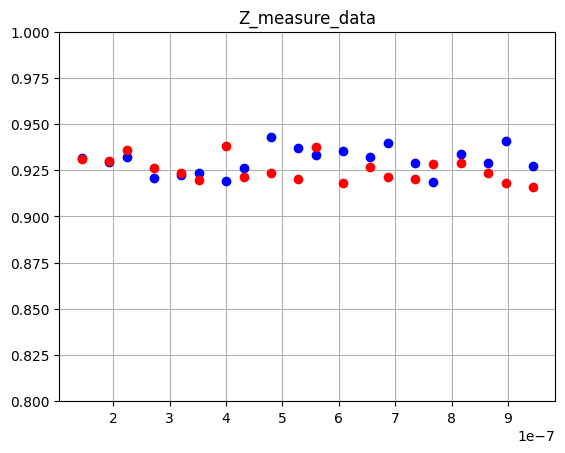

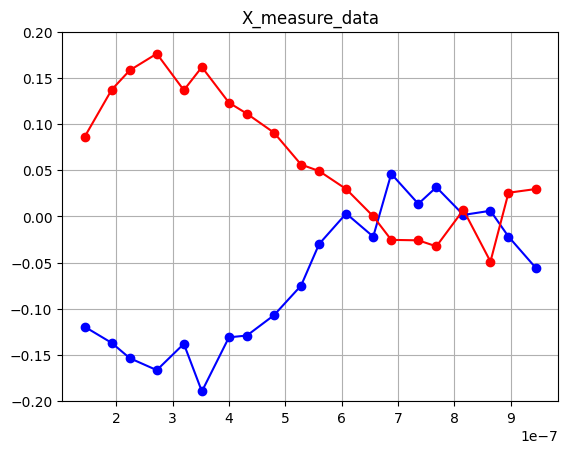

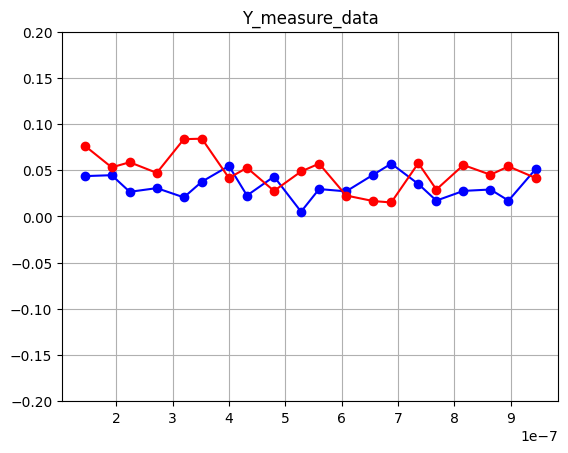

0.19326202801370715 0.06135917437958736 0.035196645377771944 600


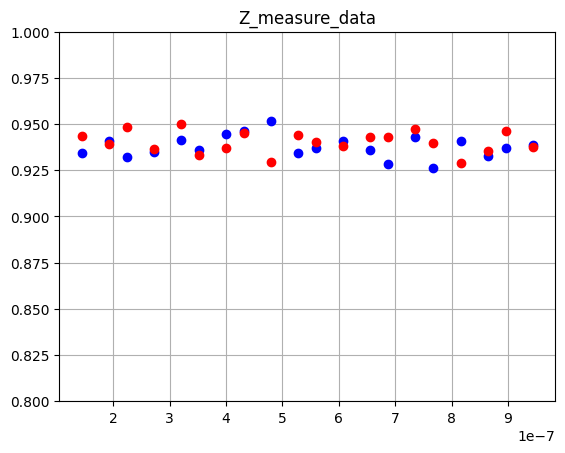

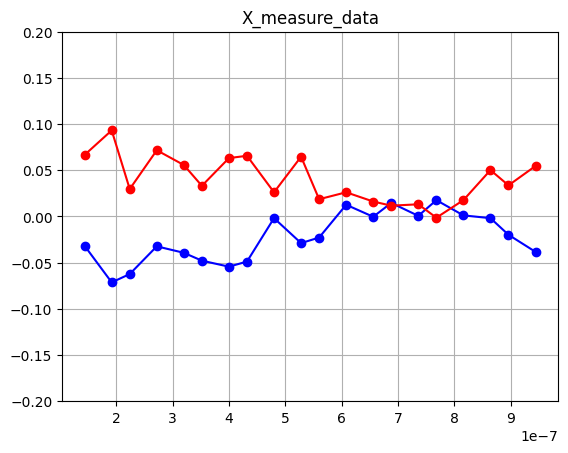

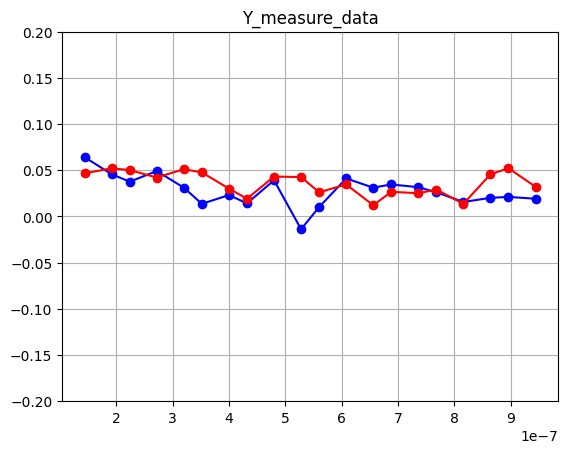

0.14988384011128564 0.054196594747374725 0.027946765442831686 600


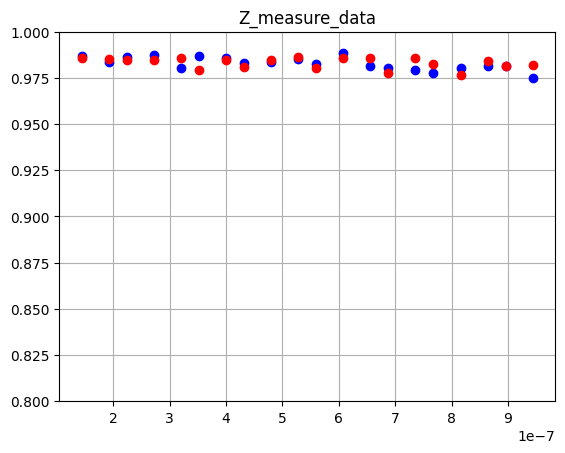

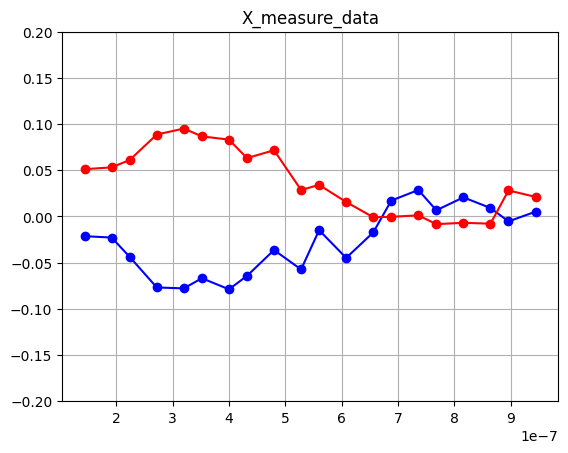

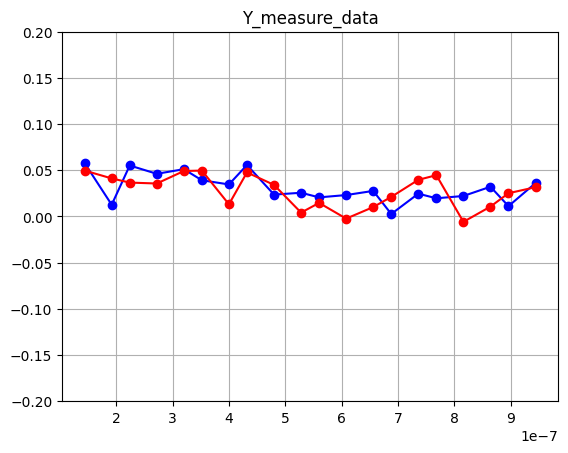

0.15746744370411117 0.05983397627481826 0.026235343429572573 600


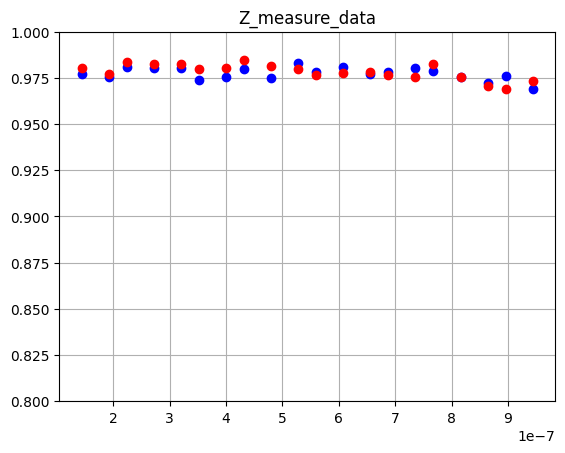

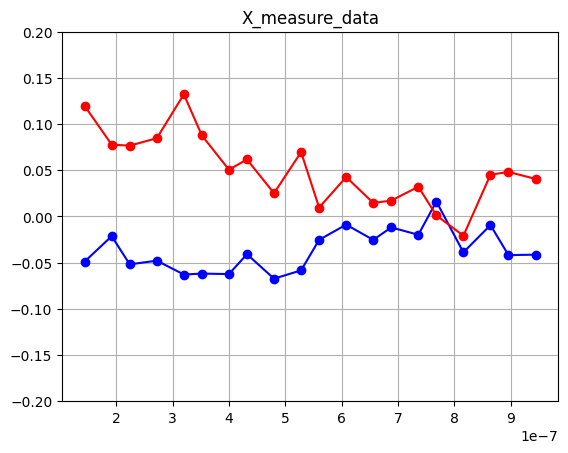

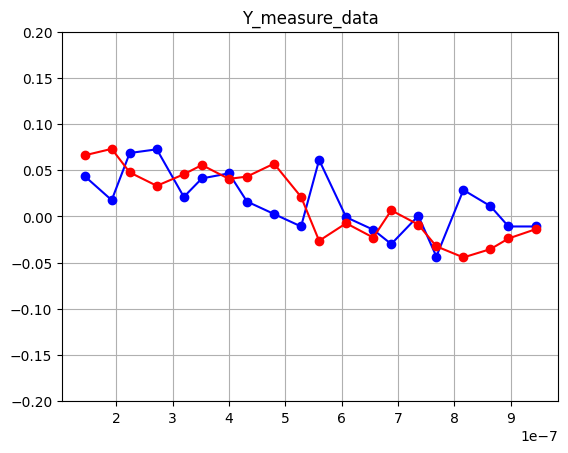

In [ ]:
ecr_test(10)

0.10722142868729484 0.06305007062489525 -0.0077695843447728044 600


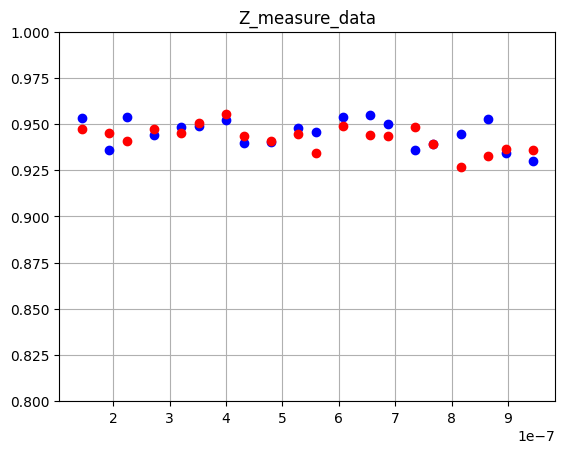

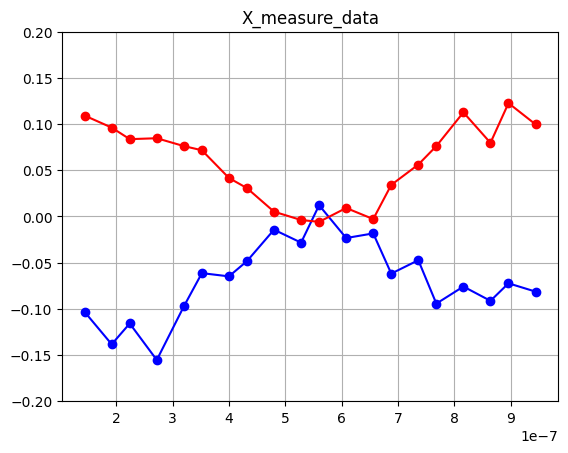

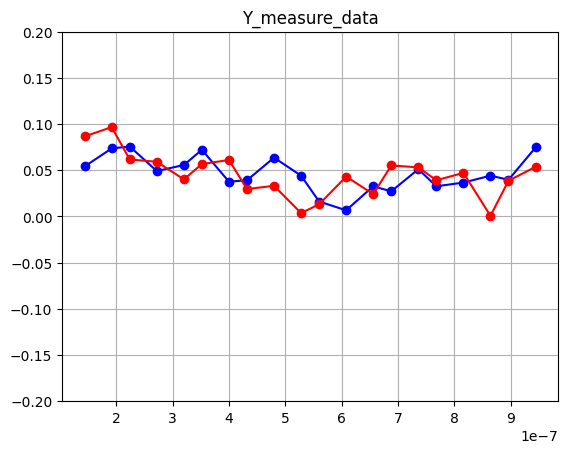

0.12961987420785068 0.06390678518687737 0.02268574226023104 600


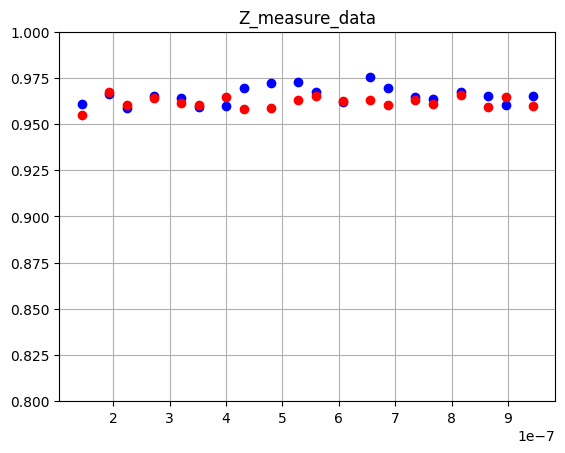

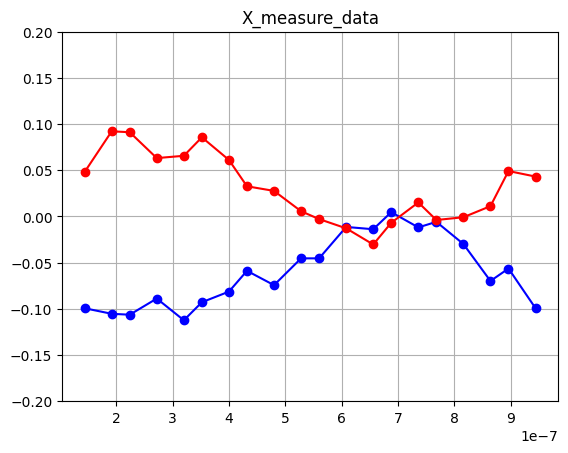

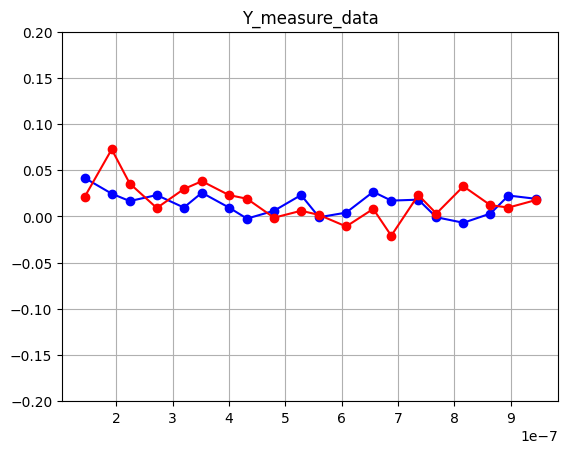

0.10952263074299179 0.06423628796861765 0.02735178631280858 600


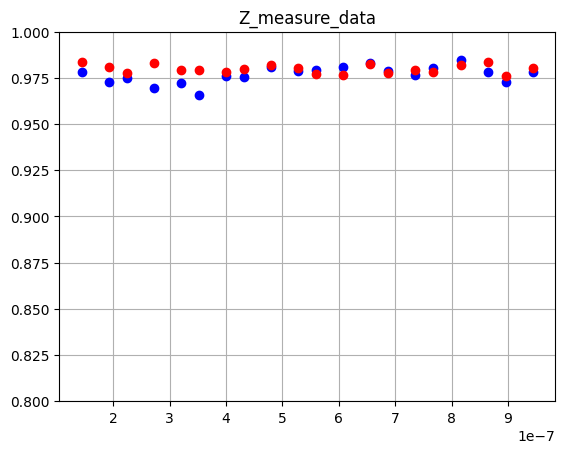

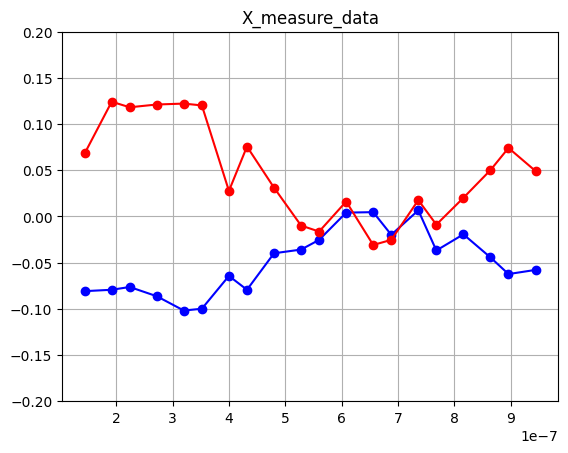

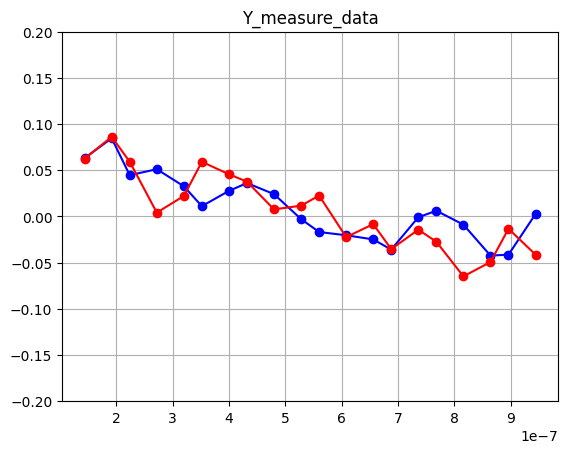

0.09998979967430136 0.07739520231695741 0.01208687154674435 600


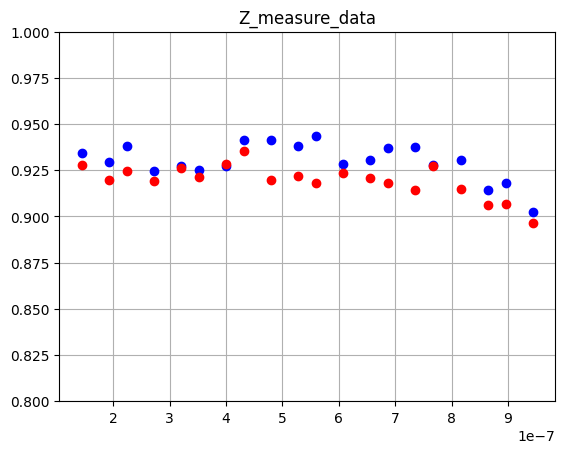

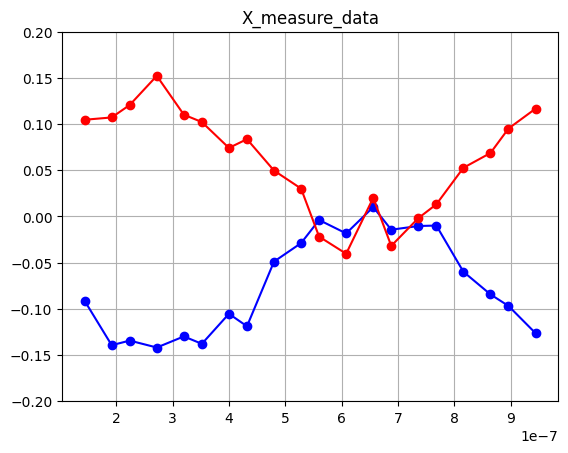

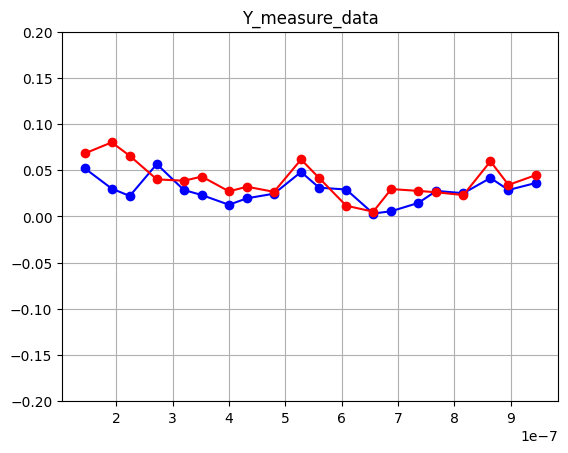

0.19326202801370715 0.06661636211416412 0.03241800369093789 600


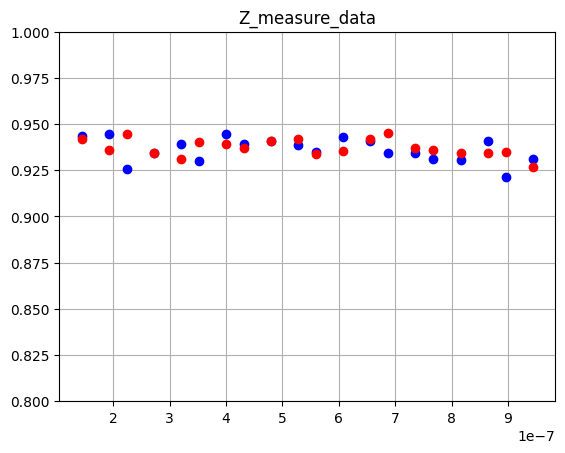

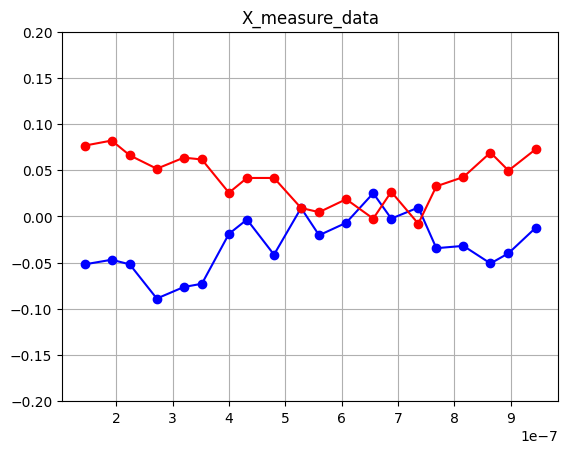

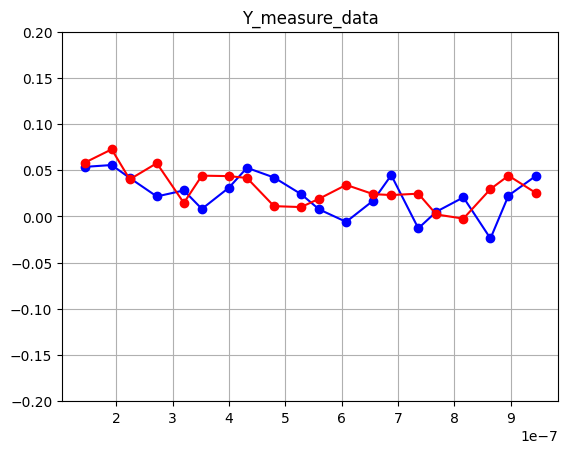

0.14988384011128564 0.05898267607504671 0.025678536747462732 600


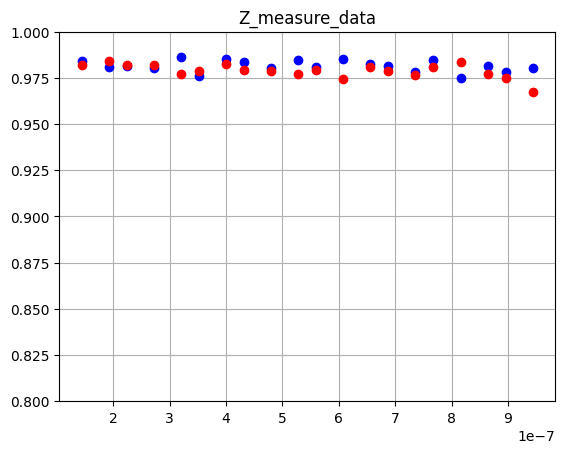

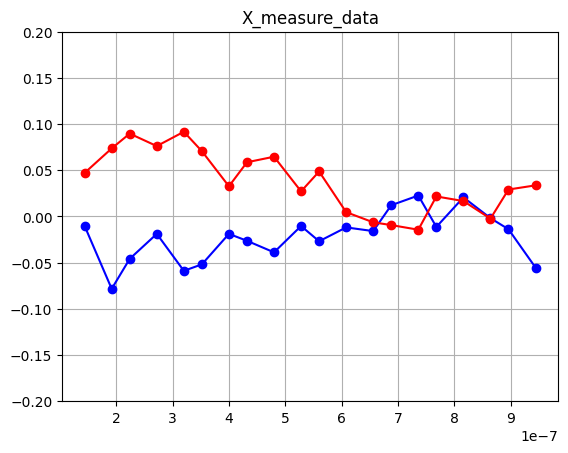

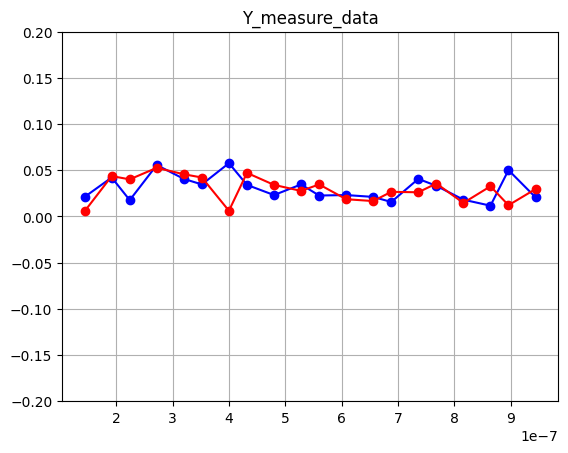

0.15746744370411117 0.06507248265925732 0.024122901410997027 600


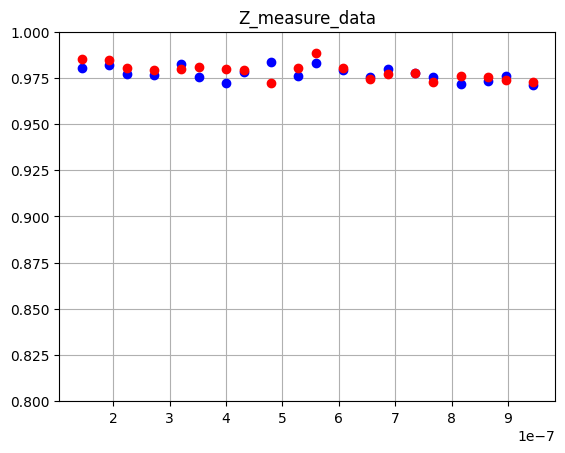

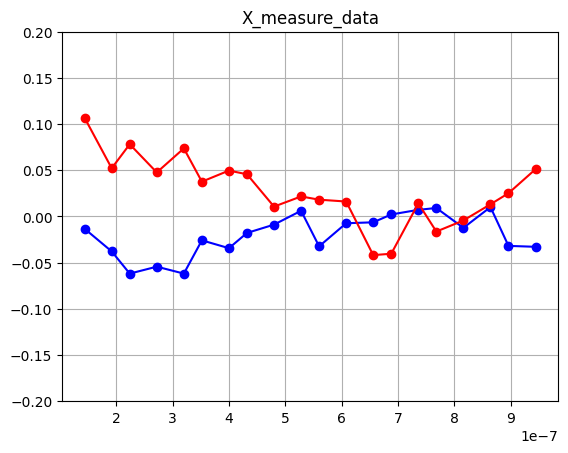

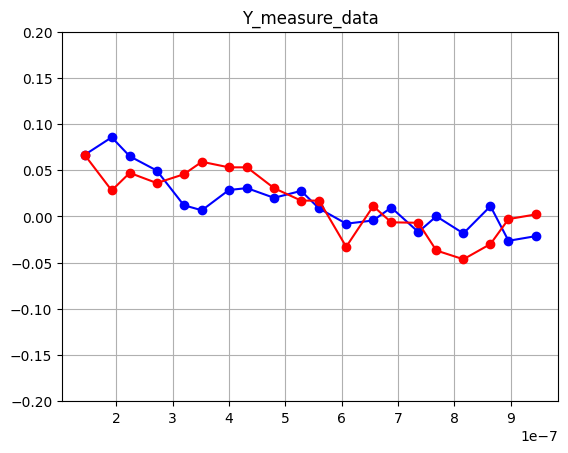

In [ ]:
ecr_test(11)